# XMM-LSS: Validation Checks (SUBSET)

In [23]:
%matplotlib inline
#%config InlineBackend.figure_format = 'svg'

import matplotlib.pyplot as plt
plt.rc('figure', figsize=(10, 6))
plt.style.use('ggplot')

import numpy as np
from astropy.table import Table
import itertools

import time


In [24]:
t0 = time.time()

catname = "/data/help/master_catalogue_xmm-lss_RANDOM10PCSAMPLE_20180221.fits"
master_catalogue = Table.read(catname)

print('Elapsed time(secs): ', time.time() - t0)

print("Number of sources in master catalogue: ", len(master_catalogue))

Elapsed time(secs):  48.781821966171265
Number of sources in master catalogue:  870476


In [25]:
field = master_catalogue["field"][0]
field = field.rstrip()    # remove whitespaces at the end of the sting
print(field)

XMM-LSS


In [26]:
%%javascript
IPython.OutputArea.auto_scroll_threshold = 9999;

<IPython.core.display.Javascript object>

## 1/ Magnitude errors

In [27]:
u_bands = ["Megacam u"]
g_bands = ["Megacam g", "DECam g", "SUPRIME g", "GPC1 g"]
r_bands = ["Megacam r", "DECam r", "SUPRIME r", "GPC1 r"]
i_bands = ["Megacam i", "DECam i", "SUPRIME i", "GPC1 i"]
z_bands = ["Megacam z", "DECam z", "SUPRIME z", "GPC1 z", "VISTA z"]
y_bands = ["Megacam y", "DECam y", "SUPRIME y", "GPC1 y", "VISTA y"]
J_bands = [                                               "VISTA J", "UKIDSS J", "WIRCAM J"]
H_bands = [                                               "VISTA H", "UKIDSS H", "WIRCAM H"]
K_bands = [                                               "VISTA Ks", "UKIDSS K", "WIRCAM Ks"]


all_bands = [u_bands, g_bands, r_bands, i_bands, z_bands, y_bands, J_bands, H_bands, K_bands]

irac_bands = ["IRAC i1", "IRAC i2", "IRAC i3", "IRAC i4"]

opt_mags = u_bands + g_bands + r_bands + i_bands + z_bands + y_bands
ir_mags = J_bands + H_bands + K_bands + irac_bands

other_bands = []

all_mags = opt_mags + ir_mags + other_bands

In [28]:
def mag_vs_err(x, y, fig, ax, labels=("x", "y"), savefig=False):

    x_label, y_label = labels
    print(x_label)

    # Use only finite values
    mask = np.isfinite(x) & np.isfinite(y) & (x!=99.) & (y!=99.)
    x = np.copy(x[mask])
    y = np.copy(y[mask])
   
    if len(x) == 0:
        print("No sources have {} values.".format(x_label))
        print("")
        return
  
    #"""
    if len(x) > 0:
        print("    Error max: {:.0f}".format(np.max(y)))
        err10 = y > 10
        if len(x[err10]) > 0:
            print("    magerr > 10: Number of objects = {:d}, min mag = {:.1f}".format(len(x[err10]), np.min(x[err10])))
        else:
            print("    magerr > 10: Number of objects = {:d}, min mag = {:.1f}".format(len(x[err10]), np.nan))
        err100 = y > 100
        if len(x[err100]) > 0:
            print("    magerr > 100: Number of objects = {:d}, min mag = {:.1f}".format(len(x[err100]), np.min(x[err100])))
        else:
            print("    magerr > 100: Number of objects = {:d}, min mag = {:.1f}".format(len(x[err100]), np.nan))
        err1000 = y > 1000
        if len(x[err1000]) > 0:
            print("    magerr > 1000: Number of objects = {:d}, min mag = {:.1f}".format(len(x[err1000]), np.min(x[err1000])))
        else:
            print("    magerr > 1000: Number of objects = {:d}, min mag = {:.1f}".format(len(x[err1000]), np.nan))
    else:
        print("    no data")
    print("")
    #"""

    # Plot
    ax.set_yscale('log')    # to place before scatter to avoid issues
    ax.scatter(x, y, marker='.', alpha=0.1, s=50)
    ax.invert_xaxis()
    ax.set_xlabel(labels[0])
    ax.set_ylabel(labels[1])

    # Save ex. fig
    if savefig:
        survey_label = ((x_label.replace(" ", "_")).replace("(", "")).replace(")", "")
        figname = field + "_magVSmagerr_" + survey_label + ".png"
        plt.savefig("/data/help/plots/" + figname, bbox_inches='tight')

        

Megacam u mag (aperture)
    Error max: 84
    magerr > 10: Number of objects = 95, min mag = 30.4
    magerr > 100: Number of objects = 0, min mag = nan
    magerr > 1000: Number of objects = 0, min mag = nan

Megacam u mag (total)
    Error max: 366
    magerr > 10: Number of objects = 141, min mag = 29.4
    magerr > 100: Number of objects = 4, min mag = 34.4
    magerr > 1000: Number of objects = 0, min mag = nan



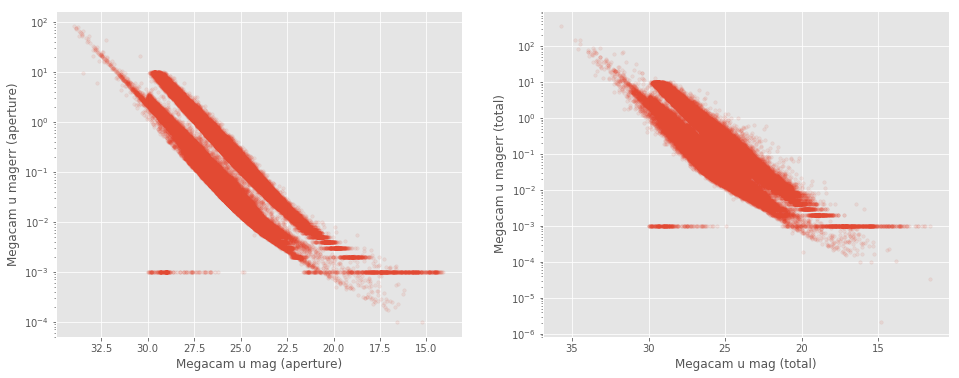

Megacam g mag (aperture)
    Error max: 64
    magerr > 10: Number of objects = 49, min mag = 31.8
    magerr > 100: Number of objects = 0, min mag = nan
    magerr > 1000: Number of objects = 0, min mag = nan

Megacam g mag (total)
    Error max: 87
    magerr > 10: Number of objects = 41, min mag = 31.2
    magerr > 100: Number of objects = 0, min mag = nan
    magerr > 1000: Number of objects = 0, min mag = nan



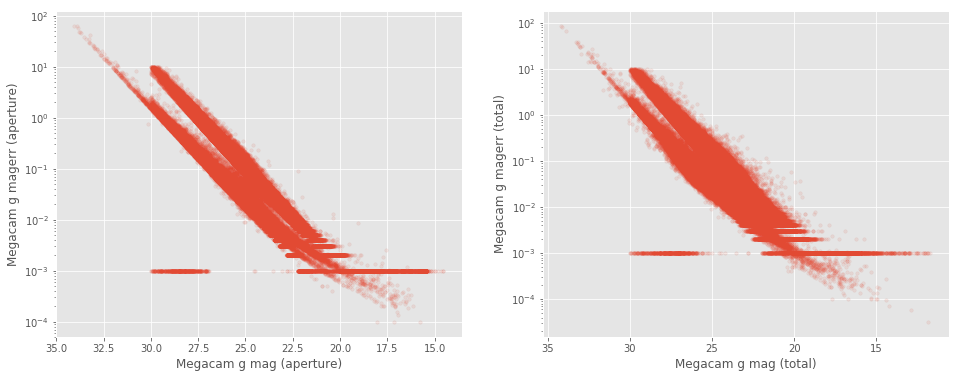

DECam g mag (aperture)
    Error max: 1576932
    magerr > 10: Number of objects = 729, min mag = 27.9
    magerr > 100: Number of objects = 83, min mag = 30.3
    magerr > 1000: Number of objects = 6, min mag = 32.7

DECam g mag (total)
    Error max: 10210
    magerr > 10: Number of objects = 736, min mag = 24.3
    magerr > 100: Number of objects = 68, min mag = 28.3
    magerr > 1000: Number of objects = 2, min mag = 34.6



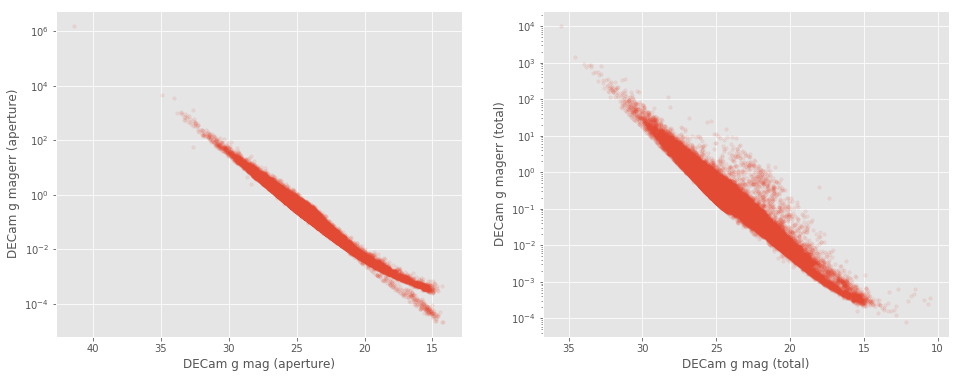

SUPRIME g mag (aperture)
    Error max: 63963492515840
    magerr > 10: Number of objects = 5197, min mag = 29.7
    magerr > 100: Number of objects = 2482, min mag = 32.4
    magerr > 1000: Number of objects = 1173, min mag = 34.8

SUPRIME g mag (total)
    Error max: 2488333238272
    magerr > 10: Number of objects = 3463, min mag = 27.9
    magerr > 100: Number of objects = 997, min mag = 30.8
    magerr > 1000: Number of objects = 365, min mag = 33.9



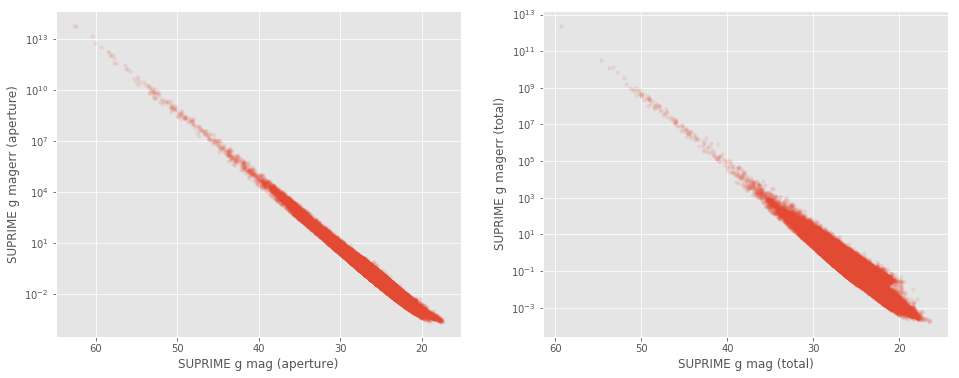

GPC1 g mag (aperture)
    Error max: 31340
    magerr > 10: Number of objects = 206, min mag = 13.2
    magerr > 100: Number of objects = 20, min mag = 13.2
    magerr > 1000: Number of objects = 4, min mag = 13.2

GPC1 g mag (total)
    Error max: 24452
    magerr > 10: Number of objects = 229, min mag = 12.7
    magerr > 100: Number of objects = 18, min mag = 12.7
    magerr > 1000: Number of objects = 5, min mag = 12.7



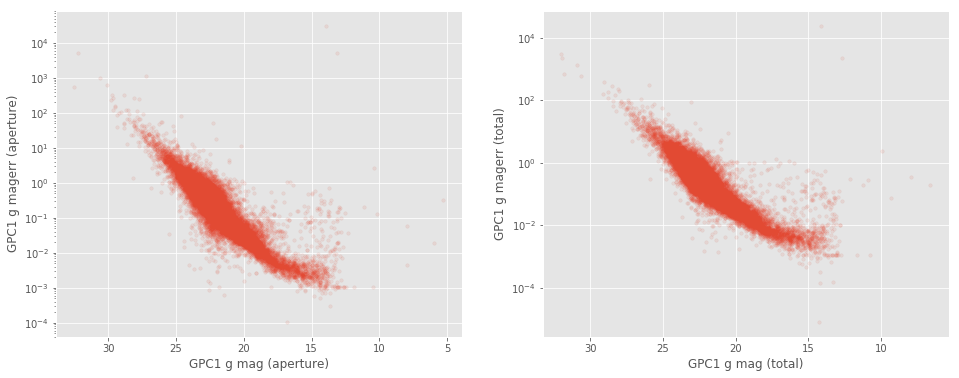

Megacam r mag (aperture)
    Error max: 79
    magerr > 10: Number of objects = 46, min mag = 31.6
    magerr > 100: Number of objects = 0, min mag = nan
    magerr > 1000: Number of objects = 0, min mag = nan

Megacam r mag (total)
    Error max: 65
    magerr > 10: Number of objects = 34, min mag = 29.0
    magerr > 100: Number of objects = 0, min mag = nan
    magerr > 1000: Number of objects = 0, min mag = nan



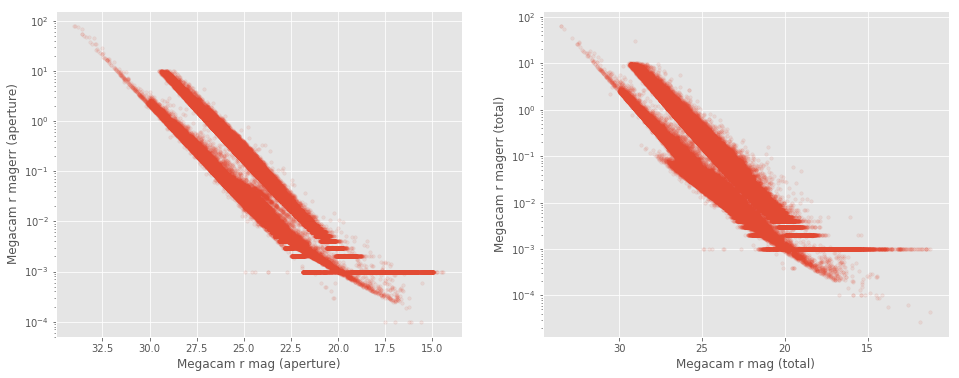

DECam r mag (aperture)
    Error max: 7099
    magerr > 10: Number of objects = 599, min mag = 27.1
    magerr > 100: Number of objects = 48, min mag = 29.9
    magerr > 1000: Number of objects = 2, min mag = 33.8

DECam r mag (total)
    Error max: 8578
    magerr > 10: Number of objects = 294, min mag = 22.8
    magerr > 100: Number of objects = 31, min mag = 26.8
    magerr > 1000: Number of objects = 7, min mag = 33.5



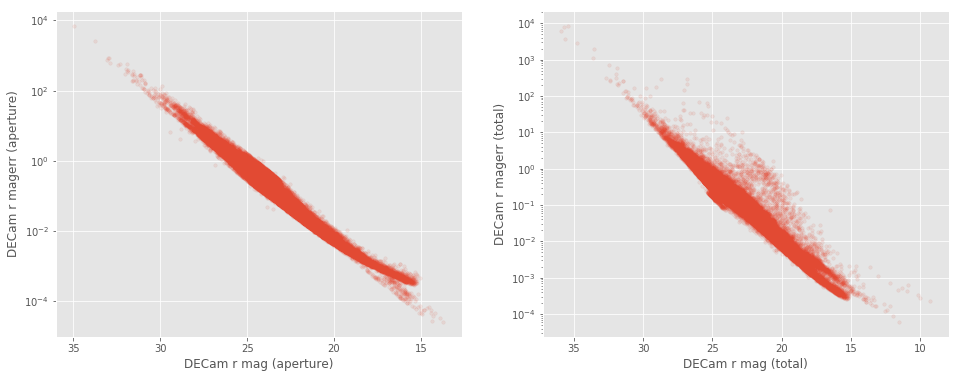

SUPRIME r mag (aperture)
    Error max: 42141074063360
    magerr > 10: Number of objects = 3218, min mag = 29.2
    magerr > 100: Number of objects = 1479, min mag = 31.7
    magerr > 1000: Number of objects = 828, min mag = 34.4

SUPRIME r mag (total)
    Error max: 636660482048
    magerr > 10: Number of objects = 2622, min mag = 19.3
    magerr > 100: Number of objects = 641, min mag = 30.8
    magerr > 1000: Number of objects = 290, min mag = 33.4



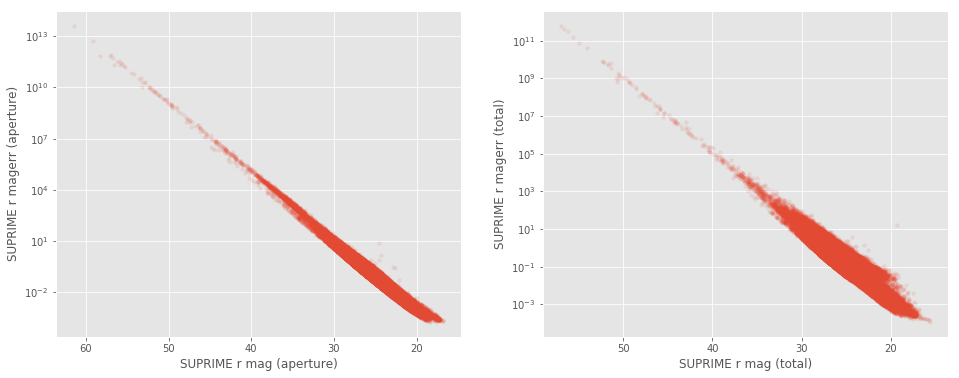

GPC1 r mag (aperture)
    Error max: 342
    magerr > 10: Number of objects = 61, min mag = 24.3
    magerr > 100: Number of objects = 6, min mag = 27.7
    magerr > 1000: Number of objects = 0, min mag = nan

GPC1 r mag (total)
    Error max: 1037
    magerr > 10: Number of objects = 71, min mag = 23.8
    magerr > 100: Number of objects = 5, min mag = 27.5
    magerr > 1000: Number of objects = 1, min mag = 31.1



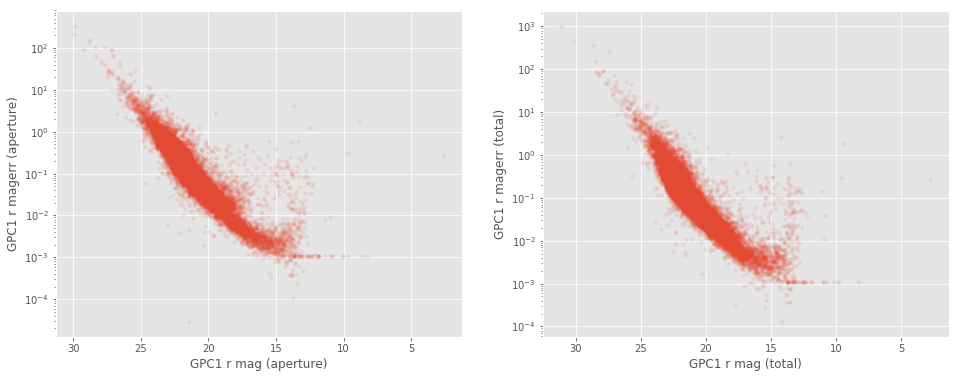

Megacam i mag (aperture)
    Error max: 79
    magerr > 10: Number of objects = 54, min mag = 30.1
    magerr > 100: Number of objects = 0, min mag = nan
    magerr > 1000: Number of objects = 0, min mag = nan

Megacam i mag (total)
    Error max: 82
    magerr > 10: Number of objects = 39, min mag = 30.0
    magerr > 100: Number of objects = 0, min mag = nan
    magerr > 1000: Number of objects = 0, min mag = nan



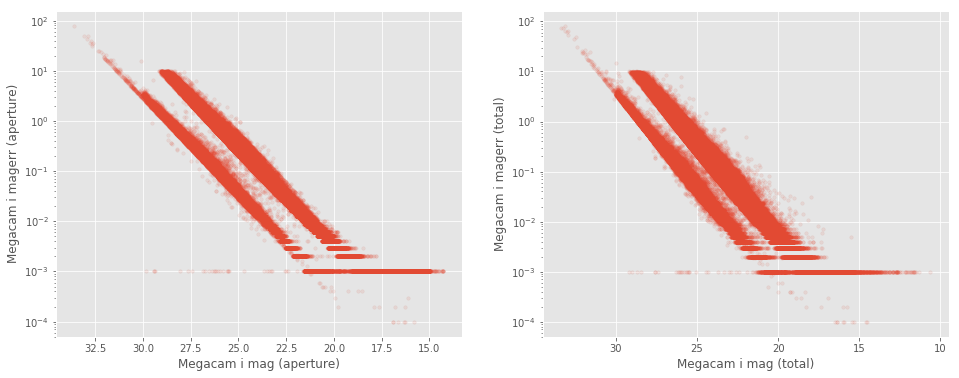

DECam i mag (aperture)
    Error max: 73
    magerr > 10: Number of objects = 23, min mag = 27.3
    magerr > 100: Number of objects = 0, min mag = nan
    magerr > 1000: Number of objects = 0, min mag = nan

DECam i mag (total)
    Error max: 877
    magerr > 10: Number of objects = 38, min mag = 26.9
    magerr > 100: Number of objects = 3, min mag = 30.0
    magerr > 1000: Number of objects = 0, min mag = nan



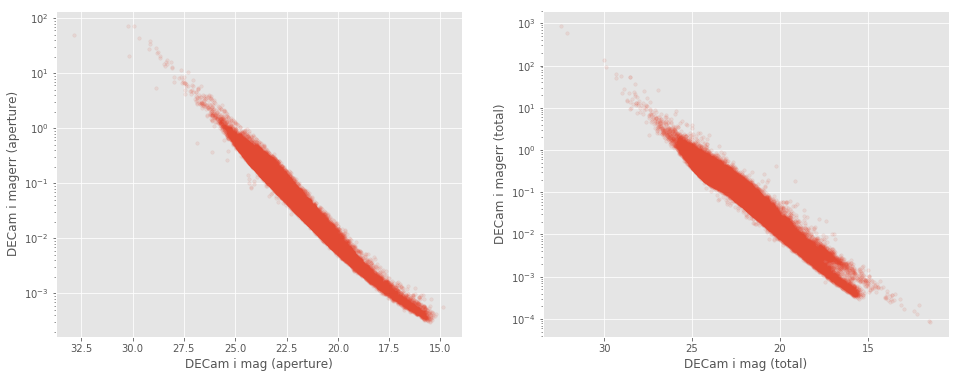

SUPRIME i mag (aperture)
    Error max: 267666063360
    magerr > 10: Number of objects = 3695, min mag = 28.2
    magerr > 100: Number of objects = 2054, min mag = 31.3
    magerr > 1000: Number of objects = 1381, min mag = 33.7

SUPRIME i mag (total)
    Error max: 6804185600
    magerr > 10: Number of objects = 3113, min mag = 27.0
    magerr > 100: Number of objects = 1149, min mag = 30.0
    magerr > 1000: Number of objects = 671, min mag = 33.3



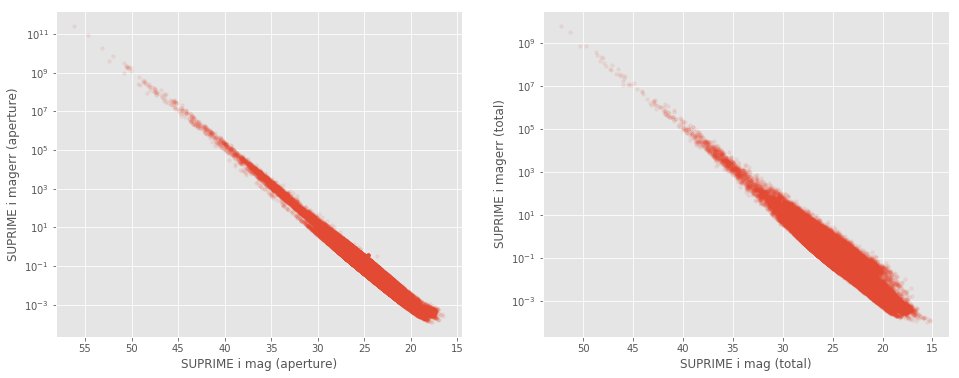

GPC1 i mag (aperture)
    Error max: 50
    magerr > 10: Number of objects = 20, min mag = 22.4
    magerr > 100: Number of objects = 0, min mag = nan
    magerr > 1000: Number of objects = 0, min mag = nan

GPC1 i mag (total)
    Error max: 112
    magerr > 10: Number of objects = 30, min mag = 24.3
    magerr > 100: Number of objects = 1, min mag = 28.3
    magerr > 1000: Number of objects = 0, min mag = nan



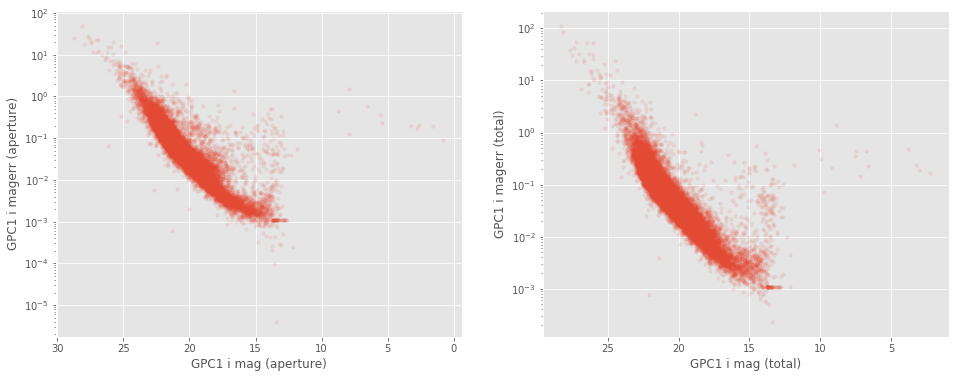

Megacam z mag (aperture)
    Error max: 87
    magerr > 10: Number of objects = 73, min mag = 29.8
    magerr > 100: Number of objects = 0, min mag = nan
    magerr > 1000: Number of objects = 0, min mag = nan

Megacam z mag (total)
    Error max: 84
    magerr > 10: Number of objects = 94, min mag = 29.1
    magerr > 100: Number of objects = 0, min mag = nan
    magerr > 1000: Number of objects = 0, min mag = nan



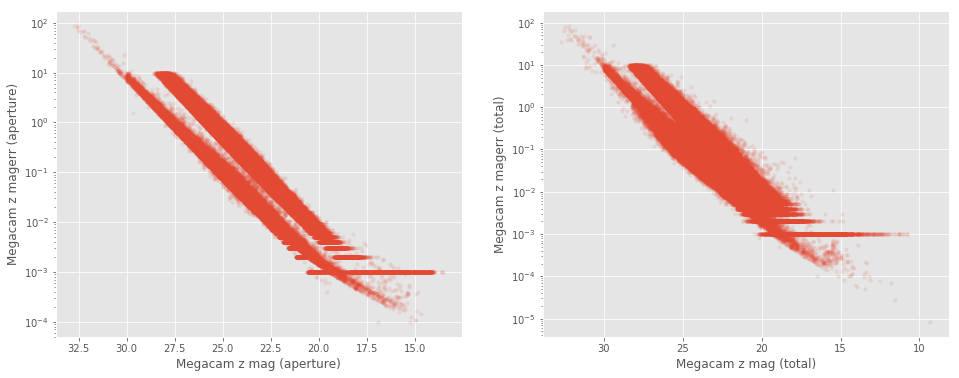

DECam z mag (aperture)
    Error max: 73685
    magerr > 10: Number of objects = 908, min mag = 26.0
    magerr > 100: Number of objects = 103, min mag = 28.9
    magerr > 1000: Number of objects = 10, min mag = 32.0

DECam z mag (total)
    Error max: 31462
    magerr > 10: Number of objects = 750, min mag = 15.0
    magerr > 100: Number of objects = 79, min mag = 29.1
    magerr > 1000: Number of objects = 9, min mag = 31.8



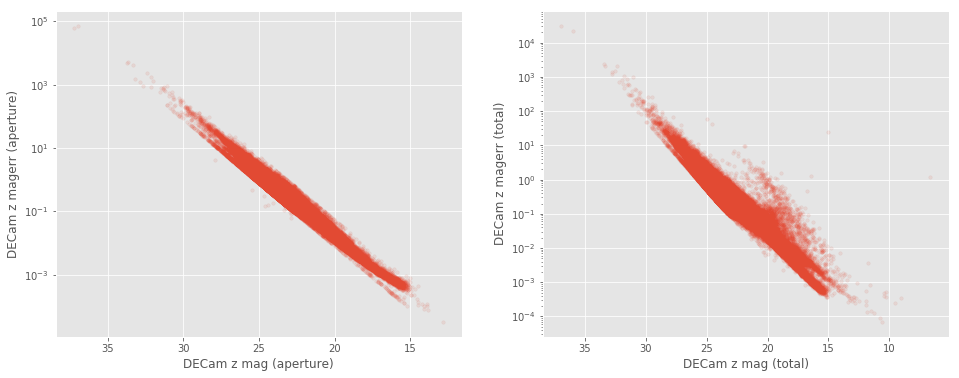

SUPRIME z mag (aperture)
    Error max: 2938778157056
    magerr > 10: Number of objects = 10523, min mag = 27.8
    magerr > 100: Number of objects = 4669, min mag = 30.3
    magerr > 1000: Number of objects = 1964, min mag = 32.8

SUPRIME z mag (total)
    Error max: 145206018048
    magerr > 10: Number of objects = 6936, min mag = 26.1
    magerr > 100: Number of objects = 1778, min mag = 28.3
    magerr > 1000: Number of objects = 560, min mag = 32.5



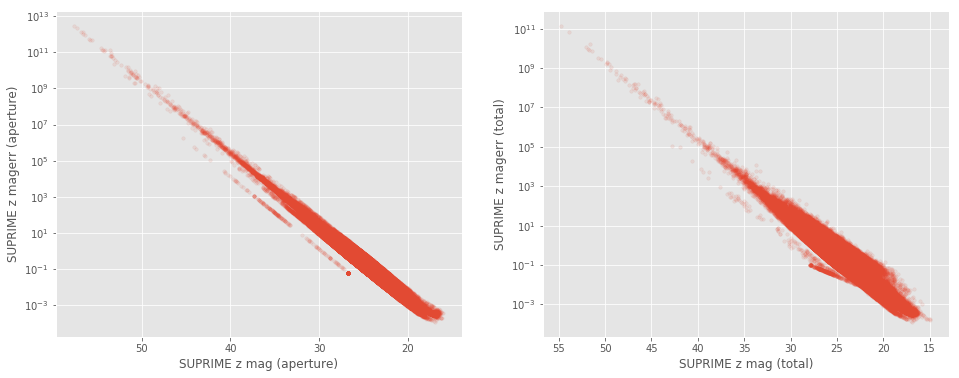

GPC1 z mag (aperture)
    Error max: 566
    magerr > 10: Number of objects = 29, min mag = 8.1
    magerr > 100: Number of objects = 4, min mag = 26.8
    magerr > 1000: Number of objects = 0, min mag = nan

GPC1 z mag (total)
    Error max: 804
    magerr > 10: Number of objects = 50, min mag = 2.2
    magerr > 100: Number of objects = 3, min mag = 27.3
    magerr > 1000: Number of objects = 0, min mag = nan



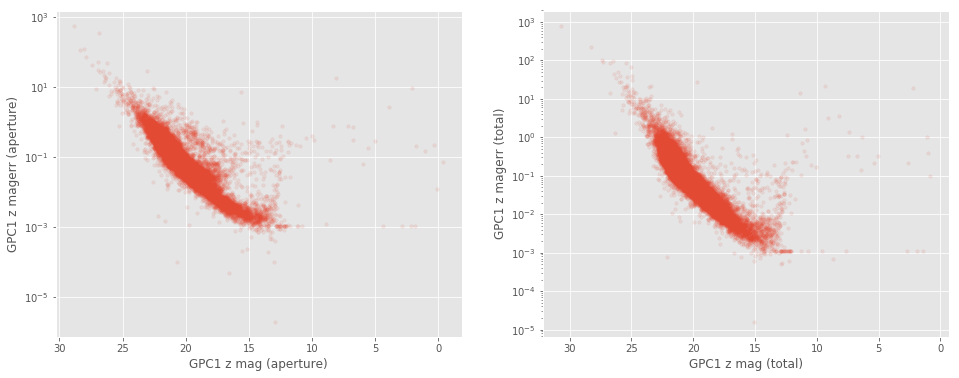

VISTA z mag (aperture)
    Error max: 599
    magerr > 10: Number of objects = 1528, min mag = 21.0
    magerr > 100: Number of objects = 1, min mag = 21.7
    magerr > 1000: Number of objects = 0, min mag = nan

VISTA z mag (total)
    Error max: 599
    magerr > 10: Number of objects = 1630, min mag = 26.2
    magerr > 100: Number of objects = 1, min mag = 29.4
    magerr > 1000: Number of objects = 0, min mag = nan



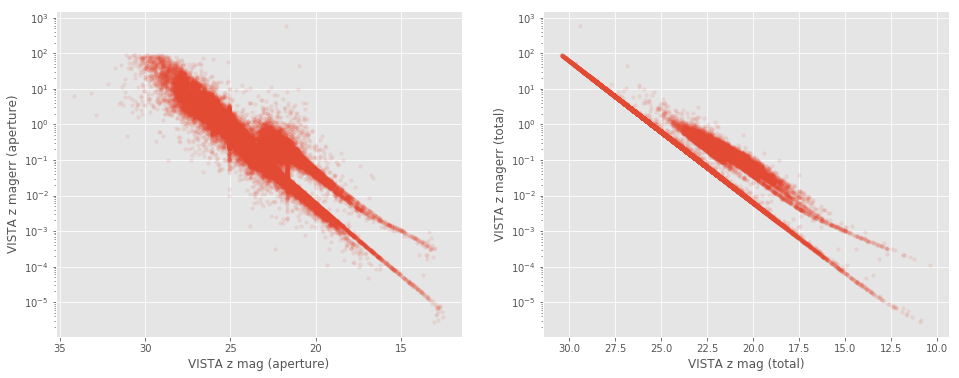

Megacam y mag (aperture)
    Error max: 9
    magerr > 10: Number of objects = 0, min mag = nan
    magerr > 100: Number of objects = 0, min mag = nan
    magerr > 1000: Number of objects = 0, min mag = nan

Megacam y mag (total)
    Error max: 796
    magerr > 10: Number of objects = 16, min mag = 29.4
    magerr > 100: Number of objects = 1, min mag = 33.8
    magerr > 1000: Number of objects = 0, min mag = nan



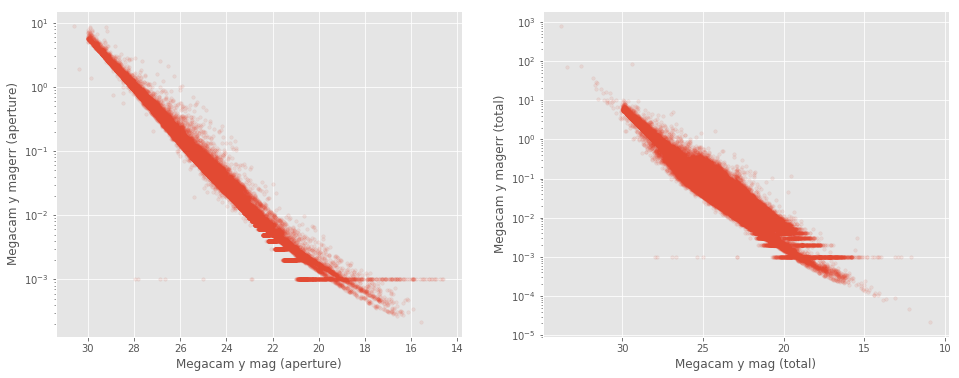

DECam y mag (aperture)
    Error max: 26913
    magerr > 10: Number of objects = 1910, min mag = 24.9
    magerr > 100: Number of objects = 193, min mag = 28.0
    magerr > 1000: Number of objects = 16, min mag = 30.9

DECam y mag (total)
    Error max: 430094
    magerr > 10: Number of objects = 2601, min mag = 23.8
    magerr > 100: Number of objects = 247, min mag = 27.2
    magerr > 1000: Number of objects = 35, min mag = 30.3



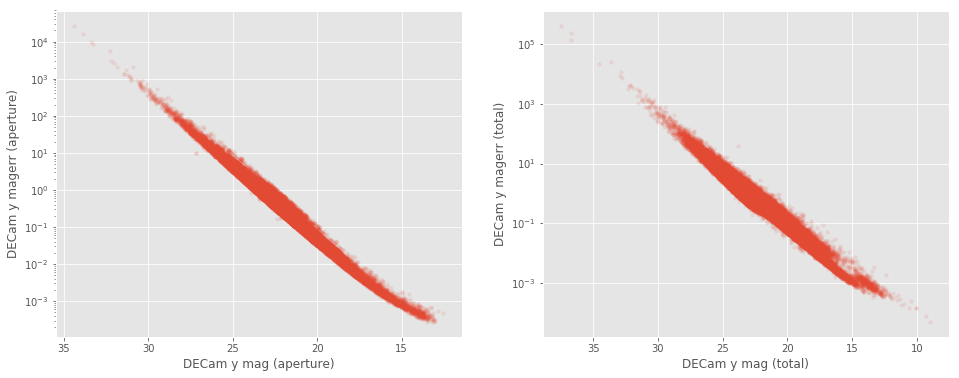

SUPRIME y mag (aperture)
    Error max: 189478338560
    magerr > 10: Number of objects = 17483, min mag = 27.1
    magerr > 100: Number of objects = 6926, min mag = 29.7
    magerr > 1000: Number of objects = 2042, min mag = 32.4

SUPRIME y mag (total)
    Error max: 15403970560
    magerr > 10: Number of objects = 10391, min mag = 25.0
    magerr > 100: Number of objects = 2327, min mag = 27.6
    magerr > 1000: Number of objects = 595, min mag = 31.1



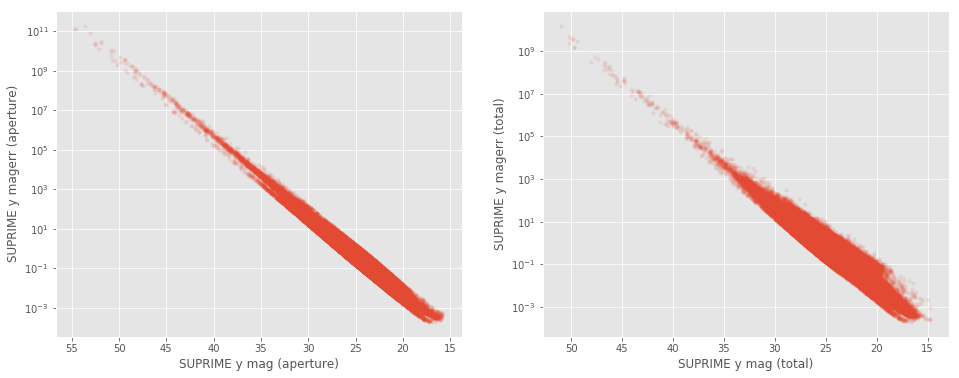

GPC1 y mag (aperture)
    Error max: 15721800
    magerr > 10: Number of objects = 131, min mag = 3.3
    magerr > 100: Number of objects = 16, min mag = 9.1
    magerr > 1000: Number of objects = 4, min mag = 9.7

GPC1 y mag (total)
    Error max: 5316
    magerr > 10: Number of objects = 182, min mag = 2.6
    magerr > 100: Number of objects = 23, min mag = 3.4
    magerr > 1000: Number of objects = 4, min mag = 8.9



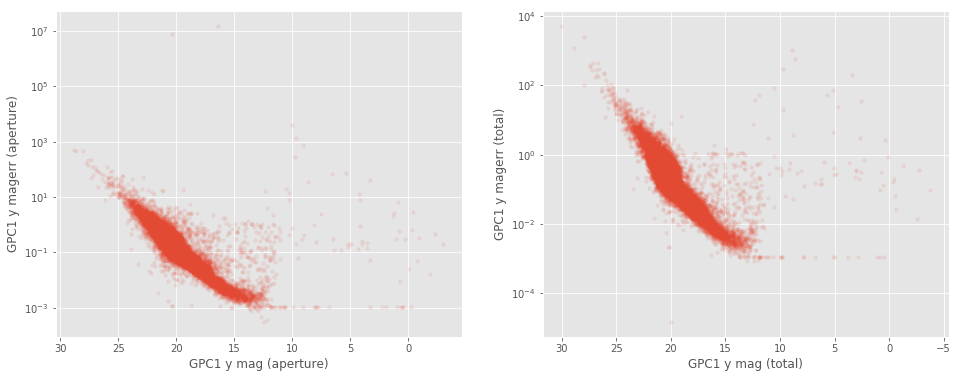

VISTA y mag (aperture)
    Error max: 86
    magerr > 10: Number of objects = 380, min mag = 20.5
    magerr > 100: Number of objects = 0, min mag = nan
    magerr > 1000: Number of objects = 0, min mag = nan

VISTA y mag (total)
    Error max: 86
    magerr > 10: Number of objects = 608, min mag = 25.5
    magerr > 100: Number of objects = 0, min mag = nan
    magerr > 1000: Number of objects = 0, min mag = nan



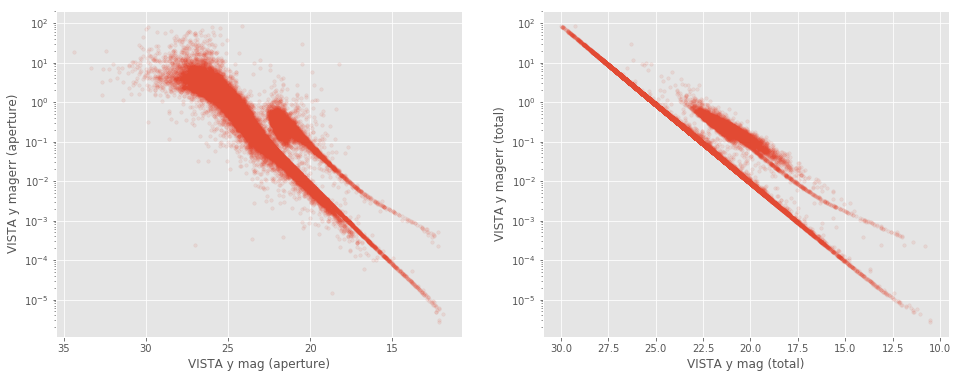

VISTA J mag (aperture)
    Error max: 298
    magerr > 10: Number of objects = 725, min mag = 18.0
    magerr > 100: Number of objects = 8, min mag = 19.1
    magerr > 1000: Number of objects = 0, min mag = nan

VISTA J mag (total)
    Error max: 298
    magerr > 10: Number of objects = 1226, min mag = 20.6
    magerr > 100: Number of objects = 8, min mag = 26.9
    magerr > 1000: Number of objects = 0, min mag = nan



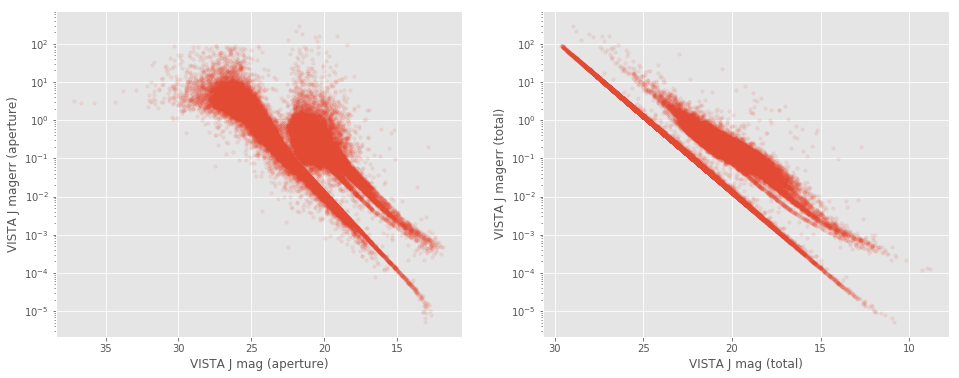

UKIDSS J mag (aperture)
    Error max: 200
    magerr > 10: Number of objects = 21, min mag = 28.0
    magerr > 100: Number of objects = 1, min mag = 33.3
    magerr > 1000: Number of objects = 0, min mag = nan

UKIDSS J mag (total)
    Error max: 1508
    magerr > 10: Number of objects = 46, min mag = 27.4
    magerr > 100: Number of objects = 6, min mag = 30.6
    magerr > 1000: Number of objects = 1, min mag = 35.3



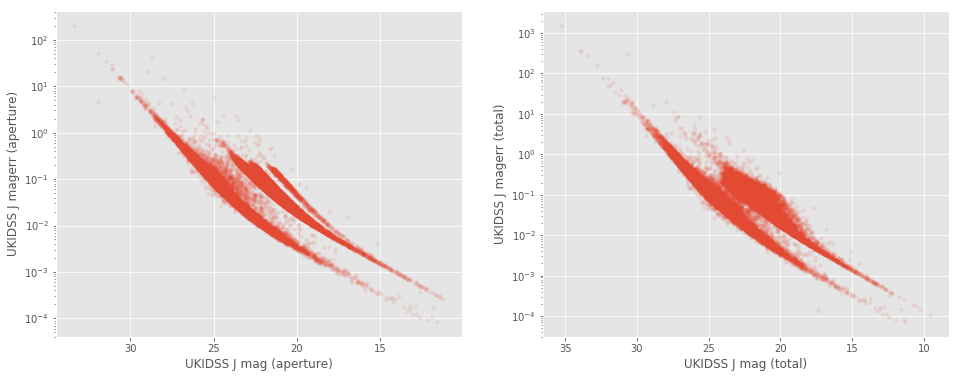

WIRCAM J mag (aperture)
    Error max: 66
    magerr > 10: Number of objects = 81, min mag = 27.0
    magerr > 100: Number of objects = 0, min mag = nan
    magerr > 1000: Number of objects = 0, min mag = nan

WIRCAM J mag (total)
    Error max: 84
    magerr > 10: Number of objects = 80, min mag = 27.5
    magerr > 100: Number of objects = 0, min mag = nan
    magerr > 1000: Number of objects = 0, min mag = nan



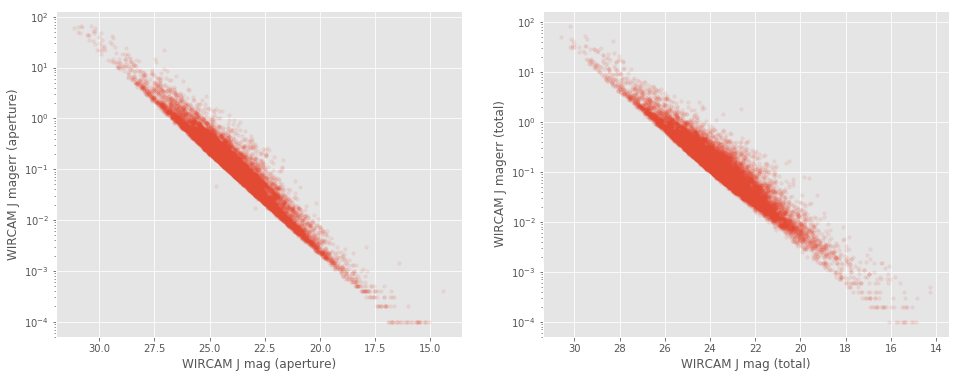

VISTA H mag (aperture)
    Error max: 687
    magerr > 10: Number of objects = 951, min mag = 18.7
    magerr > 100: Number of objects = 4, min mag = 18.7
    magerr > 1000: Number of objects = 0, min mag = nan

VISTA H mag (total)
    Error max: 687
    magerr > 10: Number of objects = 1627, min mag = 22.2
    magerr > 100: Number of objects = 4, min mag = 23.8
    magerr > 1000: Number of objects = 0, min mag = nan



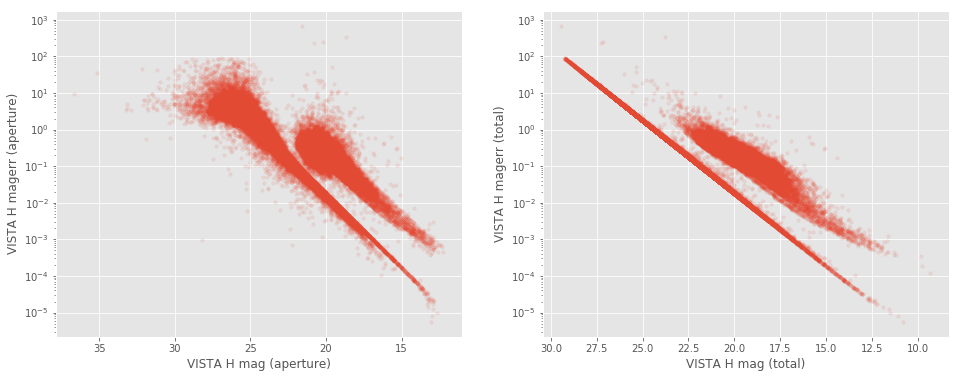

UKIDSS H mag (aperture)
    Error max: 346
    magerr > 10: Number of objects = 38, min mag = 27.2
    magerr > 100: Number of objects = 3, min mag = 32.6
    magerr > 1000: Number of objects = 0, min mag = nan

UKIDSS H mag (total)
    Error max: 3121
    magerr > 10: Number of objects = 82, min mag = 28.8
    magerr > 100: Number of objects = 9, min mag = 31.7
    magerr > 1000: Number of objects = 2, min mag = 35.2



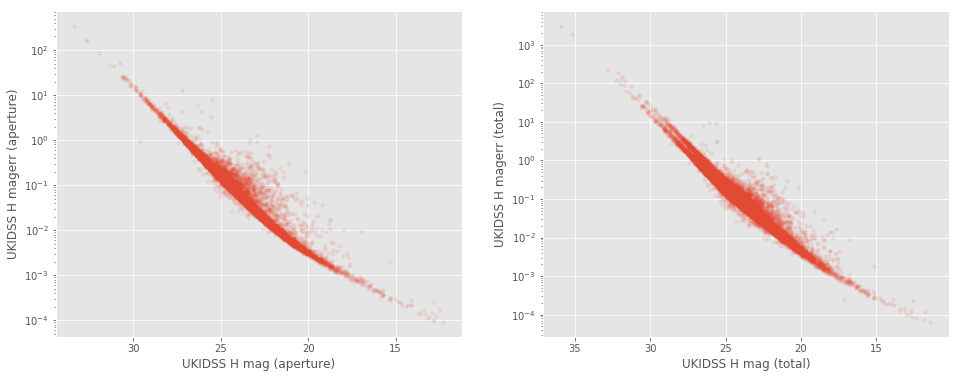

WIRCAM H mag (aperture)
    Error max: 84
    magerr > 10: Number of objects = 81, min mag = 26.8
    magerr > 100: Number of objects = 0, min mag = nan
    magerr > 1000: Number of objects = 0, min mag = nan

WIRCAM H mag (total)
    Error max: 70
    magerr > 10: Number of objects = 72, min mag = 26.7
    magerr > 100: Number of objects = 0, min mag = nan
    magerr > 1000: Number of objects = 0, min mag = nan



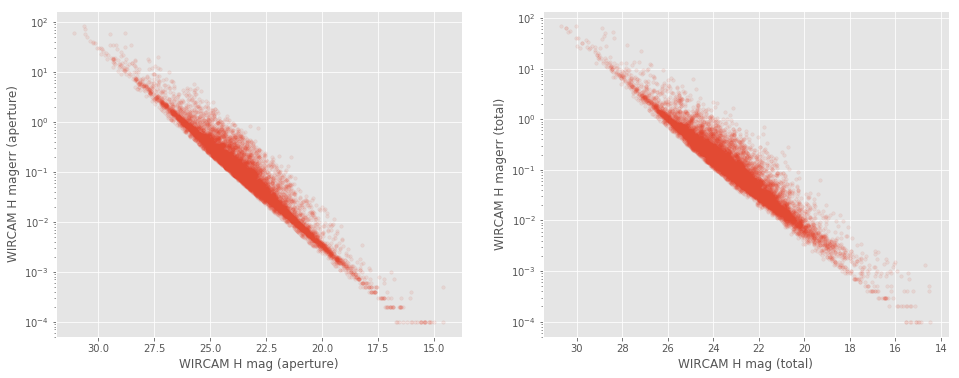

VISTA Ks mag (aperture)
    Error max: 126
    magerr > 10: Number of objects = 1436, min mag = 18.3
    magerr > 100: Number of objects = 1, min mag = 20.3
    magerr > 1000: Number of objects = 0, min mag = nan

VISTA Ks mag (total)
    Error max: 126
    magerr > 10: Number of objects = 2498, min mag = 20.5
    magerr > 100: Number of objects = 1, min mag = 27.0
    magerr > 1000: Number of objects = 0, min mag = nan



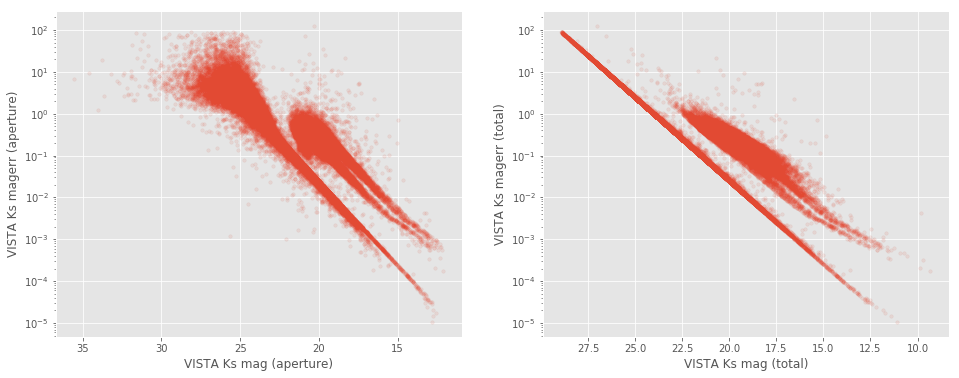

UKIDSS K mag (aperture)
    Error max: 1195
    magerr > 10: Number of objects = 3, min mag = 30.5
    magerr > 100: Number of objects = 1, min mag = 32.2
    magerr > 1000: Number of objects = 1, min mag = 32.2

UKIDSS K mag (total)
    Error max: 448
    magerr > 10: Number of objects = 25, min mag = 26.1
    magerr > 100: Number of objects = 4, min mag = 30.3
    magerr > 1000: Number of objects = 0, min mag = nan



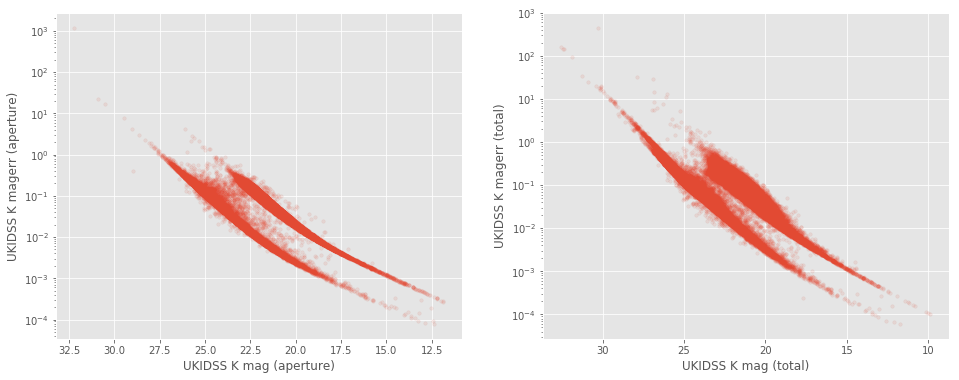

WIRCAM Ks mag (aperture)
    Error max: 54
    magerr > 10: Number of objects = 5, min mag = 28.8
    magerr > 100: Number of objects = 0, min mag = nan
    magerr > 1000: Number of objects = 0, min mag = nan

WIRCAM Ks mag (total)
    Error max: 2050
    magerr > 10: Number of objects = 82, min mag = 24.6
    magerr > 100: Number of objects = 7, min mag = 29.8
    magerr > 1000: Number of objects = 3, min mag = 31.9



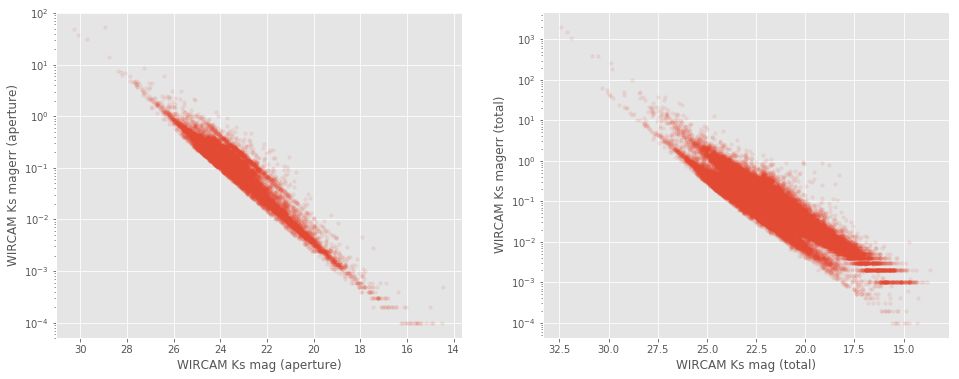

IRAC i1 mag (aperture)
    Error max: 1319
    magerr > 10: Number of objects = 83, min mag = 21.8
    magerr > 100: Number of objects = 9, min mag = 25.1
    magerr > 1000: Number of objects = 1, min mag = 32.8

IRAC i1 mag (total)
    Error max: 974
    magerr > 10: Number of objects = 103, min mag = 22.0
    magerr > 100: Number of objects = 9, min mag = 28.7
    magerr > 1000: Number of objects = 0, min mag = nan



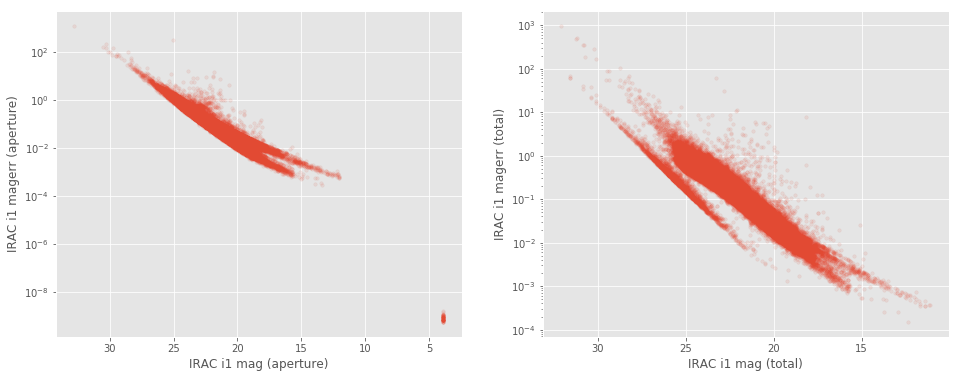

IRAC i2 mag (aperture)
    Error max: 3340
    magerr > 10: Number of objects = 161, min mag = 21.7
    magerr > 100: Number of objects = 15, min mag = 22.5
    magerr > 1000: Number of objects = 2, min mag = 32.9

IRAC i2 mag (total)
    Error max: 384
    magerr > 10: Number of objects = 127, min mag = 20.8
    magerr > 100: Number of objects = 11, min mag = 23.4
    magerr > 1000: Number of objects = 0, min mag = nan



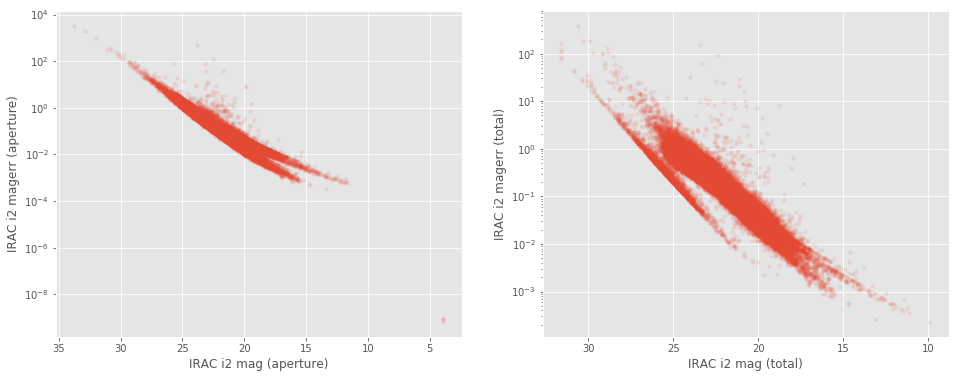

IRAC i3 mag (aperture)
    Error max: 0
    magerr > 10: Number of objects = 0, min mag = nan
    magerr > 100: Number of objects = 0, min mag = nan
    magerr > 1000: Number of objects = 0, min mag = nan

IRAC i3 mag (total)
    Error max: 1198
    magerr > 10: Number of objects = 145, min mag = 25.1
    magerr > 100: Number of objects = 12, min mag = 27.8
    magerr > 1000: Number of objects = 1, min mag = 30.4



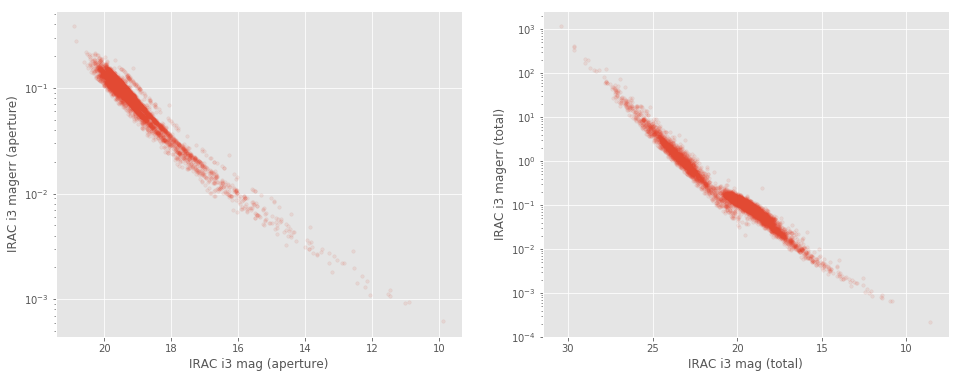

IRAC i4 mag (aperture)
    Error max: 0
    magerr > 10: Number of objects = 0, min mag = nan
    magerr > 100: Number of objects = 0, min mag = nan
    magerr > 1000: Number of objects = 0, min mag = nan

IRAC i4 mag (total)
    Error max: 1373
    magerr > 10: Number of objects = 135, min mag = 24.9
    magerr > 100: Number of objects = 16, min mag = 28.1
    magerr > 1000: Number of objects = 1, min mag = 30.8



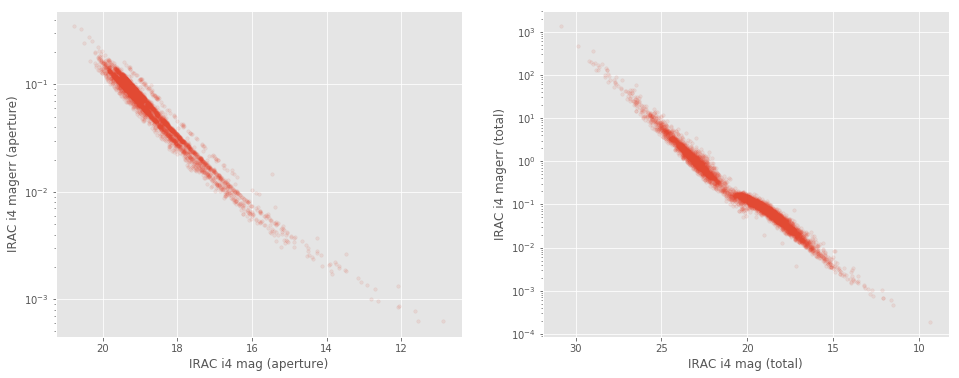

In [29]:
for mag in all_mags:
    
    fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(16, 6))
        
    basecol = mag.replace(" ", "_").lower()
    
    #if basecol == "omegacam_u":
    if basecol == "decam_g":
        savefig = True
    else:
        savefig=False
        
    col, ecol = "m_ap_{}".format(basecol), "merr_ap_{}".format(basecol)
    mag_vs_err(master_catalogue[col], master_catalogue[ecol], fig, ax1,
               labels=("{} mag (aperture)".format(mag), "{} magerr (aperture)".format(mag)), savefig=False)

    
    col, ecol = "m_{}".format(basecol), "merr_{}".format(basecol)
    mag_vs_err(master_catalogue[col], master_catalogue[ecol], fig, ax2,
               labels=("{} mag (total)".format(mag), "{} magerr (total)".format(mag)), savefig=savefig)
    
    display(fig)
    plt.close()


## 2. Magnitude and error issues

In [30]:
def flag_mag(mask, x1, y1, x2, y2, mask2=None, x3=None, y3=None, mask3=None,
             labels1=("x", "y"), labels2=("x", "y"), labels3=("x", "y"), nb=2,
             irac=False, savefig=False):

    if nb == 1 and not irac:
        fig, (ax1) = plt.subplots(ncols=1, figsize=(6, 6))
    elif nb == 2 or (nb == 1 and irac and x3 is None):
        fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(16, 6))
    elif nb > 2 or (nb == 1 and x3 is not None):
        fig, (ax1, ax2, ax3) = plt.subplots(ncols=3, figsize=(16, 6))
    
    # mag vs magerr
    ax1.set_yscale('log')    # to place before scatter to avoid issues
    ax1.scatter(x1, y1, marker='.', alpha=0.1, s=50)
    ax1.plot(x1[mask], y1[mask], 'b.')
    if mask2 is not None and nb >= 2:
        ax1.plot(x1[mask2], y1[mask2], 'g.')
    ax1.invert_xaxis()
    ax1.set_xlabel(labels1[0])
    ax1.set_ylabel(labels1[1])
    
    if nb == 1 and irac:
        # IRAC mag
        ax2.set_yscale('log')    # to place before scatter to avoid issues
        ax2.scatter(x2, y2, marker='.', alpha=0.1, s=50)
        ax2.plot(x2[mask2], y2[mask2], 'b.')
        ax2.invert_xaxis()
        ax2.set_xlabel(labels2[0])
        ax2.set_ylabel(labels2[1])
        
    if nb == 1 and x3 is not None:
        # IRAC mag with i3
        ax3.set_yscale('log')    # to place before scatter to avoid issues
        ax3.scatter(x3, y3, marker='.', alpha=0.1, s=50)
        ax3.plot(x3[mask3], y3[mask3], 'b.')
        ax3.invert_xaxis()
        ax3.set_xlabel(labels3[0])
        ax3.set_ylabel(labels3[1])
    
    # Comparing magnitudes
    if nb >= 2:
        ax2.scatter(x2, y2, marker='.', alpha=0.1, s=50)
        ax2.plot(x2[mask], y2[mask], 'b.')
        if mask2 is not None:
            ax2.plot(x2[mask2], y2[mask2], 'g.')
        ax2.invert_xaxis()
        ax2.invert_yaxis()
        ax2.set_xlabel(labels2[0])
        ax2.set_ylabel(labels2[1])
    
    if nb >= 3:
        ax3.scatter(x3, y3, marker='.', alpha=0.1, s=50)
        ax3.plot(x3[mask], y3[mask], 'b.')
        if mask2 is not None:
            ax3.plot(x3[mask2], y3[mask2], 'g.')
        ax3.invert_xaxis()
        ax3.invert_yaxis()
        ax3.set_xlabel(labels3[0])
        ax3.set_ylabel(labels3[1])
    
    # Save ex. fig
    if savefig:
        survey_label = ((labels1[0].replace(" ", "_")).replace("(", "")).replace(")", "")
        if "GPC1 " in labels1[0]:
            figname = field + "_gpc1Issues_" + survey_label + ".png"
        elif "DECam" in labels1[0]:
            figname = field + "_decamIssues_" + survey_label + ".png"
        elif "IRAC" in labels1[0]:
            figname = field + "_iracIssues_i1_i2.png"
        elif "WIRCS" in labels1[0]:
            figname = field + "_wircsIssues.png"
        plt.savefig("/data/help/plots/" + figname, bbox_inches='tight')
        
    display(fig)
    plt.close()

### 2.a Pan-STARRS Aperture and Total magnitudes

GPC1 g
   Number of flagged objects: 18


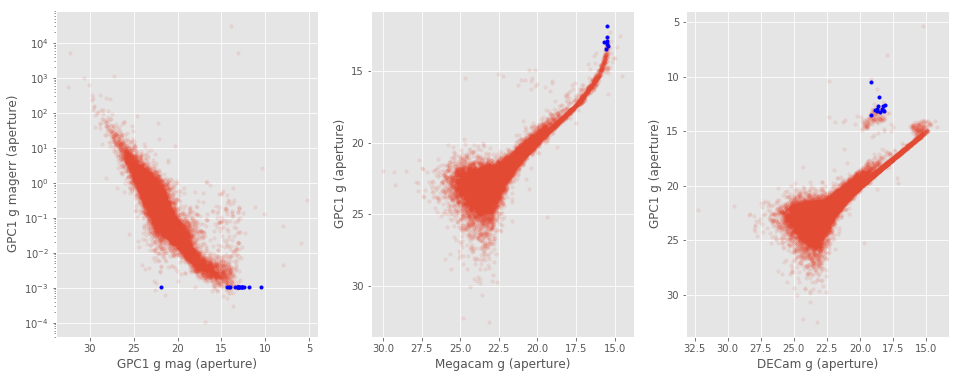

GPC1 r
   Number of flagged objects: 39


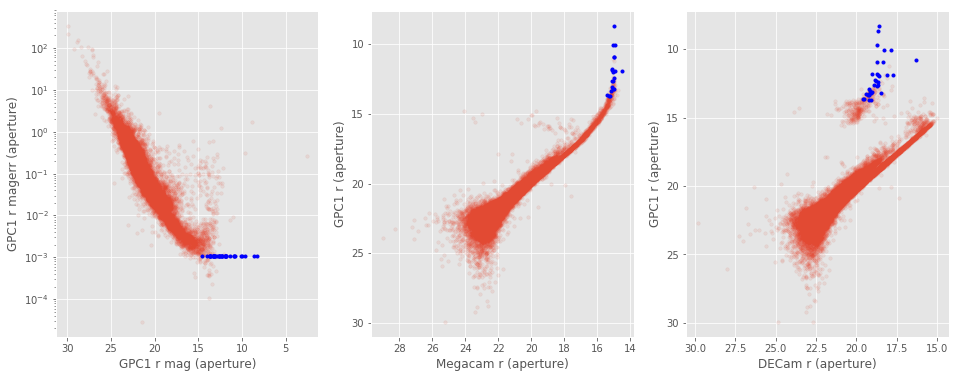

GPC1 i
   Number of flagged objects: 41


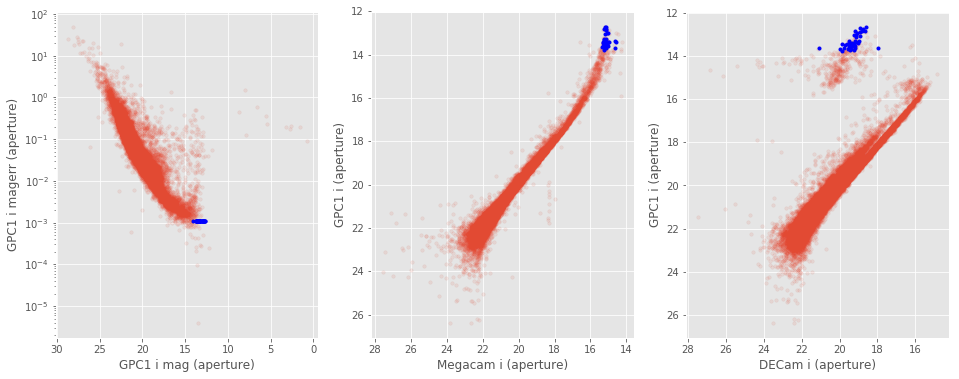

GPC1 z
   Number of flagged objects: 32


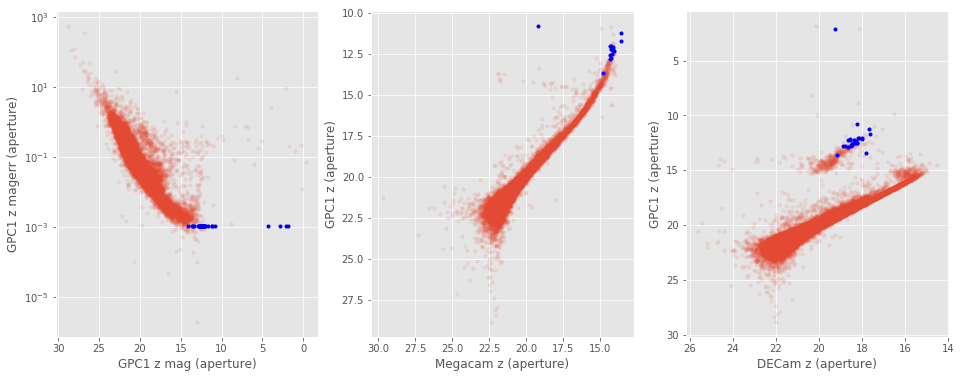

GPC1 y
   Number of flagged objects: 30


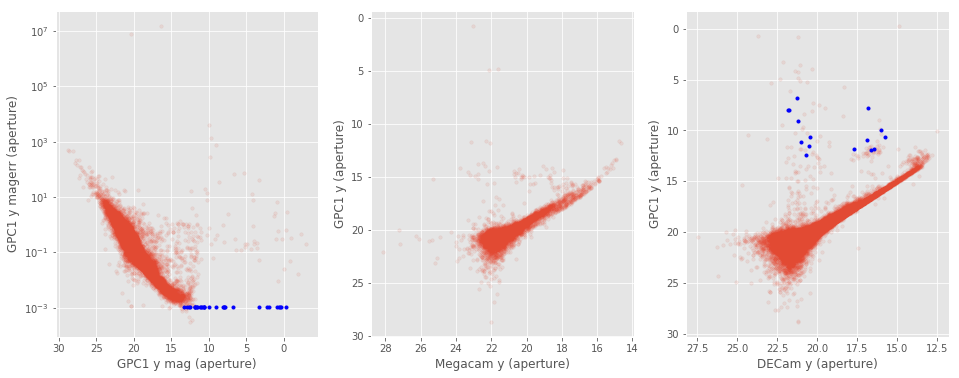

In [31]:
# PanSTARRS forced photometry catalogue
ps1_err = 0.0010860000038519502
# PanSTARRS stack catalogue
# ps1_err = 0.05000000074505806

bands = ['g', 'r', 'i', 'z', 'y']

for i, surveys in enumerate([g_bands, r_bands, i_bands, z_bands, y_bands]):
    surveys.insert(0, surveys.pop(surveys.index('GPC1 '+ bands[i])))
    print(surveys[0])
    
    if len(surveys) == 1:
        basecol1 = surveys[0].replace(" ", "_").lower()
        col1 = "m_ap_{}".format(basecol1)
        x2, labels2 = None, None
    else:
        basecol1, basecol2 = surveys[0].replace(" ", "_").lower(), surveys[1].replace(" ", "_").lower()
        col1, col2 = "m_ap_{}".format(basecol1), "m_ap_{}".format(basecol2)
        x2 = master_catalogue[col2]
        labels2 = ("{} (aperture)".format(surveys[1]), "{} (aperture)".format(surveys[0]))
    ecol1 = "merr_ap_{}".format(basecol1)
    
    if len(surveys) >= 3:
        basecol3 = surveys[2].replace(" ", "_").lower()
        col3 = "m_ap_{}".format(basecol3)
        x3, y3 = master_catalogue[col3], master_catalogue[col1]
        labels3 = ("{} (aperture)".format(surveys[2]), "{} (aperture)".format(surveys[0]))
    else:
        x3, y3, labels3 = None, None, None
        
    if basecol1 == 'gpc1_g':
        savefig = True
    else:
        savefig = False

        
    mask = np.where(master_catalogue[ecol1] == ps1_err)    
    print ('   Number of flagged objects:', len(master_catalogue[ecol1][mask]))

    flag_mag(mask, master_catalogue[col1], master_catalogue[ecol1],
                    x2, master_catalogue[col1], 
                    x3=x3, y3=y3,
                    labels1=("{} mag (aperture)".format(surveys[0]), "{} magerr (aperture)".format(surveys[0])),
                    labels2=labels2,
                    labels3=labels3, nb=len(surveys), savefig=savefig)

### 2.c IRAC Aperture magnitudes

IRAC i1: Number of flagged objects: 60
IRAC i2: Number of flagged objects: 4


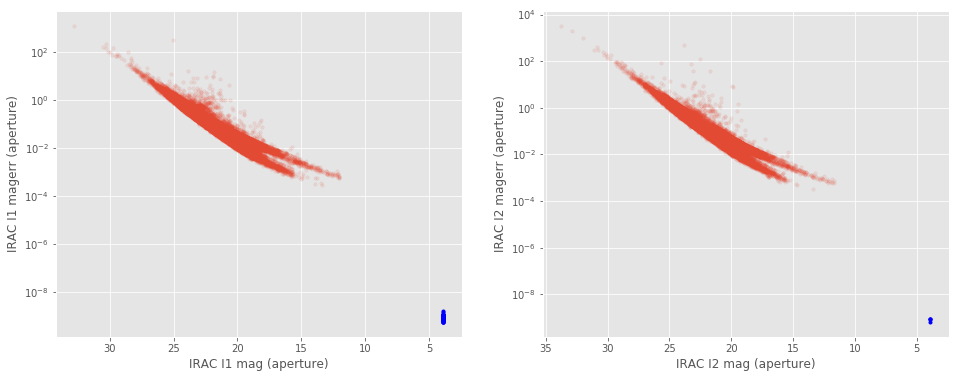

In [32]:
irac_mag = 3.9000000001085695

#bands = ["IRAC I1", "IRAC I2", "IRAC I3]
bands = ["IRAC I1", "IRAC I2"]
    
basecol1, basecol2 = bands[0].replace(" ", "_").lower(), bands[1].replace(" ", "_").lower()
col1, col2 = "m_ap_{}".format(basecol1), "m_ap_{}".format(basecol2)
ecol1, ecol2 = "merr_ap_{}".format(basecol1), "merr_ap_{}".format(basecol2)
    
mask1 = np.where(master_catalogue[col1] == irac_mag)[0]   
print ('IRAC i1: Number of flagged objects:', len(master_catalogue[col1][mask1]))

mask2 = np.where(master_catalogue[col2] == irac_mag)[0]  
print ('IRAC i2: Number of flagged objects:', len(master_catalogue[col2][mask2]))


if len(bands) == 3:
    basecol3 = bands[2].replace(" ", "_").lower()
    col3, ecol3 = "m_ap_{}".format(basecol3), "merr_ap_{}".format(basecol3)
    
    mask3 = np.where(master_catalogue[col3] == irac_mag)[0]  
    print ('IRAC i3: Number of flagged objects:', len(master_catalogue[col3][mask3]))
    
    x3, y3 = master_catalogue[col3], master_catalogue[ecol3]
    labels3 = ("{} mag (aperture)".format(bands[2]), "{} magerr (aperture)".format(bands[2]))
else:
    x3, y3, labels3, mask3 = None, None, None, None

    
flag_mag(mask1, master_catalogue[col1], master_catalogue[ecol1],
         master_catalogue[col2], master_catalogue[ecol2], mask2=mask2,
         x3=x3, y3=y3, mask3=mask3,
         labels1=("{} mag (aperture)".format(bands[0]), "{} magerr (aperture)".format(bands[0])),
         labels2=("{} mag (aperture)".format(bands[1]), "{} magerr (aperture)".format(bands[1])),
         labels3=labels3,
         nb=1, irac=True, savefig=True)

## 3/ Outliers

$$chi^2 = \frac{(mag_{1}-mag_{2})^2}{magerr_{1}^2 + magerr_{2}^2}$$ 
<br>
__Interquartile range (IQR) and outliers:__<br>
We consider as outliers objects which have a high $chi^2$, about $5\sigma$ away from the mean.<br>
$25th, 75th \;percentile = 0.6745\sigma$<br>
$IQR = (75th \;percentile - 25th \;percentile) = 0.6745\sigma * 2 = 1.349\sigma$<br>
$75th \;percentile + 3.2\times IQR = 0.6745\sigma + 3.2\times1.349\sigma = 4.7\sigma$
<br><br>
$$outliers == [chi^2 >  (75th \;percentile + 3.2\times (75th \;percentile - 25th \;percentile))]$$
<br><br>
__NB:__<br>
Bright sources tend to have their errors underestimated with values as low as $10^{-6}$, which is unrealistic. So to avoid high $chi^2$ due to unrealistic small errors, we clip the error to get a minimum value of 0.1% (i.e. all errors smaller then $10^{-3}$ are set to $10^{-3}$).

In [33]:
def outliers(x, y, xerr, yerr, labels=["x", "y"], savefig=False):
    
    import matplotlib
    import matplotlib.gridspec as gridspec
    from astropy import visualization as vz
    
    fig = plt.figure(figsize=(13, 6))

    gs1 = gridspec.GridSpec(1, 1)
    gs1.update(left=0.05, right=0.4, wspace=0.05)
    ax1 = plt.subplot(gs1[:, :-1])

    gs2 = gridspec.GridSpec(1, 3)
    gs2.update(left=0.47, right=0.98, hspace=0.05, wspace=0.05)
    ax2 = plt.subplot(gs2[:, :-1])
    ax3 = plt.subplot(gs2[:, -1], sharey=ax2)

    
    # Use only finite values
    mask = np.isfinite(x) & np.isfinite(y) & np.isfinite(xerr) & np.isfinite(yerr)
    x = np.copy(x[mask])
    y = np.copy(y[mask])
    xerr = np.copy(xerr[mask])
    yerr = np.copy(yerr[mask])
    
    # mag1 - mag2
    diff = y - x

    x_label, y_label = labels
    
    # If the difference is all NaN there is nothing to compare.
    if np.isnan(diff).all():
        print("No sources have both {} and {} values.".format(
            x_label, y_label))
        print("")
        return
    
    # Set the minimum error to 10^-3
    np.clip(xerr, 1e-3, np.max(xerr), out=xerr)
    np.clip(yerr, 1e-3, np.max(yerr), out=yerr)

    # Median, Median absolute deviation and 1% and 99% percentiles
    diff_median = np.median(diff)
    diff_mad = np.median(np.abs(diff - diff_median))
    diff_1p, diff_99p = np.percentile(diff, [1., 99.])
    diff_25p, diff_75p = np.percentile(diff, [25., 75.])
    
    
    diff_label = "{} - {}".format(y_label, x_label)

    print("{} ({} sources):".format(diff_label, len(x)))
    print("- Median: {:.2f}".format(diff_median))
    print("- Median Absolute Deviation: {:.2f}".format(diff_mad))
    print("- 1% percentile: {}".format(diff_1p))
    print("- 99% percentile: {}".format(diff_99p))

    
    # Chi2 (Normalized difference)   
    ichi2 = np.power(diff, 2) / (np.power(xerr, 2) + np.power(yerr, 2))
    
    # Use only non-null values of ichi2
    mask2 = ichi2 != 0.0
    diff, ichi2 = np.copy(diff[mask2]), np.copy(ichi2[mask2])
    x, y, xerr, yerr = np.copy(x[mask2]), np.copy(y[mask2]), np.copy(xerr[mask2]), np.copy(yerr[mask2])

    # Outliers (5sigma)
    log_ichi2_25p, log_ichi2_75p = np.percentile(np.log10(ichi2), [25., 75.])
    out_lim = log_ichi2_75p + 3.2*abs(log_ichi2_25p-log_ichi2_75p)
    
    outliers = np.log10(ichi2) > out_lim 
    nb_outliers = len(x[outliers])
    
    print("Outliers separation: log(chi2) = {:.2f}".format(out_lim))
    print("Number of outliers: {}".format(nb_outliers))

    print("")

    # Comparing mag
    ax1.scatter(x, y, marker='.', alpha=0.1, s=50)
    ax1.scatter(x[outliers], y[outliers], marker='.', c='b', alpha=0.3, s=50, label='Outliers ({})'.format(nb_outliers))
    min_val = np.min(np.r_[x, y])
    max_val = np.max(np.r_[x, y])
    ax1.autoscale(False)
    ax1.plot([min_val, max_val], [min_val, max_val], "k:")
    ax1.invert_xaxis()
    ax1.invert_yaxis()
    ax1.set_xlabel(x_label)
    ax1.set_ylabel(y_label)
    ax1.legend(loc='lower right', numpoints=1)
    

    # Chi2 vs Diff
    #ax1.set_yscale('log')    # to place before scatter to avoid issues
    ax2.scatter(diff, np.log10(ichi2), marker='.', alpha=0.1, s=50)
    if nb_outliers != 0:
        ax2.scatter(diff[outliers], np.log10(ichi2[outliers]), marker='.', alpha=0.3, s=50, color='b',\
                    label='Outliers ({})'.format(nb_outliers))
    ax2.axhline(out_lim, color='grey', linestyle=':')
    ax2.set_xlabel(diff_label)
    ax2.set_ylabel('log(chi2)')
    ax2.legend(loc='lower right', numpoints=1)
    
    # Hist
    n, bins, patches = vz.hist(np.log10(ichi2), ax=ax3, bins='knuth', facecolor='red', lw = 2, alpha=0.5,\
                                   orientation="horizontal")
    if nb_outliers > 3:
        n, bins, patches = vz.hist(np.log10(ichi2[outliers]), ax=ax3, bins='knuth', facecolor='b', lw = 2, alpha=0.7,\
                                   orientation="horizontal")
    ax3.axhline(out_lim, color='grey', linestyle=':')
    ax3.yaxis.set_tick_params(labelleft=False)
    
    # Save ex. fig
    if savefig:
        survey_label = ((diff_label.replace(" ", "_")).replace("(", "")).replace(")", "")
        figname = field + "_outliers_" + survey_label + ".png"
        plt.savefig("/data/help/plots/" + figname, bbox_inches='tight')


    display(fig)
    plt.close()

Megacam g (aperture) - GPC1 g (aperture) (27773 sources):
- Median: 0.27
- Median Absolute Deviation: 0.32
- 1% percentile: -2.1279638671875
- 99% percentile: 2.9850075531005817
Outliers separation: log(chi2) = 6.50
Number of outliers: 4



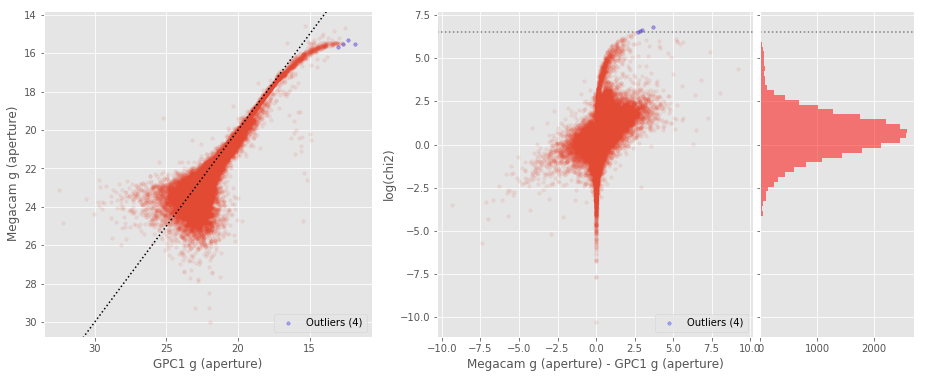

Megacam g (total) - GPC1 g (total) (27909 sources):
- Median: -0.01
- Median Absolute Deviation: 0.26
- 1% percentile: -1.6966248321533204
- 99% percentile: 3.128392257690427
Outliers separation: log(chi2) = 5.21
Number of outliers: 68



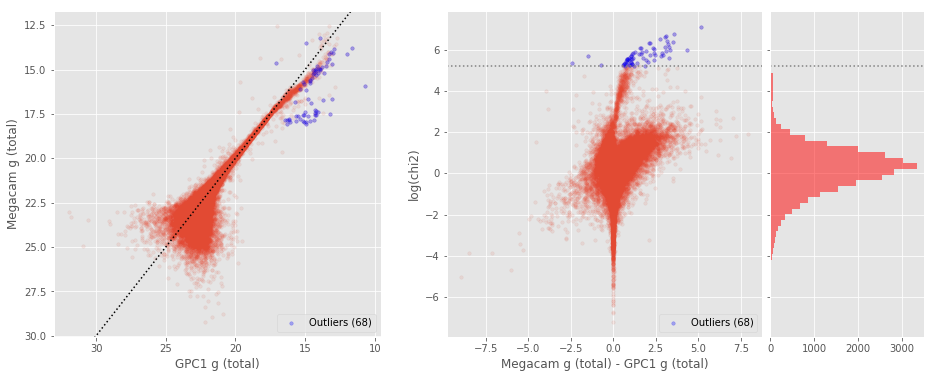

DECam g (aperture) - GPC1 g (aperture) (34248 sources):
- Median: 0.32
- Median Absolute Deviation: 0.40
- 1% percentile: -2.1688703727722167
- 99% percentile: 3.380687446594238
Outliers separation: log(chi2) = 6.34
Number of outliers: 28



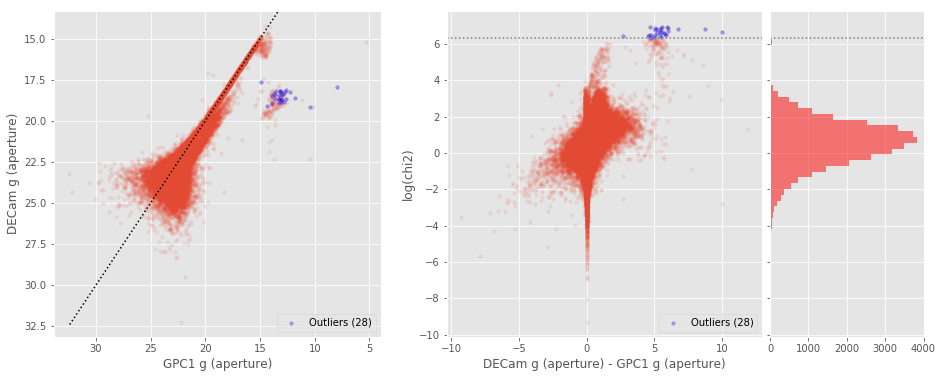

DECam g (total) - GPC1 g (total) (34397 sources):
- Median: 0.00
- Median Absolute Deviation: 0.25
- 1% percentile: -1.7231849670410155
- 99% percentile: 3.260274734497071
Outliers separation: log(chi2) = 4.99
Number of outliers: 121



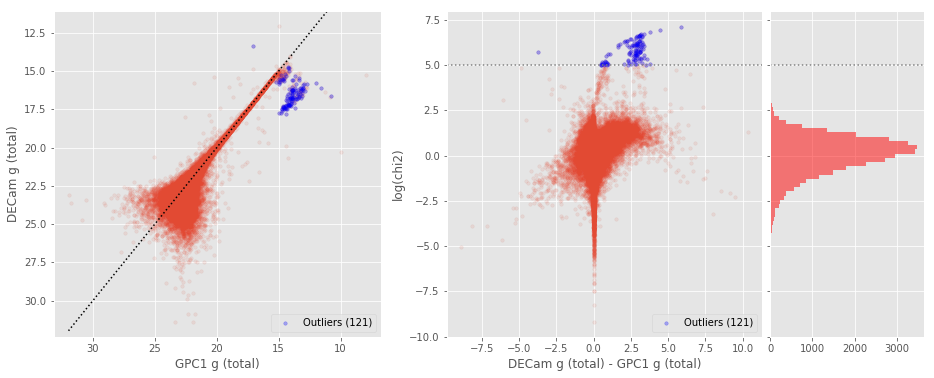

SUPRIME g (aperture) - GPC1 g (aperture) (21039 sources):
- Median: 0.34
- Median Absolute Deviation: 0.40
- 1% percentile: -2.1247158813476563
- 99% percentile: 3.72235771179197
Outliers separation: log(chi2) = 6.55
Number of outliers: 0



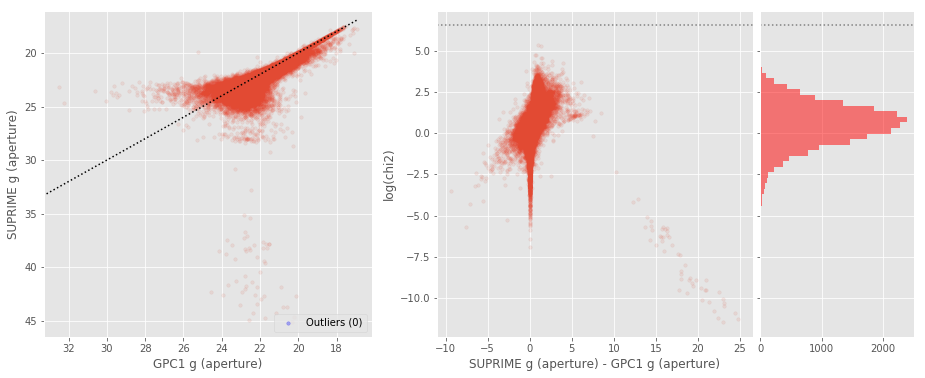

SUPRIME g (total) - GPC1 g (total) (21014 sources):
- Median: -0.01
- Median Absolute Deviation: 0.28
- 1% percentile: -1.705655345916748
- 99% percentile: 3.7830509376525843
Outliers separation: log(chi2) = 5.17
Number of outliers: 2



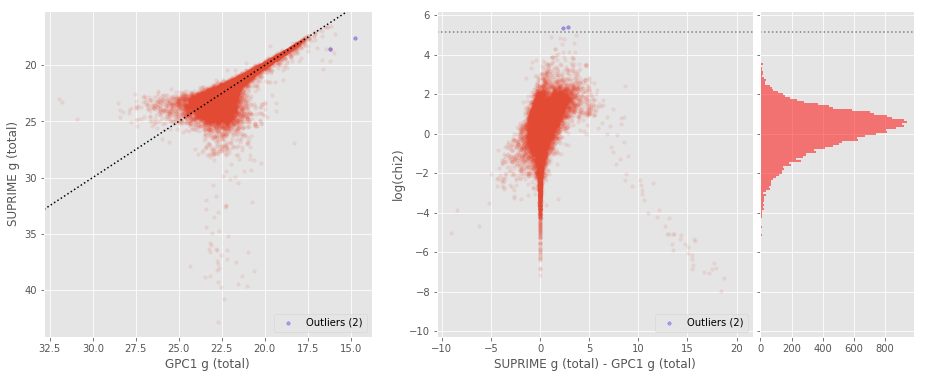

DECam g (aperture) - Megacam g (aperture) (151724 sources):
- Median: -0.00
- Median Absolute Deviation: 0.18
- 1% percentile: -1.116830406188965
- 99% percentile: 1.777696571350088
Outliers separation: log(chi2) = 4.34
Number of outliers: 580



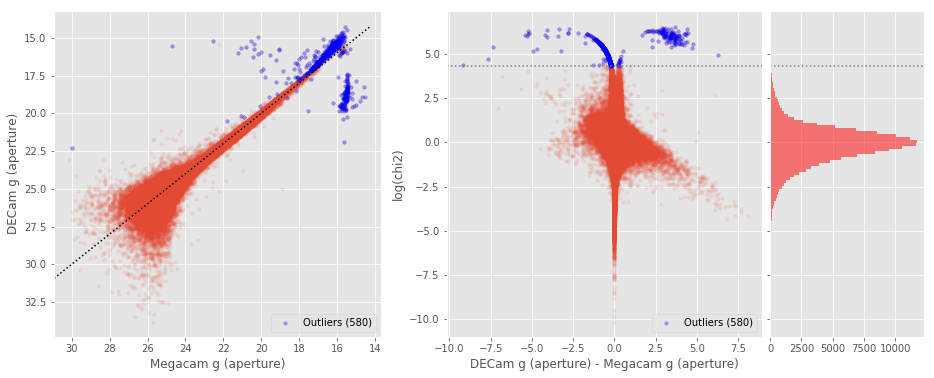

DECam g (total) - Megacam g (total) (151464 sources):
- Median: 0.06
- Median Absolute Deviation: 0.19
- 1% percentile: -1.2428171348571777
- 99% percentile: 1.9813941383361804
Outliers separation: log(chi2) = 4.00
Number of outliers: 559



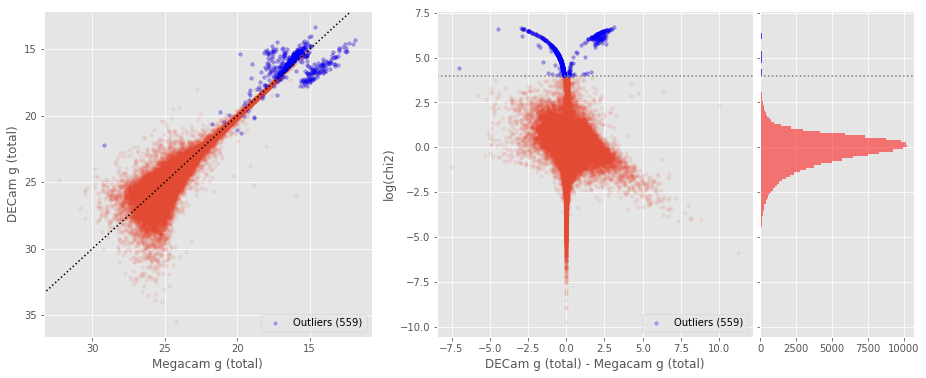

SUPRIME g (aperture) - Megacam g (aperture) (291588 sources):
- Median: -0.04
- Median Absolute Deviation: 0.17
- 1% percentile: -1.4549687767028807
- 99% percentile: 2.03551591873169
Outliers separation: log(chi2) = 4.34
Number of outliers: 267



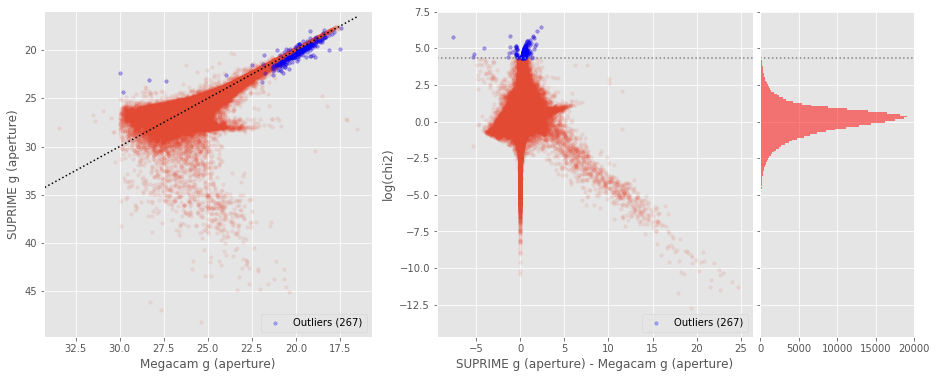

SUPRIME g (total) - Megacam g (total) (278351 sources):
- Median: -0.09
- Median Absolute Deviation: 0.24
- 1% percentile: -2.2864151000976562
- 99% percentile: 2.3538951873779297
Outliers separation: log(chi2) = 4.72
Number of outliers: 89



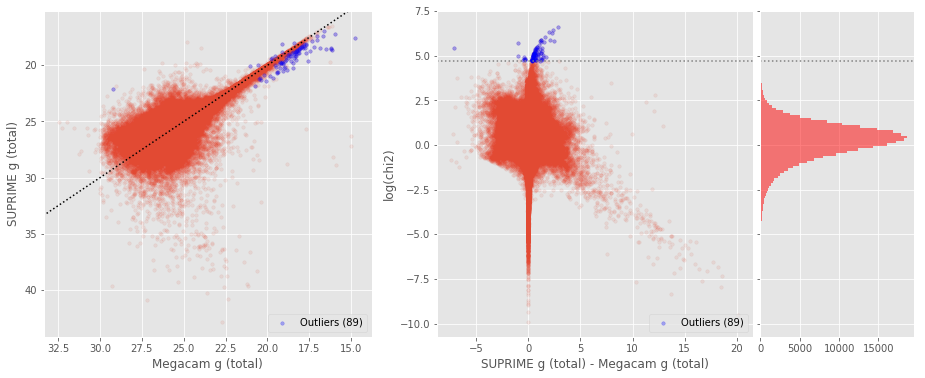

SUPRIME g (aperture) - DECam g (aperture) (120463 sources):
- Median: 0.01
- Median Absolute Deviation: 0.15
- 1% percentile: -1.7775051116943357
- 99% percentile: 2.3822115325927826
Outliers separation: log(chi2) = 4.04
Number of outliers: 33



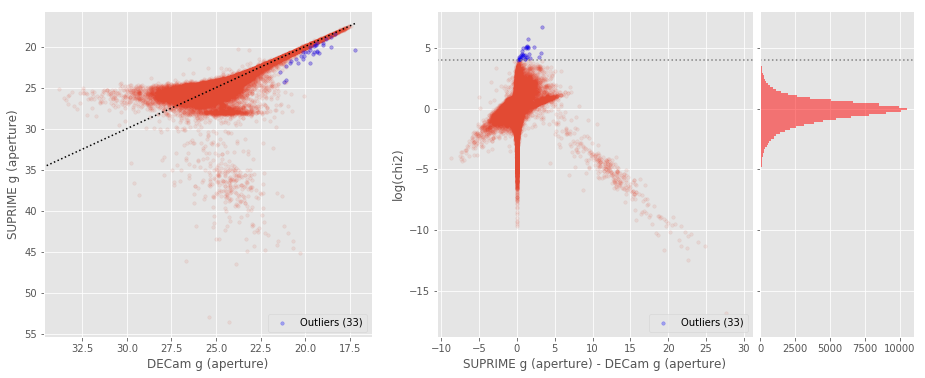

SUPRIME g (total) - DECam g (total) (119068 sources):
- Median: -0.13
- Median Absolute Deviation: 0.22
- 1% percentile: -2.157060451507568
- 99% percentile: 2.4179091262817396
Outliers separation: log(chi2) = 4.12
Number of outliers: 67



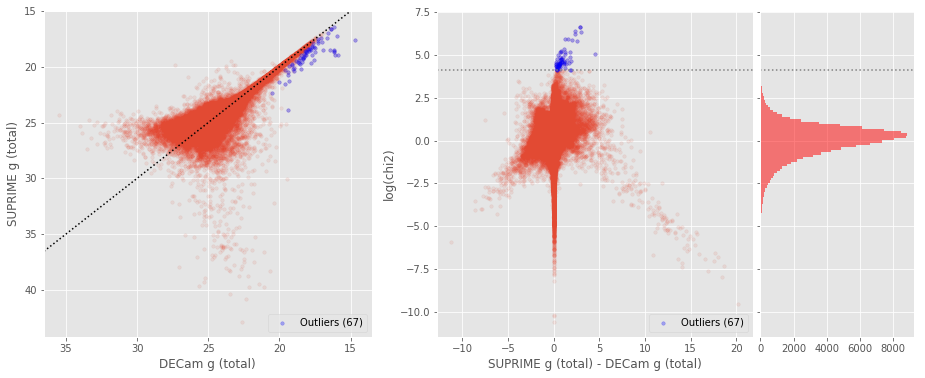

Megacam r (aperture) - GPC1 r (aperture) (29006 sources):
- Median: 0.18
- Median Absolute Deviation: 0.20
- 1% percentile: -1.5038354873657227
- 99% percentile: 1.6956956386566164
Outliers separation: log(chi2) = 6.53
Number of outliers: 10



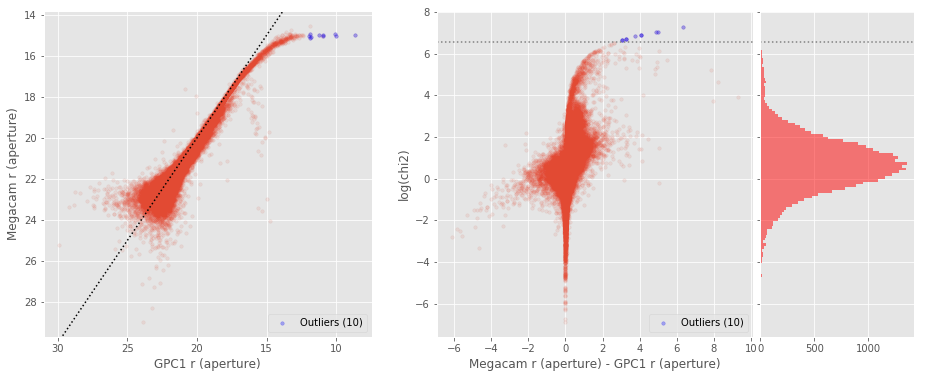

Megacam r (total) - GPC1 r (total) (29117 sources):
- Median: -0.06
- Median Absolute Deviation: 0.14
- 1% percentile: -1.125360641479492
- 99% percentile: 1.7190081787109377
Outliers separation: log(chi2) = 4.87
Number of outliers: 151



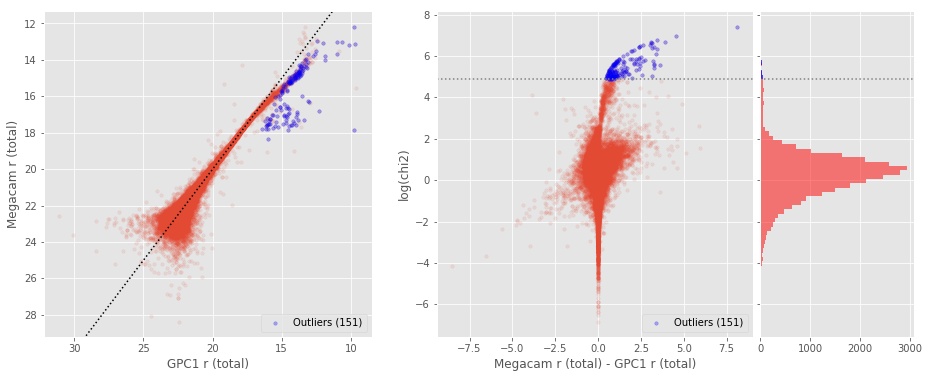

DECam r (aperture) - GPC1 r (aperture) (35836 sources):
- Median: 0.10
- Median Absolute Deviation: 0.28
- 1% percentile: -1.6517485618591308
- 99% percentile: 4.810400152206468
Outliers separation: log(chi2) = 6.70
Number of outliers: 24



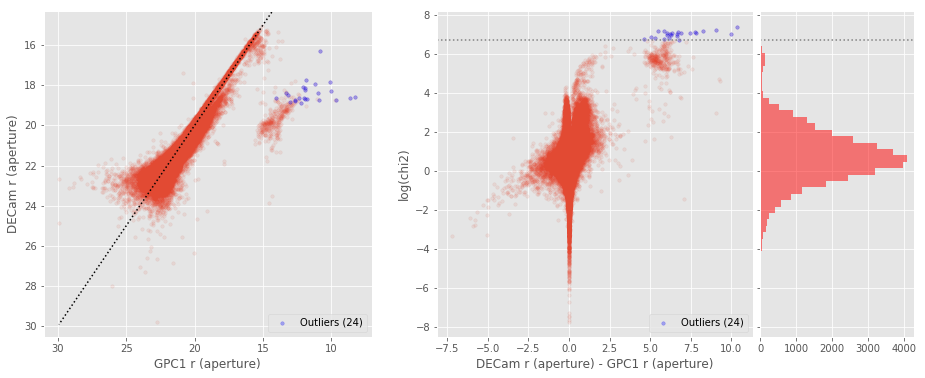

DECam r (total) - GPC1 r (total) (35918 sources):
- Median: -0.18
- Median Absolute Deviation: 0.14
- 1% percentile: -1.2267878913879393
- 99% percentile: 2.6614102363586456
Outliers separation: log(chi2) = 5.23
Number of outliers: 289



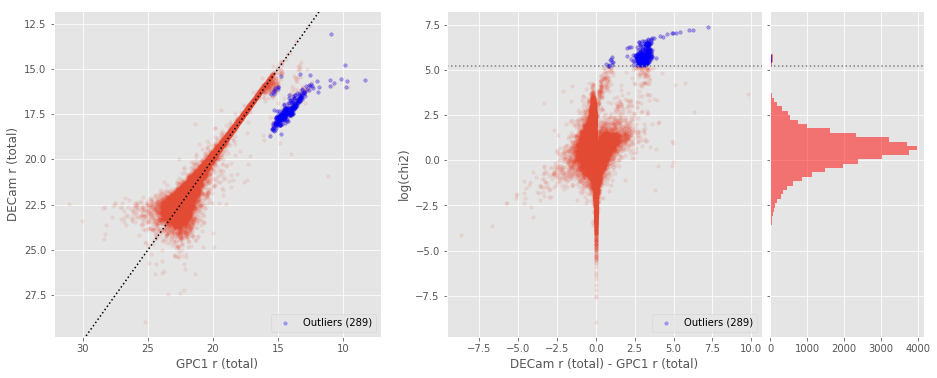

SUPRIME r (aperture) - GPC1 r (aperture) (21879 sources):
- Median: 0.18
- Median Absolute Deviation: 0.27
- 1% percentile: -1.5881449127197265
- 99% percentile: 2.5555690002441445
Outliers separation: log(chi2) = 6.50
Number of outliers: 0



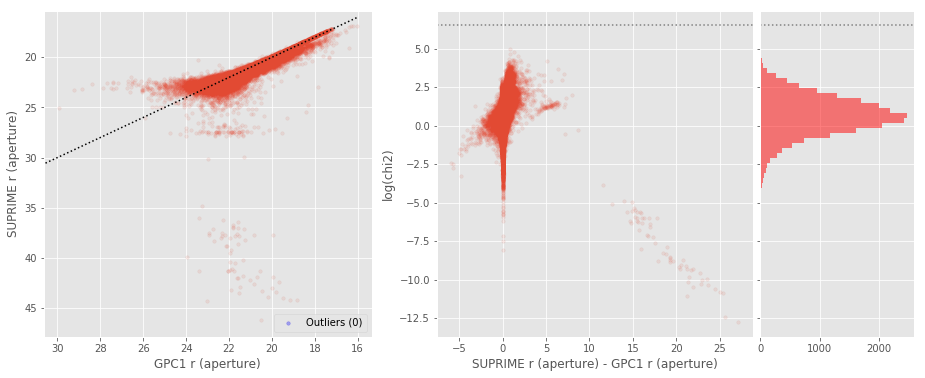

SUPRIME r (total) - GPC1 r (total) (21869 sources):
- Median: -0.12
- Median Absolute Deviation: 0.15
- 1% percentile: -1.1568919372558595
- 99% percentile: 2.707507820129394
Outliers separation: log(chi2) = 4.98
Number of outliers: 3



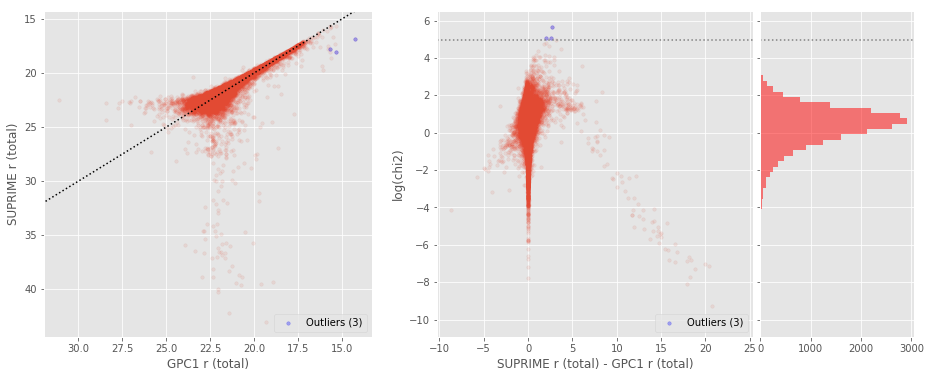

DECam r (aperture) - Megacam r (aperture) (152488 sources):
- Median: -0.09
- Median Absolute Deviation: 0.17
- 1% percentile: -1.0891041946411133
- 99% percentile: 1.9648017120361363
Outliers separation: log(chi2) = 5.05
Number of outliers: 428



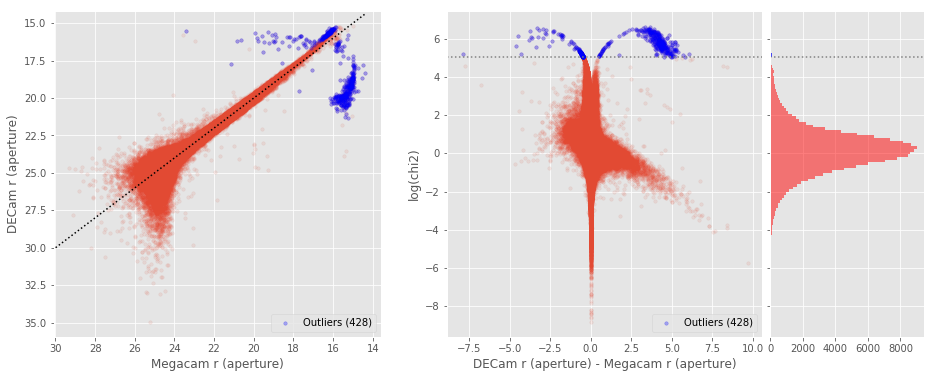

DECam r (total) - Megacam r (total) (154365 sources):
- Median: -0.07
- Median Absolute Deviation: 0.18
- 1% percentile: -1.1891847229003907
- 99% percentile: 1.2749555969238195
Outliers separation: log(chi2) = 4.61
Number of outliers: 542



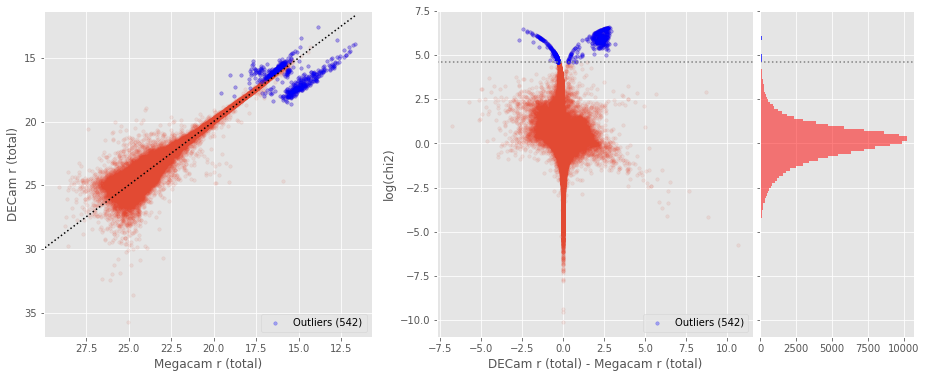

SUPRIME r (aperture) - Megacam r (aperture) (292499 sources):
- Median: -0.07
- Median Absolute Deviation: 0.19
- 1% percentile: -1.7389449310302736
- 99% percentile: 2.0002908706665083
Outliers separation: log(chi2) = 4.32
Number of outliers: 251



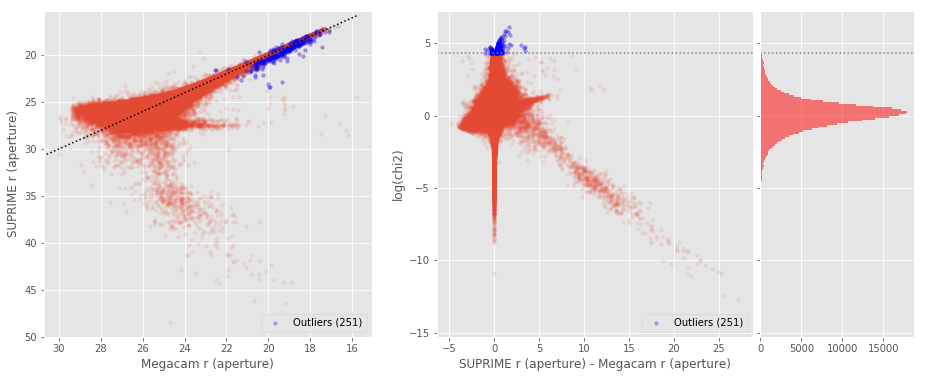

SUPRIME r (total) - Megacam r (total) (276691 sources):
- Median: -0.11
- Median Absolute Deviation: 0.25
- 1% percentile: -2.4794828414916994
- 99% percentile: 2.4096851348876887
Outliers separation: log(chi2) = 4.79
Number of outliers: 57



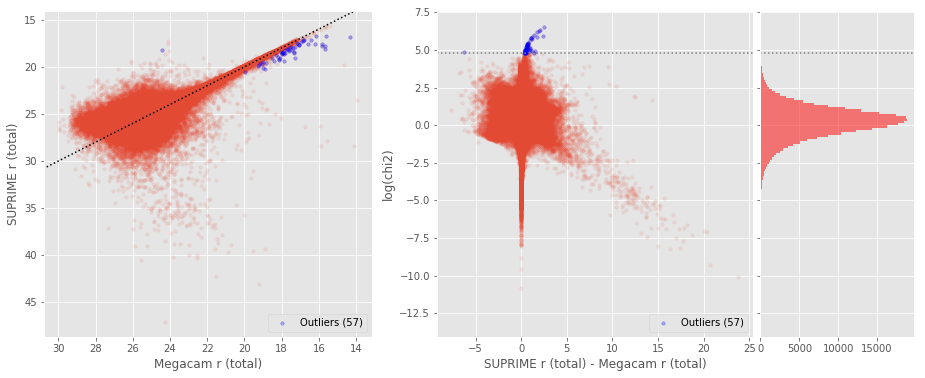

SUPRIME r (aperture) - DECam r (aperture) (120427 sources):
- Median: 0.04
- Median Absolute Deviation: 0.13
- 1% percentile: -1.987959785461426
- 99% percentile: 2.3953059387207074
Outliers separation: log(chi2) = 4.63
Number of outliers: 20



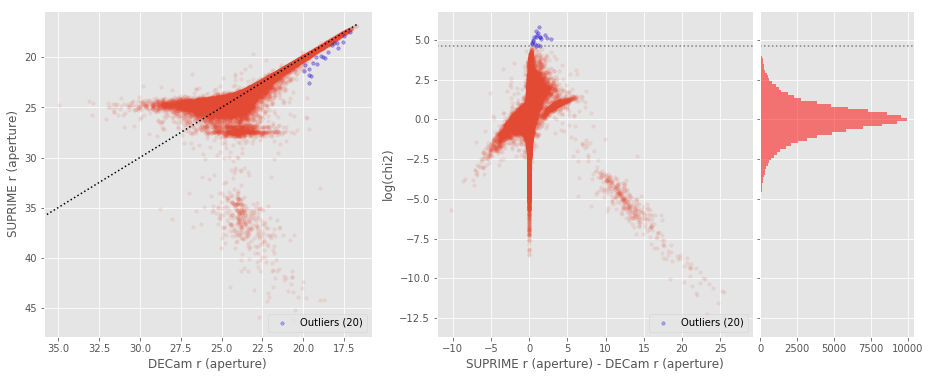

SUPRIME r (total) - DECam r (total) (120769 sources):
- Median: -0.03
- Median Absolute Deviation: 0.20
- 1% percentile: -1.518252410888672
- 99% percentile: 2.5604727935791
Outliers separation: log(chi2) = 4.33
Number of outliers: 89



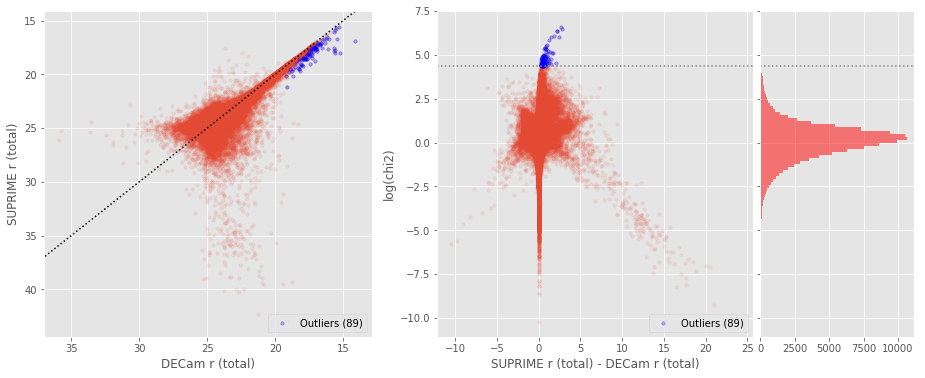

Megacam i (aperture) - GPC1 i (aperture) (24648 sources):
- Median: 0.09
- Median Absolute Deviation: 0.12
- 1% percentile: -0.6963590240478515
- 99% percentile: 1.165706911087034
Outliers separation: log(chi2) = 5.90
Number of outliers: 46



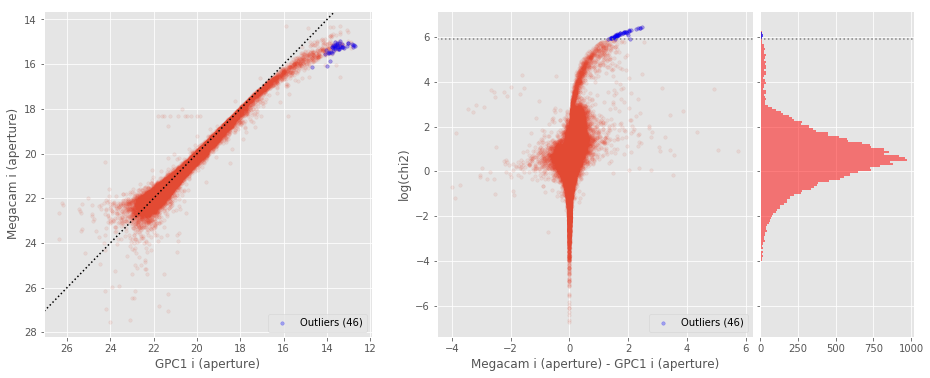

Megacam i (total) - GPC1 i (total) (24646 sources):
- Median: -0.12
- Median Absolute Deviation: 0.10
- 1% percentile: -0.7218597412109375
- 99% percentile: 0.9091596603393546
Outliers separation: log(chi2) = 4.99
Number of outliers: 124



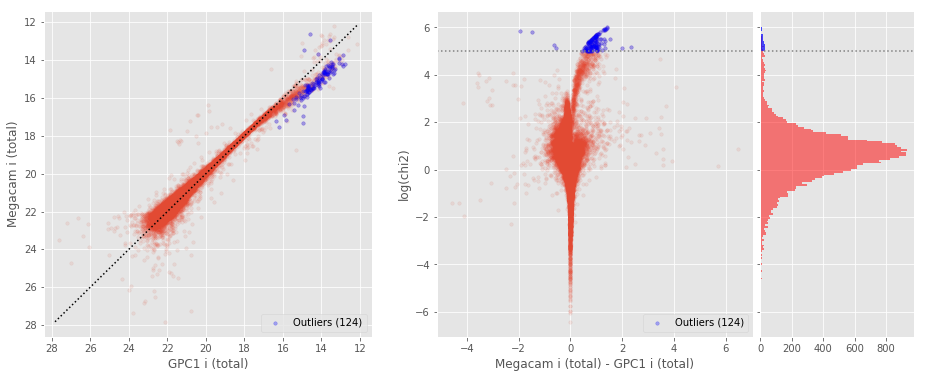

DECam i (aperture) - GPC1 i (aperture) (36009 sources):
- Median: 0.10
- Median Absolute Deviation: 0.21
- 1% percentile: -0.7532816696166992
- 99% percentile: 5.122128257751438
Outliers separation: log(chi2) = 6.95
Number of outliers: 0



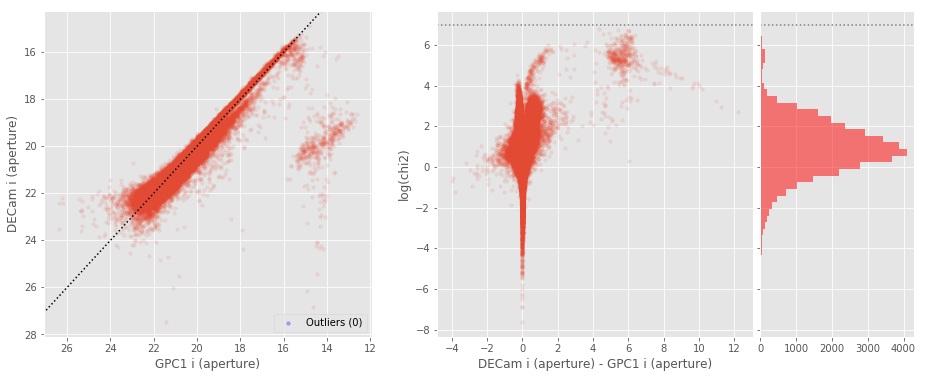

DECam i (total) - GPC1 i (total) (36043 sources):
- Median: -0.17
- Median Absolute Deviation: 0.10
- 1% percentile: -0.7702091217041016
- 99% percentile: 2.864065303802504
Outliers separation: log(chi2) = 5.08
Number of outliers: 386



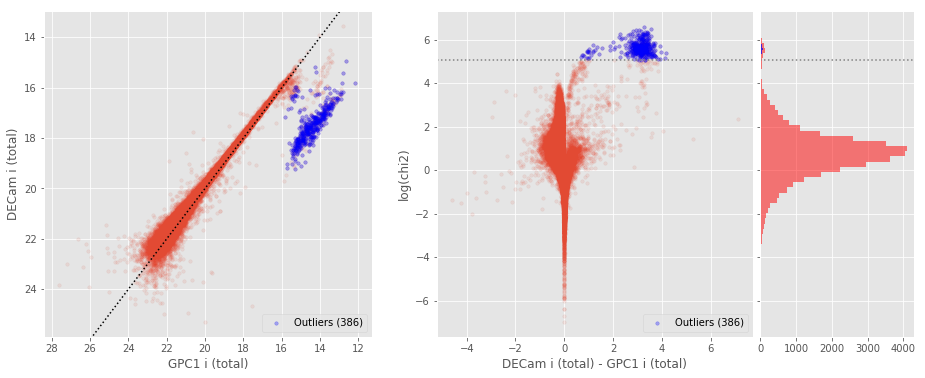

SUPRIME i (aperture) - GPC1 i (aperture) (22112 sources):
- Median: 0.13
- Median Absolute Deviation: 0.20
- 1% percentile: -0.7042061424255371
- 99% percentile: 4.535118751525869
Outliers separation: log(chi2) = 6.63
Number of outliers: 0



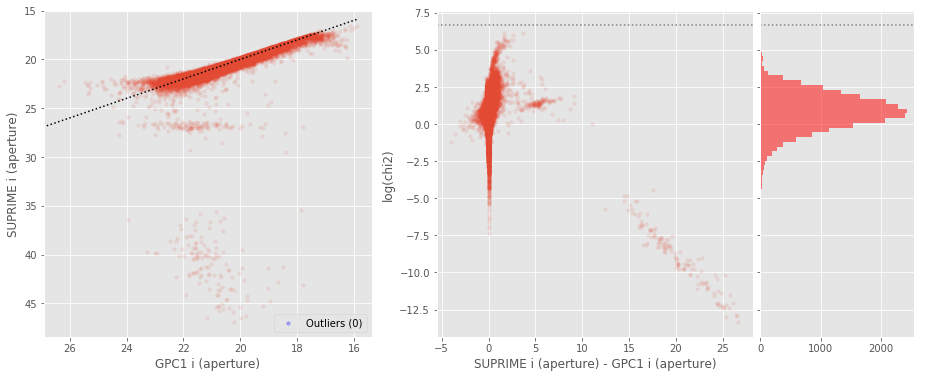

SUPRIME i (total) - GPC1 i (total) (22044 sources):
- Median: -0.19
- Median Absolute Deviation: 0.11
- 1% percentile: -0.7595445823669433
- 99% percentile: 3.899229240417469
Outliers separation: log(chi2) = 4.87
Number of outliers: 28



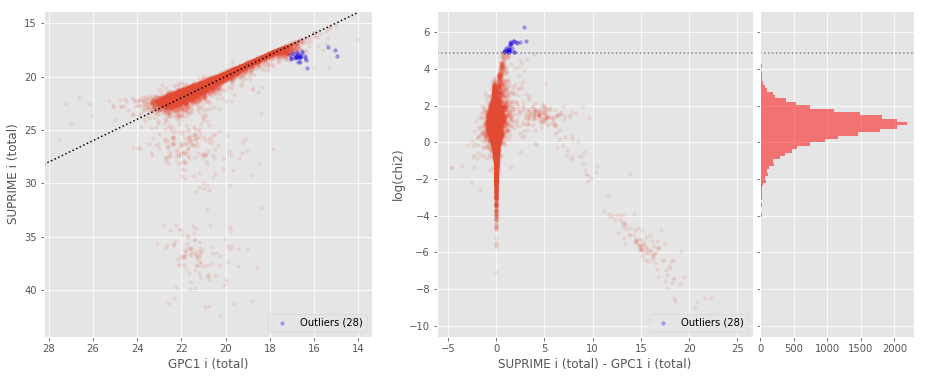

DECam i (aperture) - Megacam i (aperture) (101572 sources):
- Median: 0.00
- Median Absolute Deviation: 0.14
- 1% percentile: -0.6780715560913086
- 99% percentile: 0.7131591606140124
Outliers separation: log(chi2) = 4.95
Number of outliers: 479



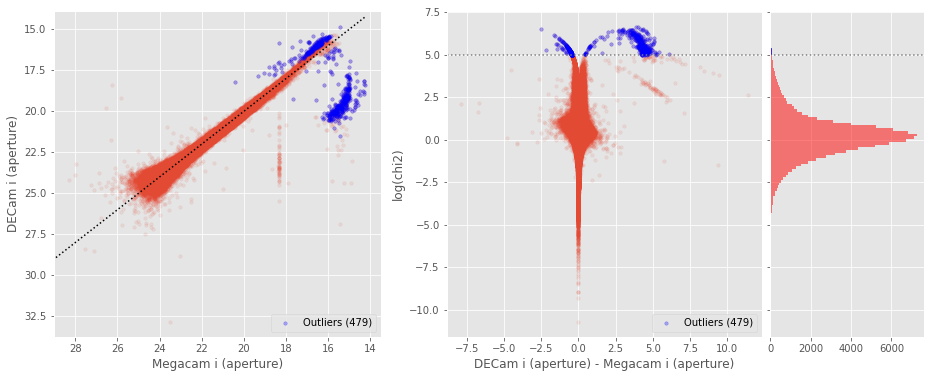

DECam i (total) - Megacam i (total) (101508 sources):
- Median: -0.03
- Median Absolute Deviation: 0.14
- 1% percentile: -0.9301593208312988
- 99% percentile: 1.2079321670532224
Outliers separation: log(chi2) = 4.36
Number of outliers: 710



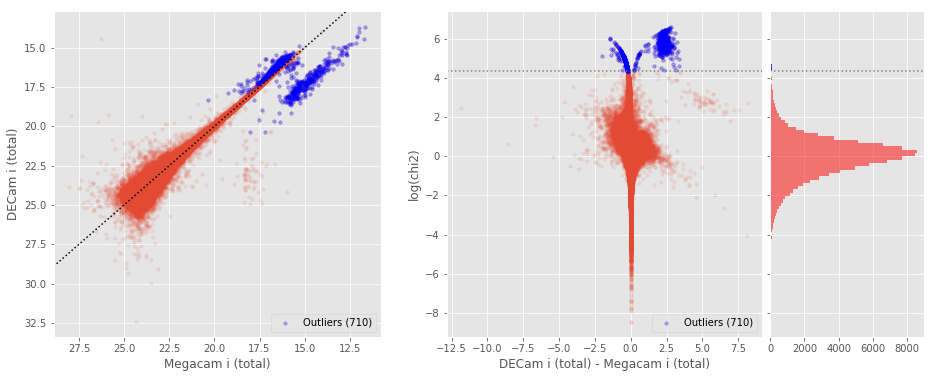

SUPRIME i (aperture) - Megacam i (aperture) (276173 sources):
- Median: -0.01
- Median Absolute Deviation: 0.20
- 1% percentile: -1.909944839477539
- 99% percentile: 2.6051633453368552
Outliers separation: log(chi2) = 4.40
Number of outliers: 433



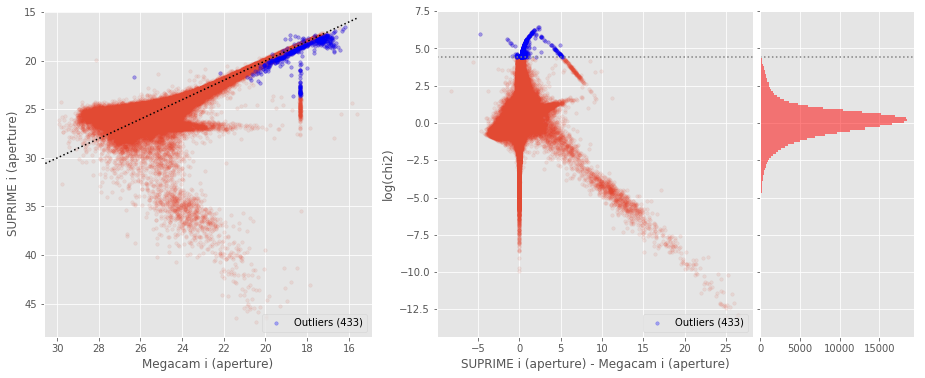

SUPRIME i (total) - Megacam i (total) (259970 sources):
- Median: -0.10
- Median Absolute Deviation: 0.27
- 1% percentile: -2.6360347747802733
- 99% percentile: 3.068943252563475
Outliers separation: log(chi2) = 4.80
Number of outliers: 172



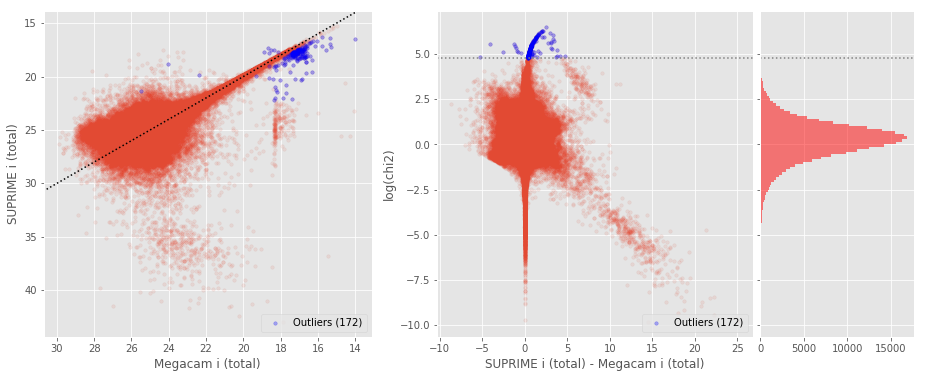

SUPRIME i (aperture) - DECam i (aperture) (93574 sources):
- Median: 0.02
- Median Absolute Deviation: 0.09
- 1% percentile: -0.609251480102539
- 99% percentile: 3.4409579849243306
Outliers separation: log(chi2) = 4.34
Number of outliers: 201



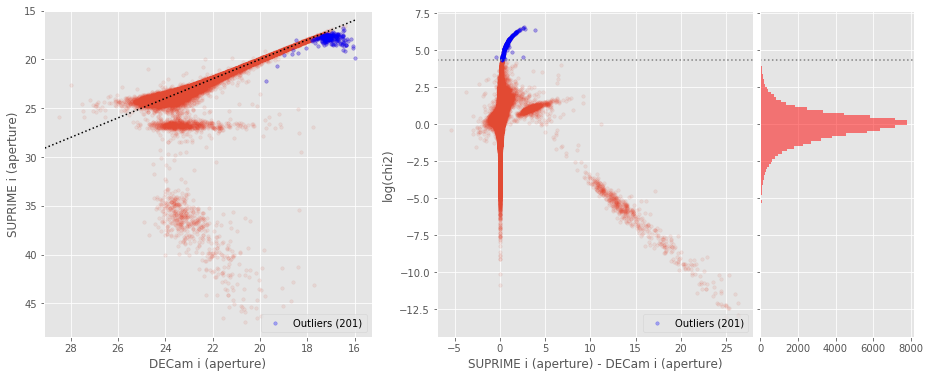

SUPRIME i (total) - DECam i (total) (92667 sources):
- Median: -0.06
- Median Absolute Deviation: 0.15
- 1% percentile: -1.1942699813842774
- 99% percentile: 3.5136243820190396
Outliers separation: log(chi2) = 4.12
Number of outliers: 252



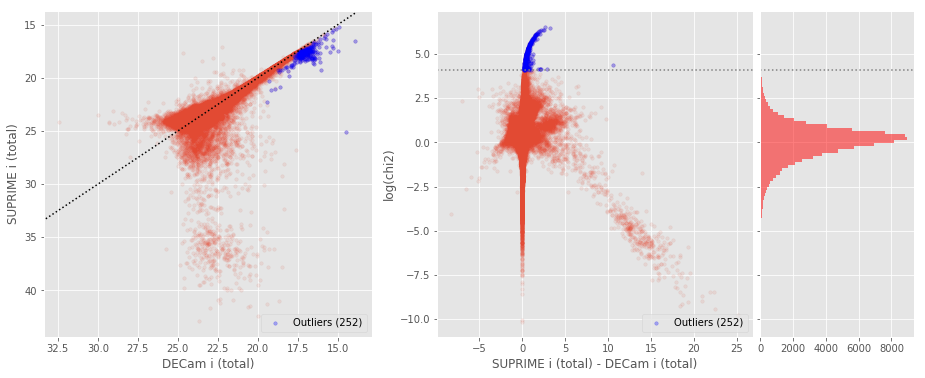

Megacam z (aperture) - GPC1 z (aperture) (29268 sources):
- Median: 0.13
- Median Absolute Deviation: 0.14
- 1% percentile: -0.9280864524841308
- 99% percentile: 1.281457948684692
Outliers separation: log(chi2) = 5.87
Number of outliers: 45



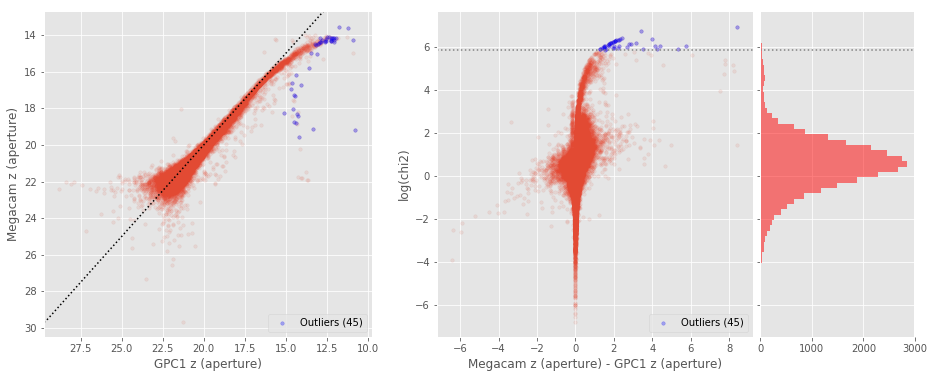

Megacam z (total) - GPC1 z (total) (29243 sources):
- Median: -0.10
- Median Absolute Deviation: 0.12
- 1% percentile: -0.8734080123901367
- 99% percentile: 1.0305436706542952
Outliers separation: log(chi2) = 4.98
Number of outliers: 80



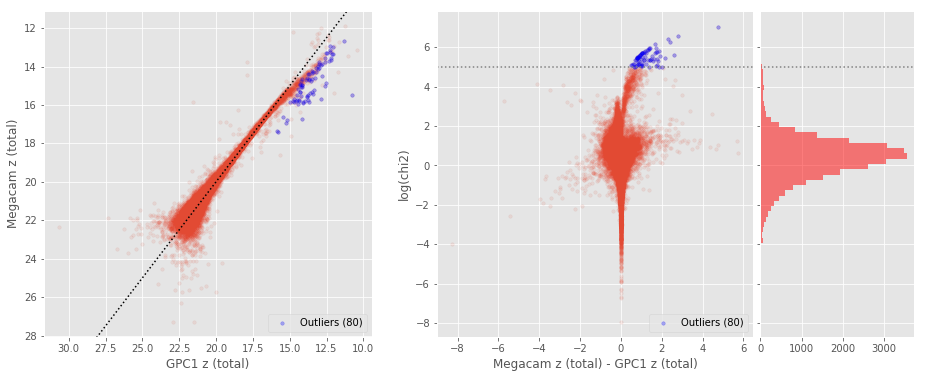

DECam z (aperture) - GPC1 z (aperture) (36141 sources):
- Median: 0.08
- Median Absolute Deviation: 0.21
- 1% percentile: -1.0142139434814452
- 99% percentile: 5.045191001892089
Outliers separation: log(chi2) = 6.29
Number of outliers: 34



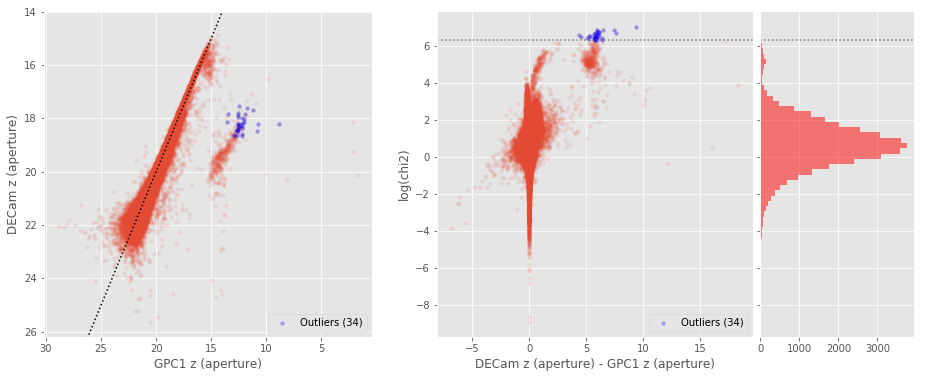

DECam z (total) - GPC1 z (total) (36128 sources):
- Median: -0.19
- Median Absolute Deviation: 0.12
- 1% percentile: -0.9589047241210937
- 99% percentile: 2.674141054153443
Outliers separation: log(chi2) = 5.32
Number of outliers: 213



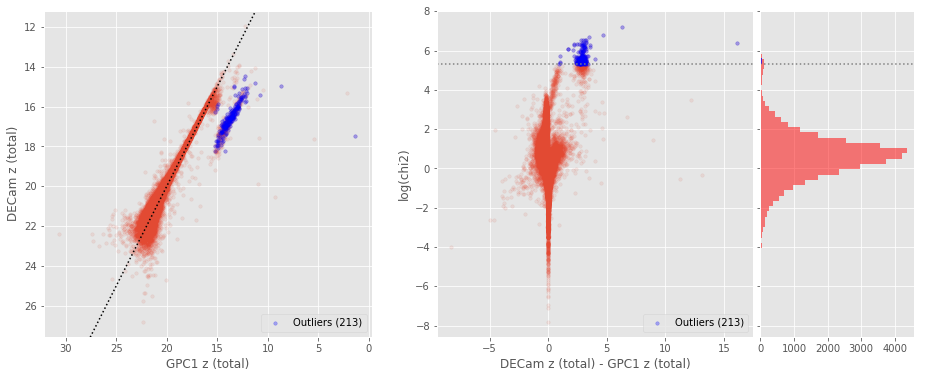

SUPRIME z (aperture) - GPC1 z (aperture) (22062 sources):
- Median: 0.09
- Median Absolute Deviation: 0.19
- 1% percentile: -0.9778141784667969
- 99% percentile: 2.146695098876948
Outliers separation: log(chi2) = 6.15
Number of outliers: 0



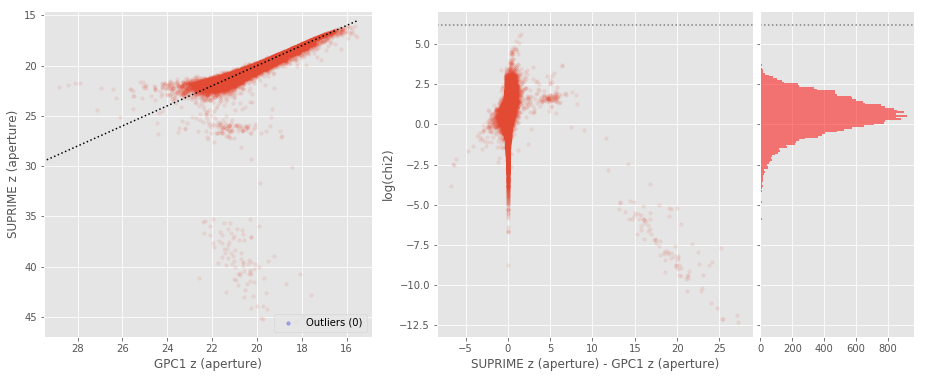

SUPRIME z (total) - GPC1 z (total) (21975 sources):
- Median: -0.19
- Median Absolute Deviation: 0.13
- 1% percentile: -0.9053141403198243
- 99% percentile: 2.2721852874755832
Outliers separation: log(chi2) = 4.97
Number of outliers: 1



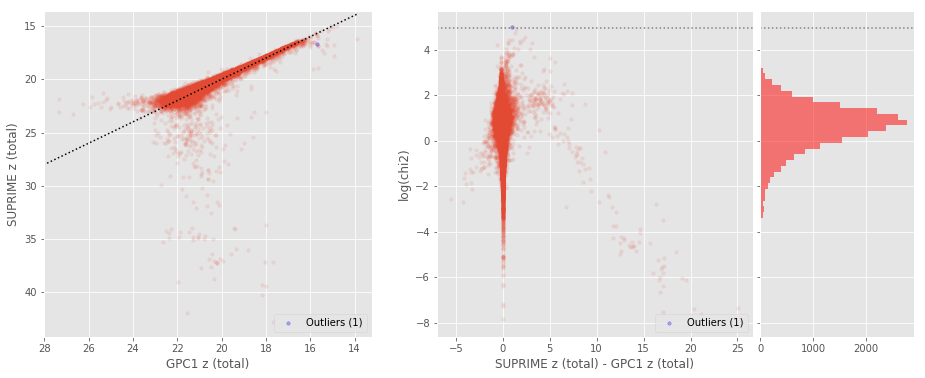

VISTA z (aperture) - GPC1 z (aperture) (10905 sources):
- Median: 0.13
- Median Absolute Deviation: 0.16
- 1% percentile: -0.8472739410400391
- 99% percentile: 7.795831985473624
Outliers separation: log(chi2) = 5.96
Number of outliers: 3



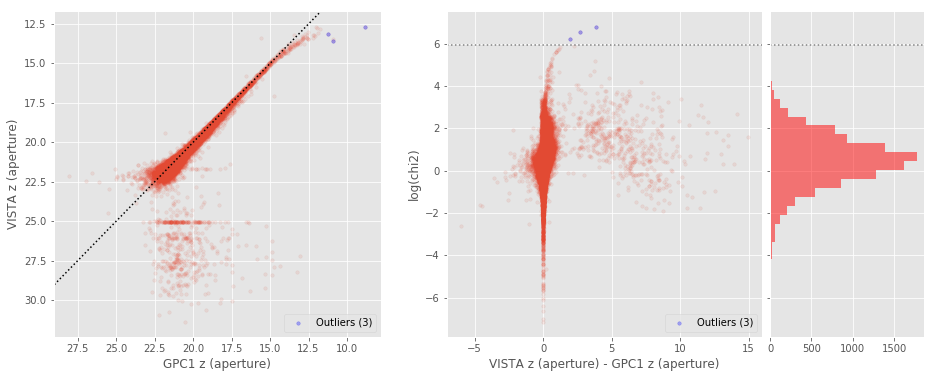

VISTA z (total) - GPC1 z (total) (10897 sources):
- Median: -0.14
- Median Absolute Deviation: 0.14
- 1% percentile: -0.9691386413574219
- 99% percentile: 6.924034500122067
Outliers separation: log(chi2) = 5.50
Number of outliers: 2



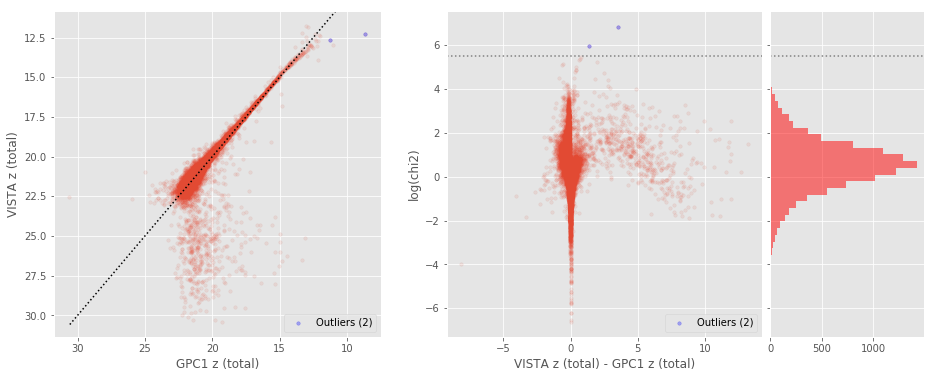

DECam z (aperture) - Megacam z (aperture) (144803 sources):
- Median: -0.09
- Median Absolute Deviation: 0.22
- 1% percentile: -2.2683147048950194
- 99% percentile: 2.3151666641235433
Outliers separation: log(chi2) = 4.92
Number of outliers: 375



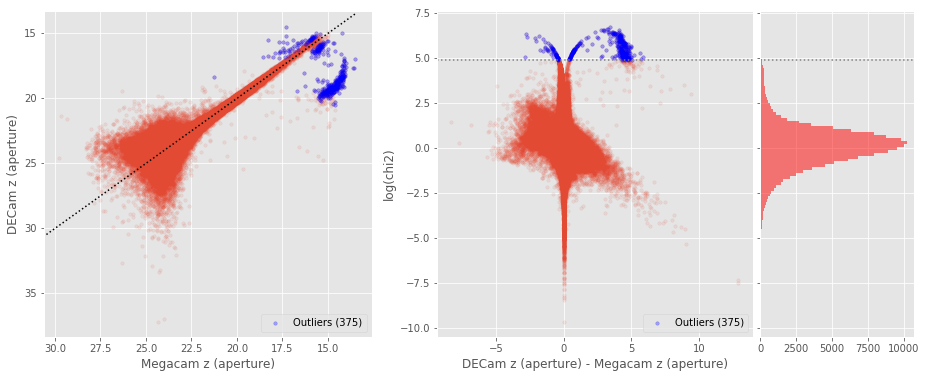

DECam z (total) - Megacam z (total) (147705 sources):
- Median: -0.07
- Median Absolute Deviation: 0.27
- 1% percentile: -2.339894256591797
- 99% percentile: 2.3962123870849577
Outliers separation: log(chi2) = 4.41
Number of outliers: 567



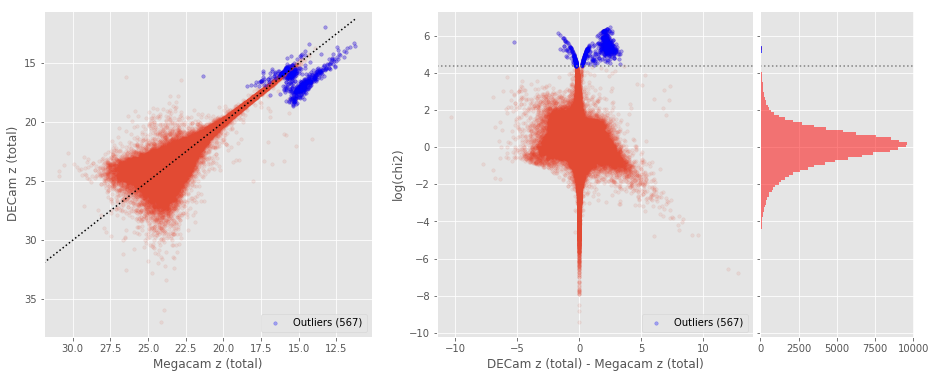

SUPRIME z (aperture) - Megacam z (aperture) (257129 sources):
- Median: -0.02
- Median Absolute Deviation: 0.32
- 1% percentile: -2.4454917907714844
- 99% percentile: 3.334959793090822
Outliers separation: log(chi2) = 4.96
Number of outliers: 24



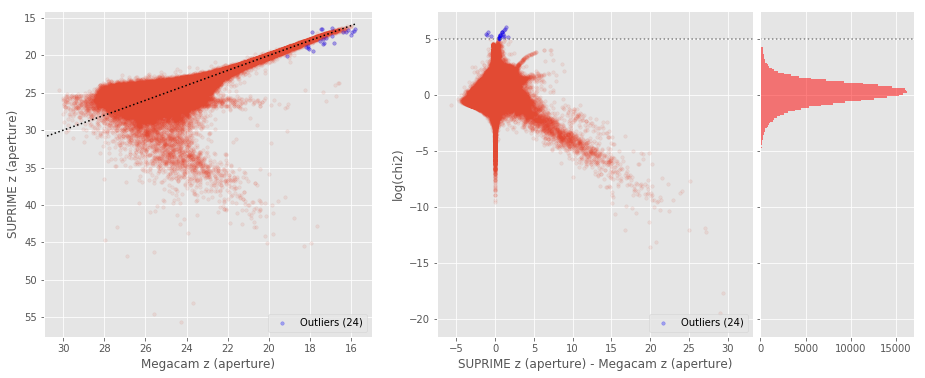

SUPRIME z (total) - Megacam z (total) (236547 sources):
- Median: -0.07
- Median Absolute Deviation: 0.42
- 1% percentile: -2.9634012603759765
- 99% percentile: 3.3015715789795
Outliers separation: log(chi2) = 5.30
Number of outliers: 17



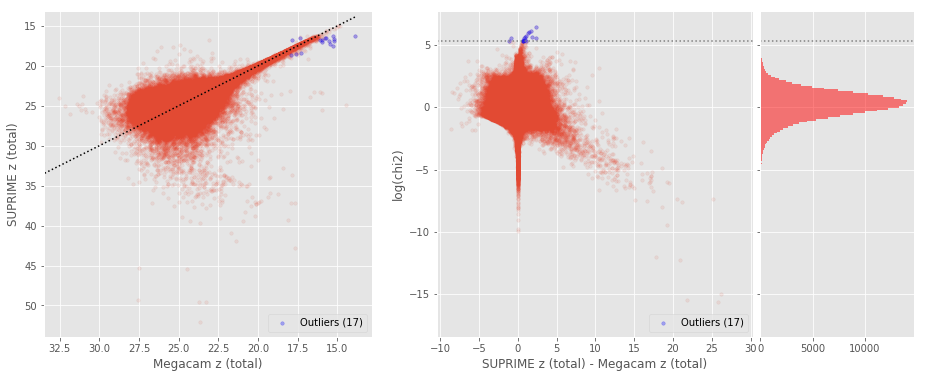

VISTA z (aperture) - Megacam z (aperture) (78825 sources):
- Median: 0.03
- Median Absolute Deviation: 0.22
- 1% percentile: -2.2970978546142575
- 99% percentile: 4.706376647949209
Outliers separation: log(chi2) = 4.76
Number of outliers: 173



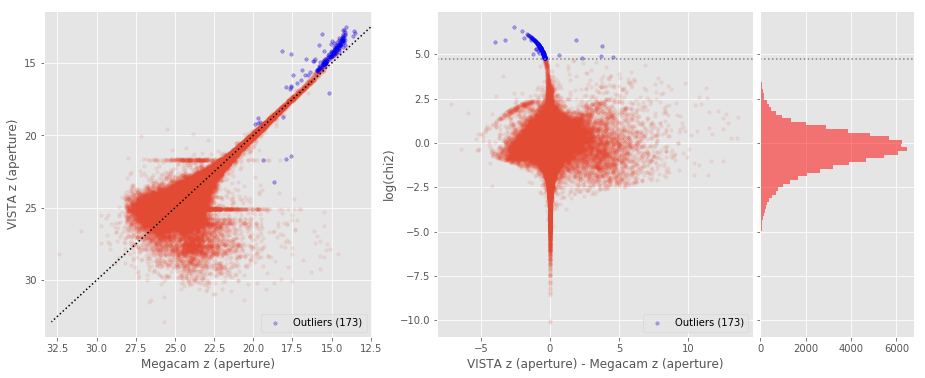

VISTA z (total) - Megacam z (total) (76971 sources):
- Median: 0.09
- Median Absolute Deviation: 0.33
- 1% percentile: -2.261292839050293
- 99% percentile: 4.827427101135255
Outliers separation: log(chi2) = 4.95
Number of outliers: 128



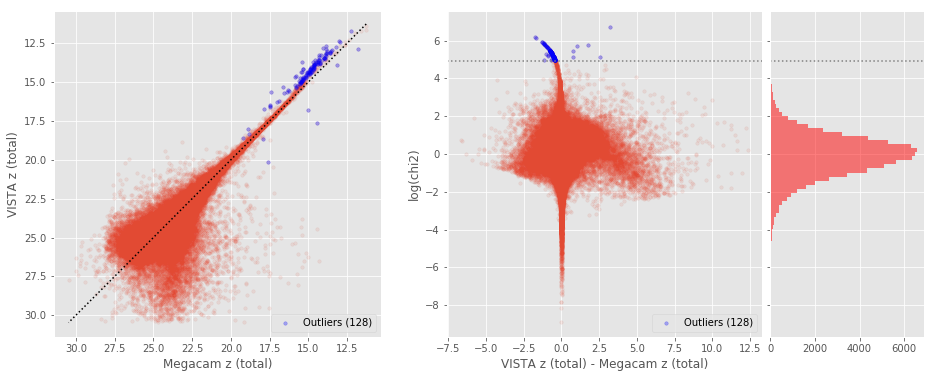

SUPRIME z (aperture) - DECam z (aperture) (116545 sources):
- Median: 0.03
- Median Absolute Deviation: 0.16
- 1% percentile: -2.159123764038086
- 99% percentile: 3.191048965454099
Outliers separation: log(chi2) = 4.48
Number of outliers: 82



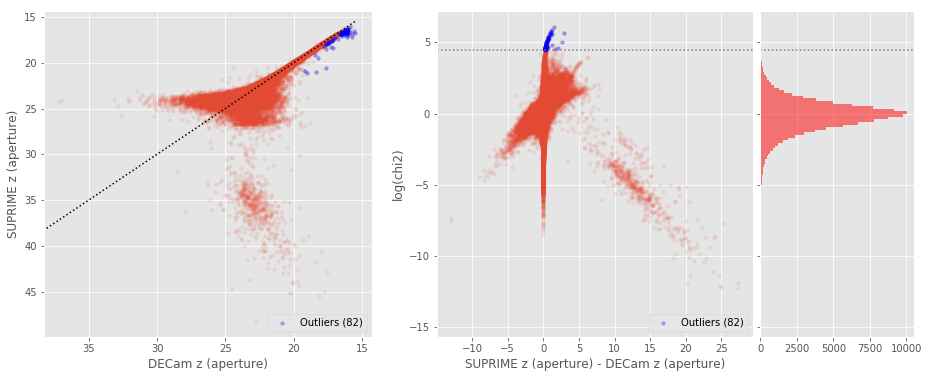

SUPRIME z (total) - DECam z (total) (119130 sources):
- Median: -0.05
- Median Absolute Deviation: 0.24
- 1% percentile: -2.3916022109985353
- 99% percentile: 2.853604068756083
Outliers separation: log(chi2) = 3.98
Number of outliers: 144



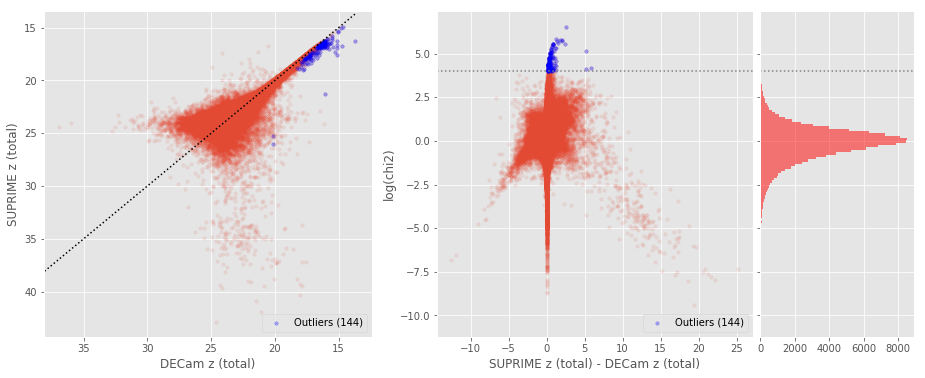

VISTA z (aperture) - DECam z (aperture) (42156 sources):
- Median: 0.08
- Median Absolute Deviation: 0.17
- 1% percentile: -2.4216487884521483
- 99% percentile: 5.692454624176019
Outliers separation: log(chi2) = 4.78
Number of outliers: 180



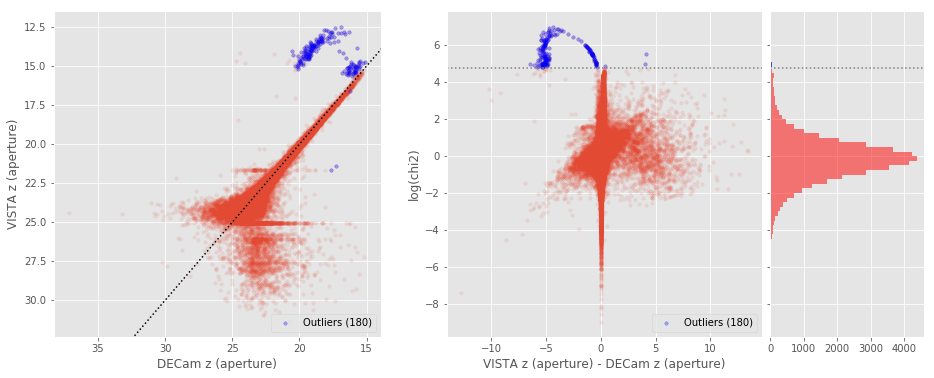

VISTA z (total) - DECam z (total) (43569 sources):
- Median: 0.06
- Median Absolute Deviation: 0.23
- 1% percentile: -2.131437530517578
- 99% percentile: 5.423093032836913
Outliers separation: log(chi2) = 4.20
Number of outliers: 211



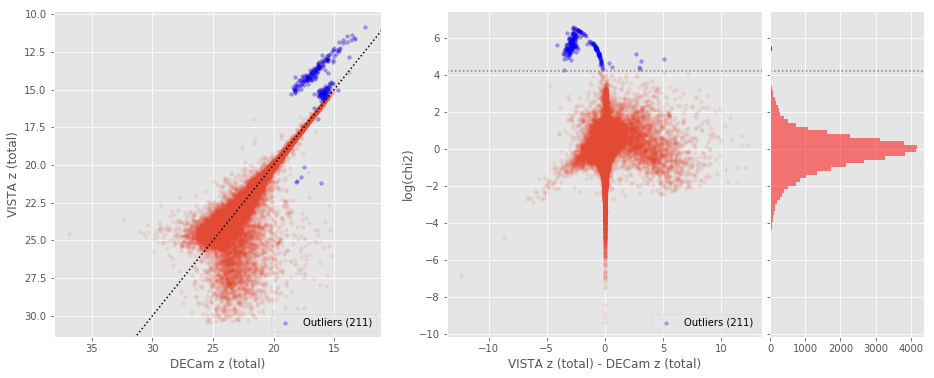

VISTA z (aperture) - SUPRIME z (aperture) (97068 sources):
- Median: 0.06
- Median Absolute Deviation: 0.18
- 1% percentile: -2.5496320724487305
- 99% percentile: 4.396687164306643
Outliers separation: log(chi2) = 4.46
Number of outliers: 52



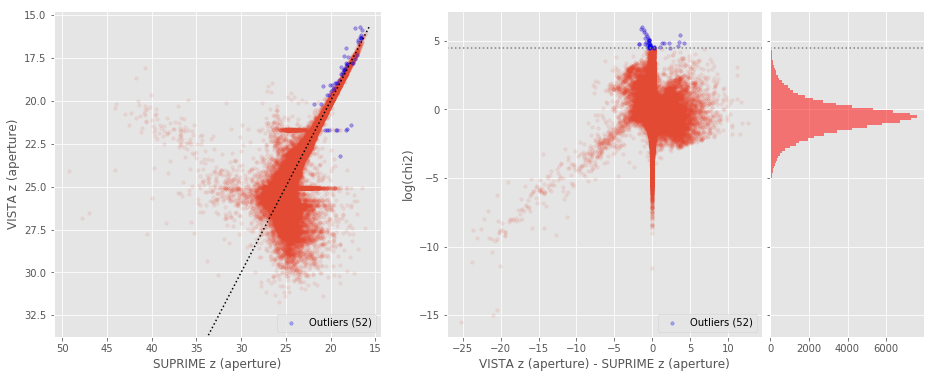

VISTA z (total) - SUPRIME z (total) (94582 sources):
- Median: 0.15
- Median Absolute Deviation: 0.29
- 1% percentile: -2.7073593139648438
- 99% percentile: 4.6971507644653325
Outliers separation: log(chi2) = 4.93
Number of outliers: 21



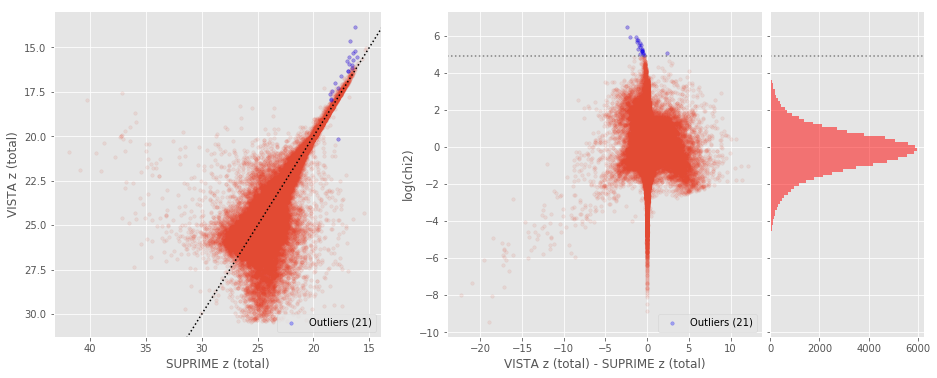

Megacam y (aperture) - GPC1 y (aperture) (6075 sources):
- Median: 0.84
- Median Absolute Deviation: 0.32
- 1% percentile: -1.0219182205200195
- 99% percentile: 3.771398162841803
Outliers separation: log(chi2) = 6.42
Number of outliers: 4



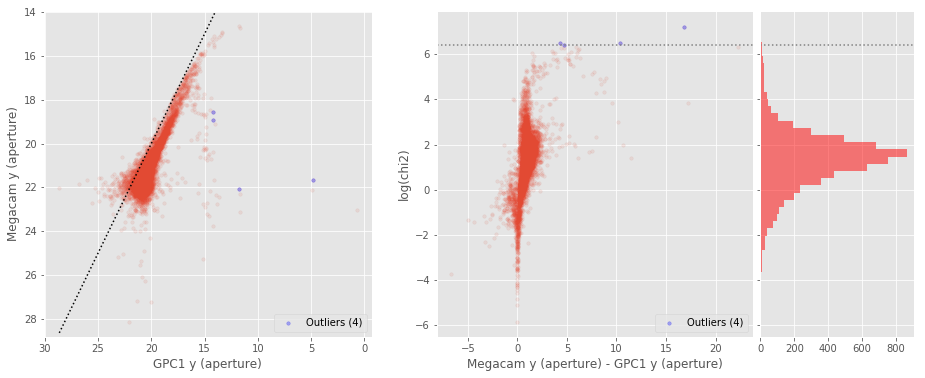

Megacam y (total) - GPC1 y (total) (11118 sources):
- Median: 0.46
- Median Absolute Deviation: 0.37
- 1% percentile: -1.472827033996582
- 99% percentile: 2.691253452301024
Outliers separation: log(chi2) = 6.07
Number of outliers: 5



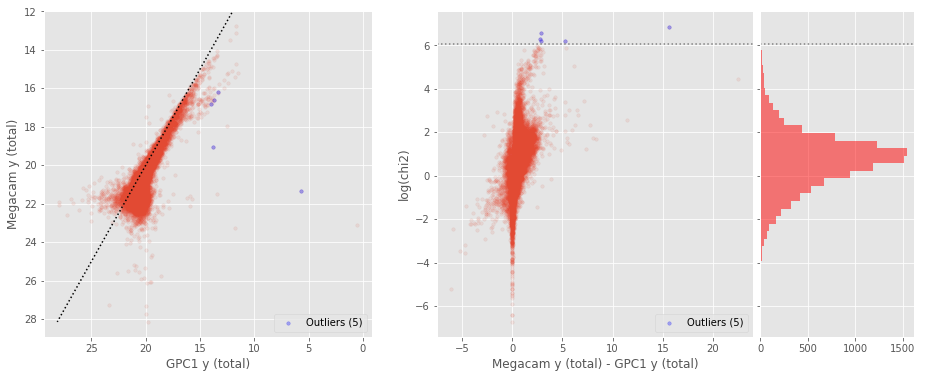

DECam y (aperture) - GPC1 y (aperture) (35407 sources):
- Median: 0.37
- Median Absolute Deviation: 0.32
- 1% percentile: -1.5010620117187499
- 99% percentile: 2.6389246368408275
Outliers separation: log(chi2) = 5.54
Number of outliers: 33



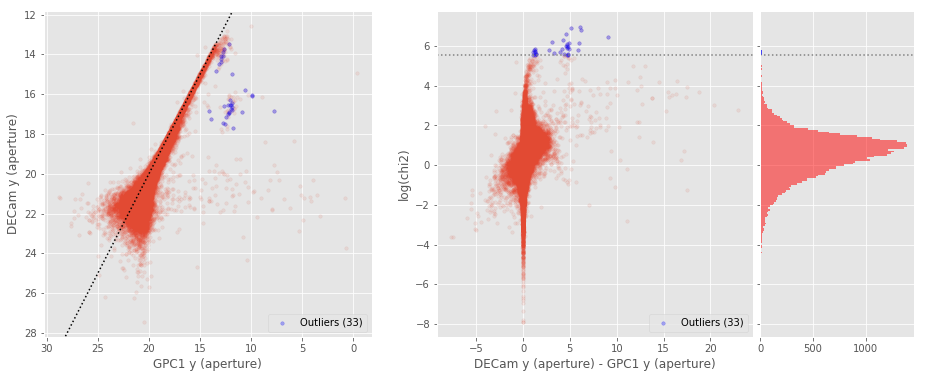

DECam y (total) - GPC1 y (total) (34840 sources):
- Median: -0.03
- Median Absolute Deviation: 0.28
- 1% percentile: -1.6738491821289063
- 99% percentile: 2.911073284149171
Outliers separation: log(chi2) = 4.88
Number of outliers: 30



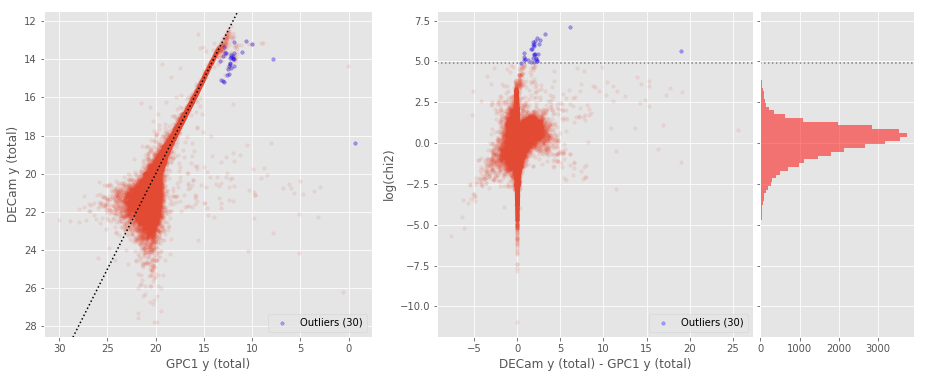

SUPRIME y (aperture) - GPC1 y (aperture) (21732 sources):
- Median: 0.29
- Median Absolute Deviation: 0.32
- 1% percentile: -1.7019075202941896
- 99% percentile: 2.0891254997253403
Outliers separation: log(chi2) = 5.87
Number of outliers: 0



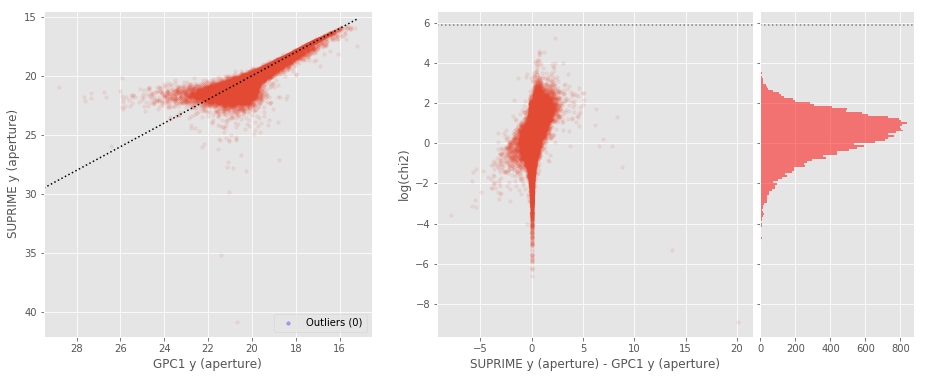

SUPRIME y (total) - GPC1 y (total) (21452 sources):
- Median: -0.08
- Median Absolute Deviation: 0.29
- 1% percentile: -1.6708164978027344
- 99% percentile: 2.3203934478759773
Outliers separation: log(chi2) = 5.44
Number of outliers: 0



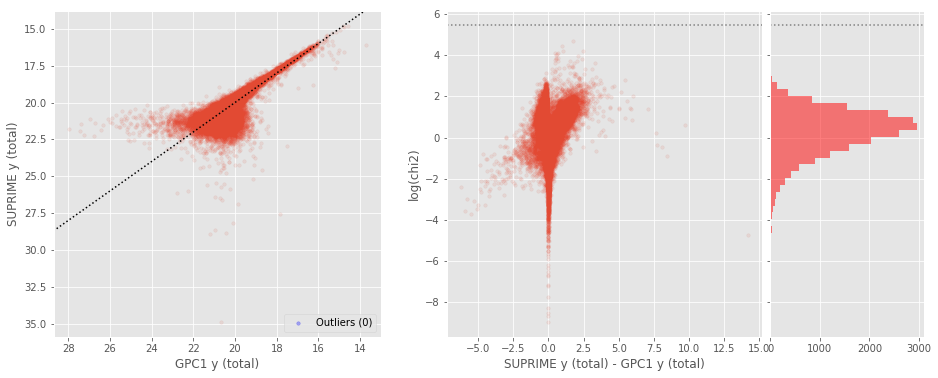

VISTA y (aperture) - GPC1 y (aperture) (10371 sources):
- Median: 0.20
- Median Absolute Deviation: 0.24
- 1% percentile: -1.6740554809570312
- 99% percentile: 2.010924148559568
Outliers separation: log(chi2) = 5.84
Number of outliers: 1



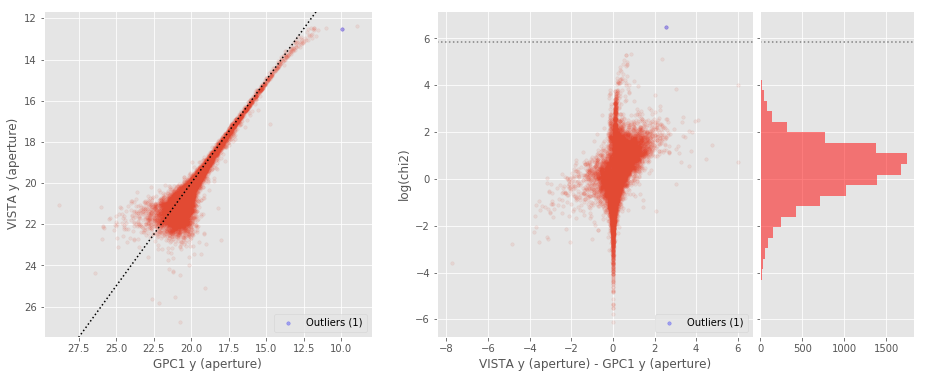

VISTA y (total) - GPC1 y (total) (10257 sources):
- Median: -0.11
- Median Absolute Deviation: 0.27
- 1% percentile: -1.664168243408203
- 99% percentile: 2.3893371582031255
Outliers separation: log(chi2) = 5.77
Number of outliers: 1



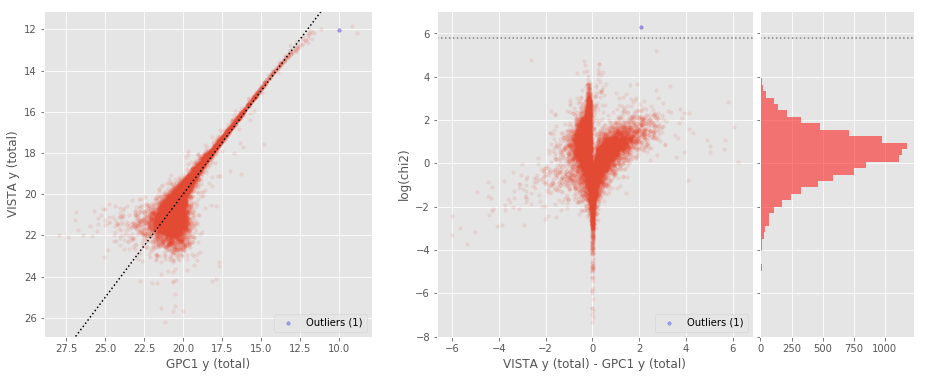

DECam y (aperture) - Megacam y (aperture) (23336 sources):
- Median: -0.45
- Median Absolute Deviation: 0.38
- 1% percentile: -1.984251594543457
- 99% percentile: 2.5002953529358085
Outliers separation: log(chi2) = 7.13
Number of outliers: 0



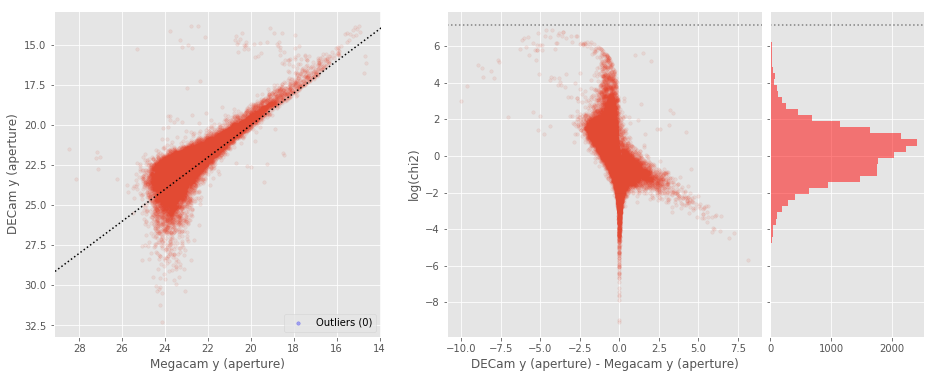

DECam y (total) - Megacam y (total) (36203 sources):
- Median: -0.43
- Median Absolute Deviation: 0.41
- 1% percentile: -2.3155365562438965
- 99% percentile: 2.8200251007080097
Outliers separation: log(chi2) = 7.21
Number of outliers: 0



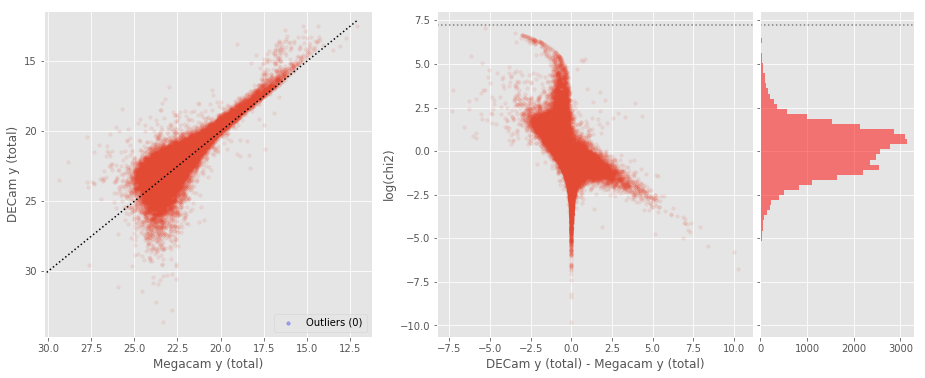

SUPRIME y (aperture) - Megacam y (aperture) (45219 sources):
- Median: -0.44
- Median Absolute Deviation: 0.39
- 1% percentile: -2.3368943023681643
- 99% percentile: 4.5776167678832955
Outliers separation: log(chi2) = 7.75
Number of outliers: 0



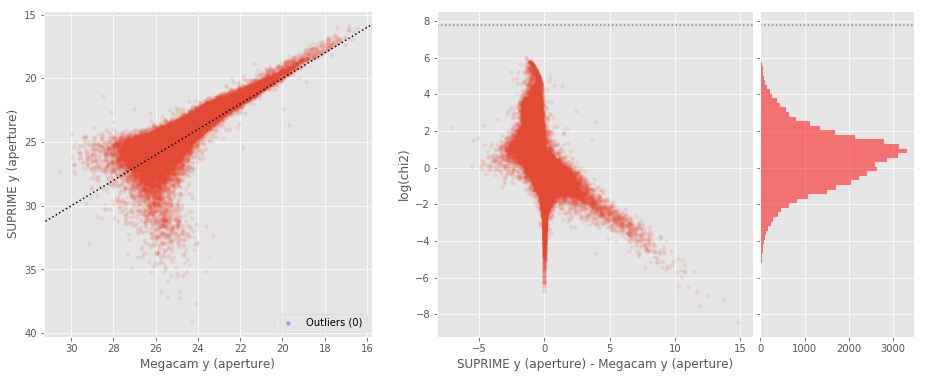

SUPRIME y (total) - Megacam y (total) (58852 sources):
- Median: -0.51
- Median Absolute Deviation: 0.43
- 1% percentile: -3.515143871307373
- 99% percentile: 2.868738403320312
Outliers separation: log(chi2) = 8.12
Number of outliers: 0



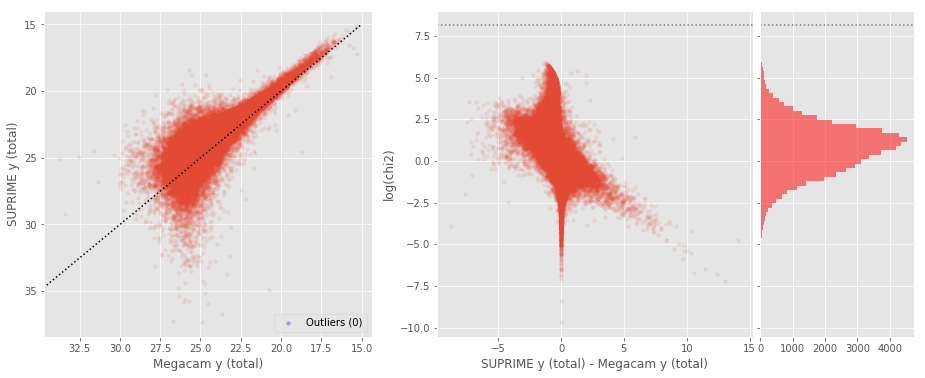

VISTA y (aperture) - Megacam y (aperture) (21410 sources):
- Median: -0.39
- Median Absolute Deviation: 0.29
- 1% percentile: -1.8827911376953124
- 99% percentile: 1.2349134254455565
Outliers separation: log(chi2) = 7.47
Number of outliers: 0



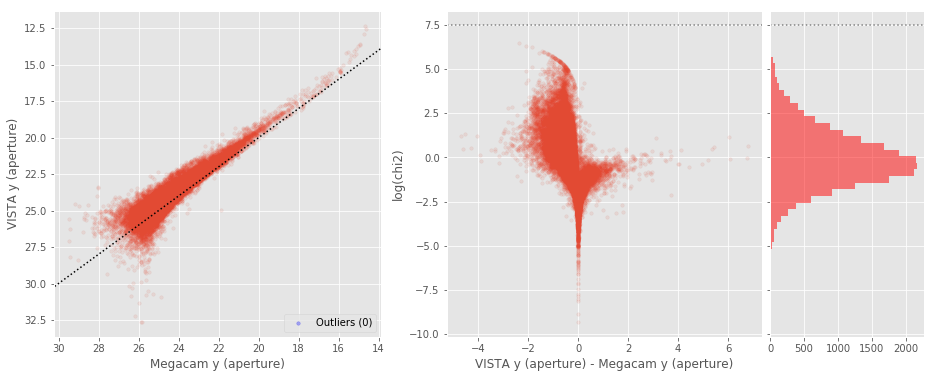

VISTA y (total) - Megacam y (total) (28389 sources):
- Median: -0.33
- Median Absolute Deviation: 0.33
- 1% percentile: -1.9480247497558594
- 99% percentile: 1.0471865081787097
Outliers separation: log(chi2) = 9.02
Number of outliers: 0



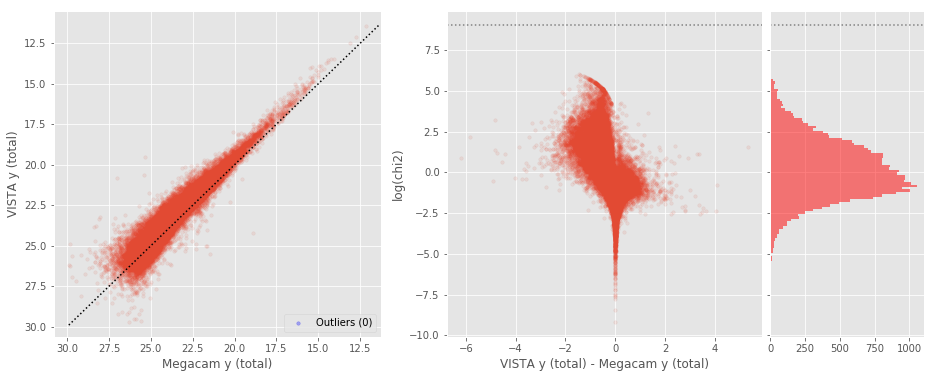

SUPRIME y (aperture) - DECam y (aperture) (86677 sources):
- Median: -0.09
- Median Absolute Deviation: 0.26
- 1% percentile: -2.8891226196289064
- 99% percentile: 1.4577851867675782
Outliers separation: log(chi2) = 4.15
Number of outliers: 17



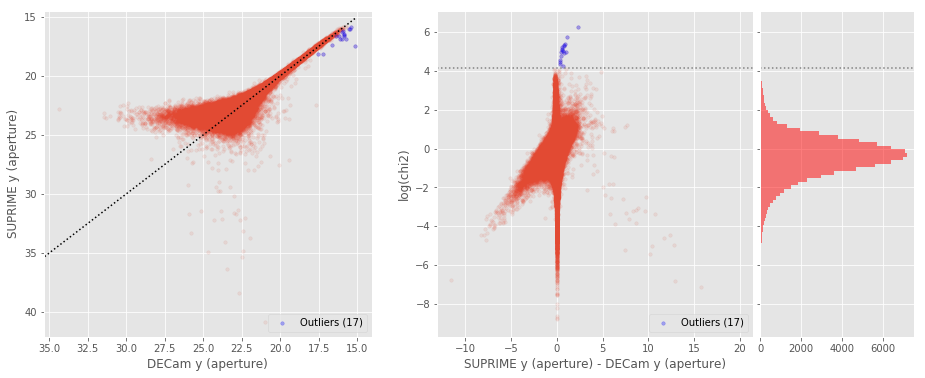

SUPRIME y (total) - DECam y (total) (81051 sources):
- Median: -0.09
- Median Absolute Deviation: 0.36
- 1% percentile: -3.335322380065918
- 99% percentile: 1.9665117263793945
Outliers separation: log(chi2) = 4.26
Number of outliers: 23



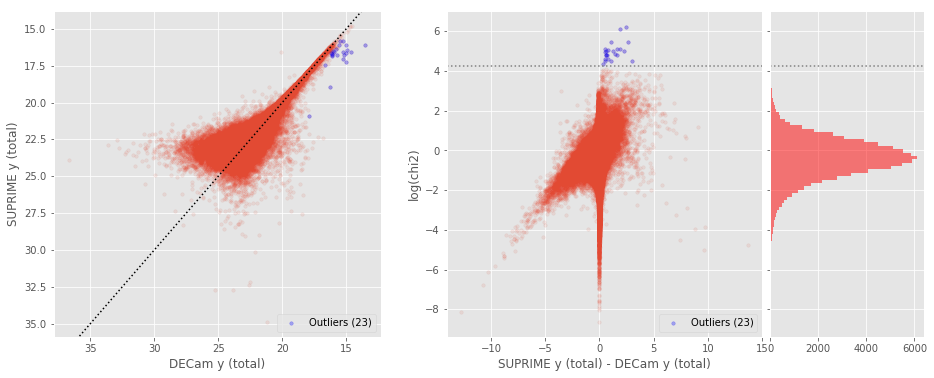

VISTA y (aperture) - DECam y (aperture) (33889 sources):
- Median: -0.15
- Median Absolute Deviation: 0.25
- 1% percentile: -2.8671192932128906
- 99% percentile: 1.2725366210937517
Outliers separation: log(chi2) = 4.41
Number of outliers: 69



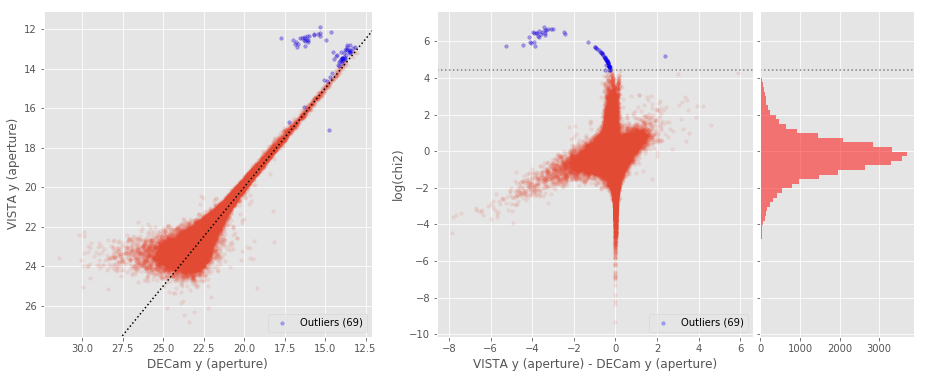

VISTA y (total) - DECam y (total) (32415 sources):
- Median: -0.09
- Median Absolute Deviation: 0.31
- 1% percentile: -3.132636604309082
- 99% percentile: 1.7420294952392619
Outliers separation: log(chi2) = 4.45
Number of outliers: 50



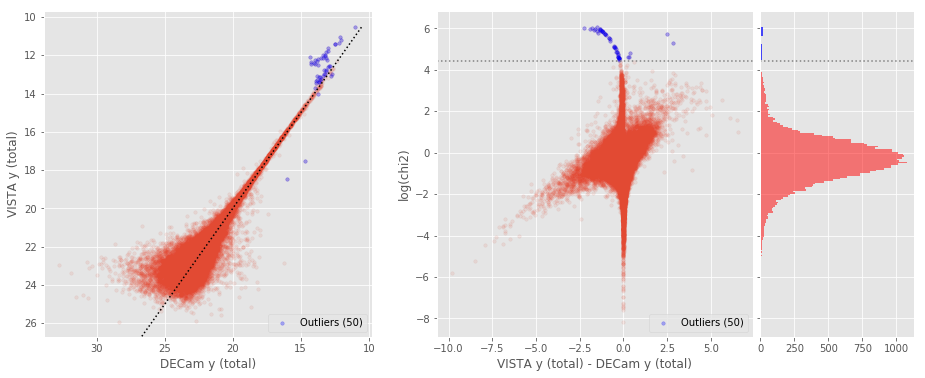

VISTA y (aperture) - SUPRIME y (aperture) (113366 sources):
- Median: -0.02
- Median Absolute Deviation: 0.23
- 1% percentile: -3.0423233032226564
- 99% percentile: 1.6776219367981013
Outliers separation: log(chi2) = 4.26
Number of outliers: 133



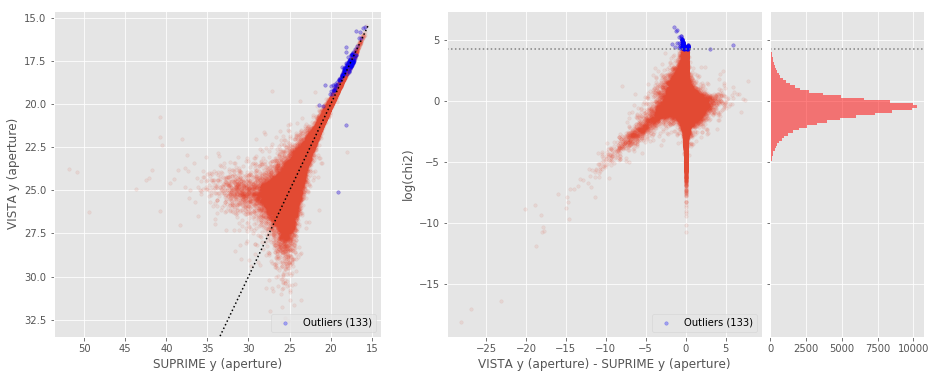

VISTA y (total) - SUPRIME y (total) (109515 sources):
- Median: 0.10
- Median Absolute Deviation: 0.33
- 1% percentile: -2.848756332397461
- 99% percentile: 2.8326034545898438
Outliers separation: log(chi2) = 4.70
Number of outliers: 37



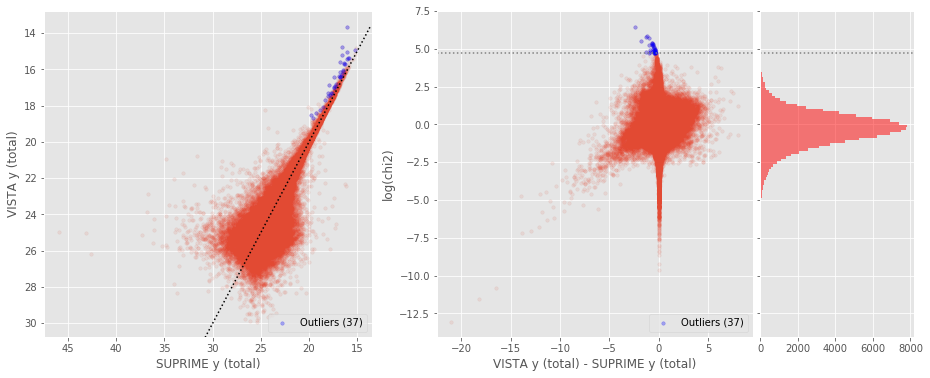

UKIDSS J (aperture) - VISTA J (aperture) (32307 sources):
- Median: 0.07
- Median Absolute Deviation: 0.16
- 1% percentile: -1.834717788696289
- 99% percentile: 1.0527189636230452
Outliers separation: log(chi2) = 5.32
Number of outliers: 25



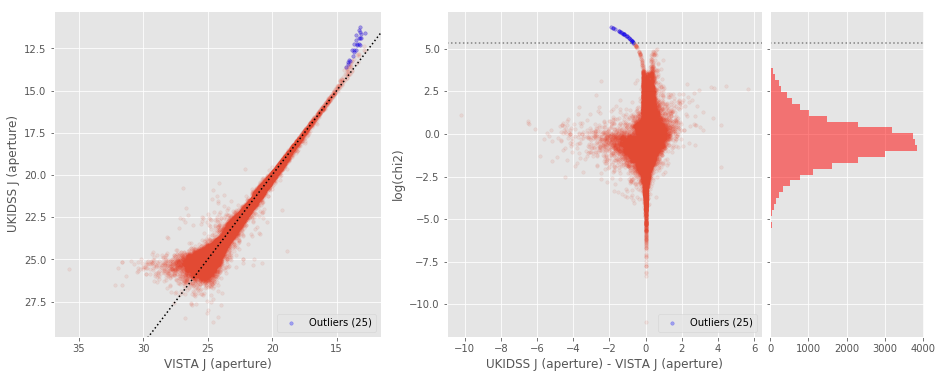

UKIDSS J (total) - VISTA J (total) (32767 sources):
- Median: -0.04
- Median Absolute Deviation: 0.19
- 1% percentile: -1.8791149520874022
- 99% percentile: 1.122645149230957
Outliers separation: log(chi2) = 5.35
Number of outliers: 16



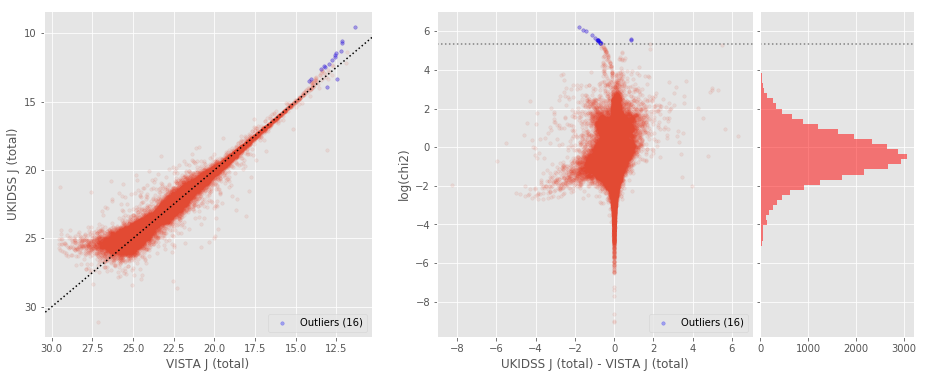

WIRCAM J (aperture) - VISTA J (aperture) (11343 sources):
- Median: 0.17
- Median Absolute Deviation: 0.18
- 1% percentile: -1.0656179809570312
- 99% percentile: 2.0264616394042965
Outliers separation: log(chi2) = 5.44
Number of outliers: 2



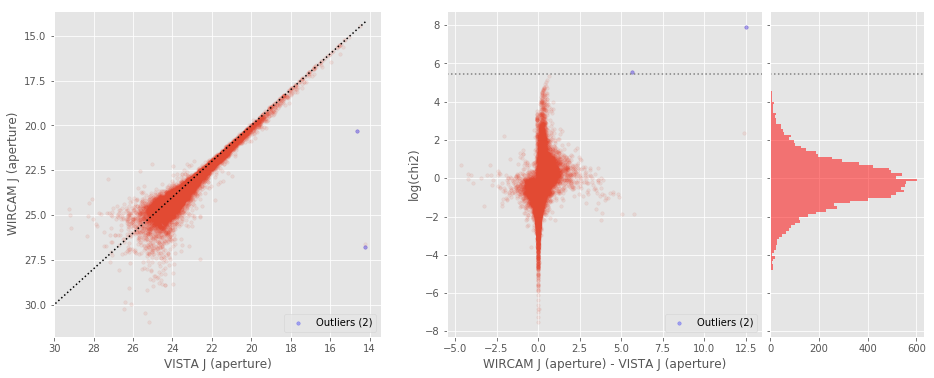

WIRCAM J (total) - VISTA J (total) (11238 sources):
- Median: -0.00
- Median Absolute Deviation: 0.20
- 1% percentile: -1.3250644493103028
- 99% percentile: 2.2350785255432117
Outliers separation: log(chi2) = 4.48
Number of outliers: 10



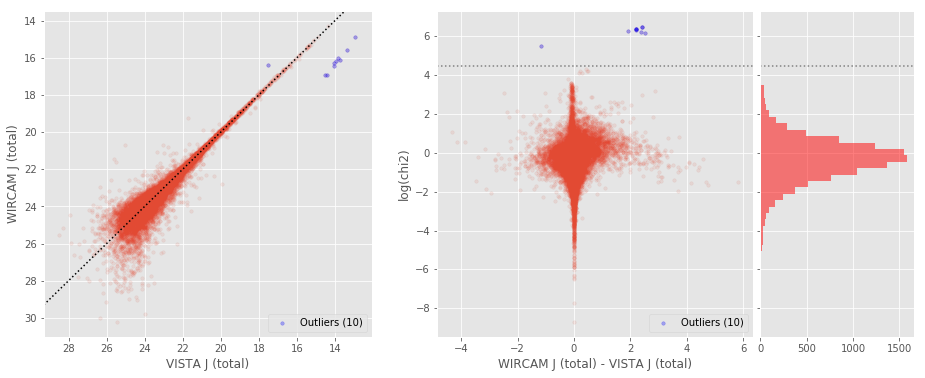

WIRCAM J (aperture) - UKIDSS J (aperture) (4026 sources):
- Median: 0.11
- Median Absolute Deviation: 0.08
- 1% percentile: -0.31207895278930664
- 99% percentile: 1.1087632179260254
Outliers separation: log(chi2) = 4.91
Number of outliers: 3



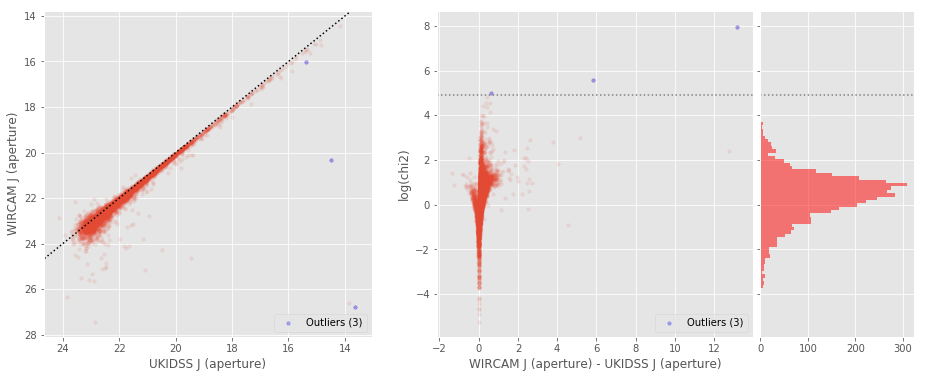

WIRCAM J (total) - UKIDSS J (total) (4030 sources):
- Median: -0.08
- Median Absolute Deviation: 0.17
- 1% percentile: -0.9697694206237792
- 99% percentile: 1.538399200439453
Outliers separation: log(chi2) = 5.61
Number of outliers: 9



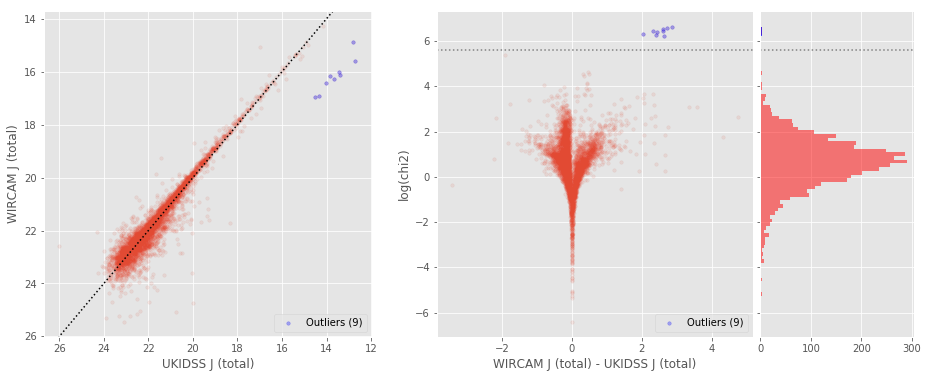

UKIDSS H (aperture) - VISTA H (aperture) (19034 sources):
- Median: 0.15
- Median Absolute Deviation: 0.19
- 1% percentile: -2.328097267150879
- 99% percentile: 1.4198775482177721
Outliers separation: log(chi2) = 5.06
Number of outliers: 10



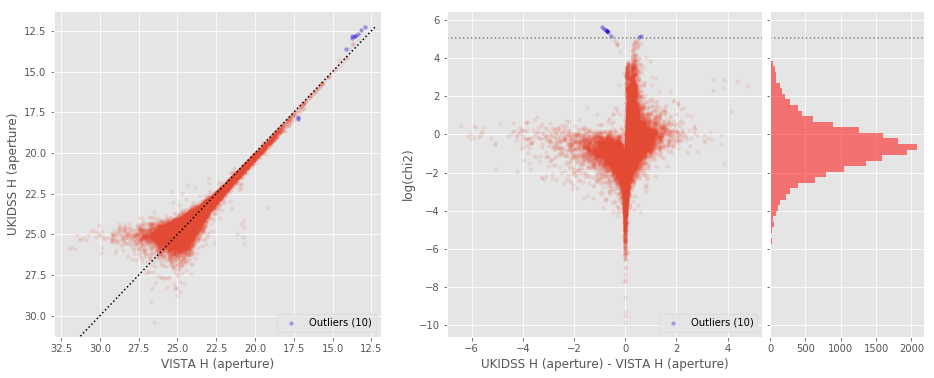

UKIDSS H (total) - VISTA H (total) (19488 sources):
- Median: -0.09
- Median Absolute Deviation: 0.20
- 1% percentile: -2.3164814376831053
- 99% percentile: 1.382450122833258
Outliers separation: log(chi2) = 3.81
Number of outliers: 18



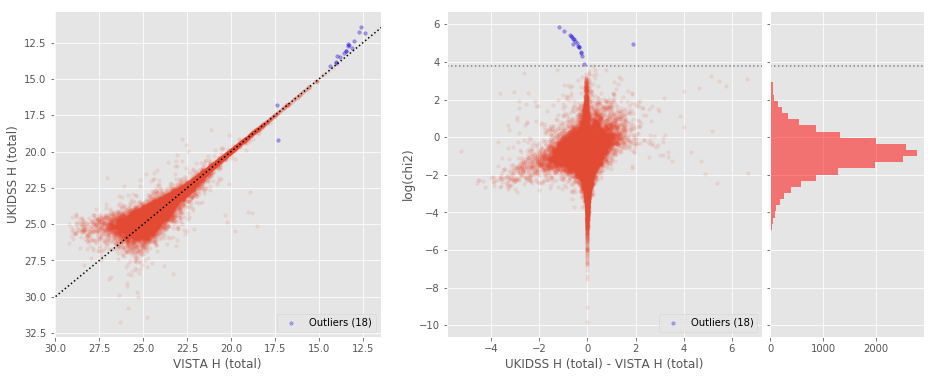

WIRCAM H (aperture) - VISTA H (aperture) (11371 sources):
- Median: 0.09
- Median Absolute Deviation: 0.17
- 1% percentile: -1.2349733352661132
- 99% percentile: 1.9758518218994077
Outliers separation: log(chi2) = 4.59
Number of outliers: 9



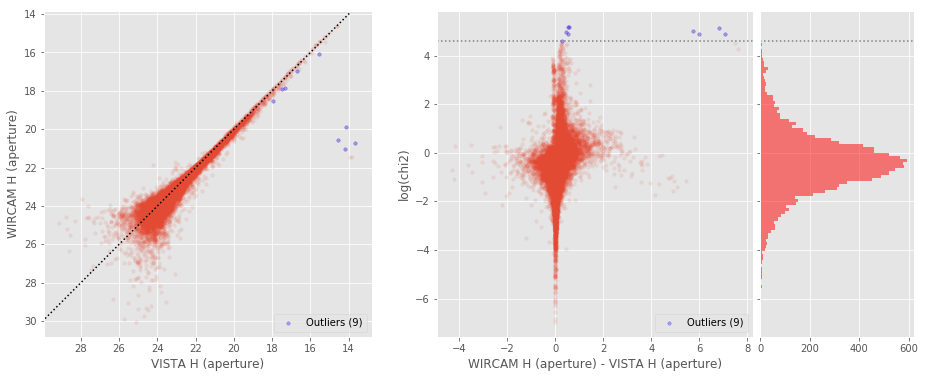

WIRCAM H (total) - VISTA H (total) (11268 sources):
- Median: -0.05
- Median Absolute Deviation: 0.20
- 1% percentile: -1.4261685943603515
- 99% percentile: 2.1119466590881344
Outliers separation: log(chi2) = 4.26
Number of outliers: 9



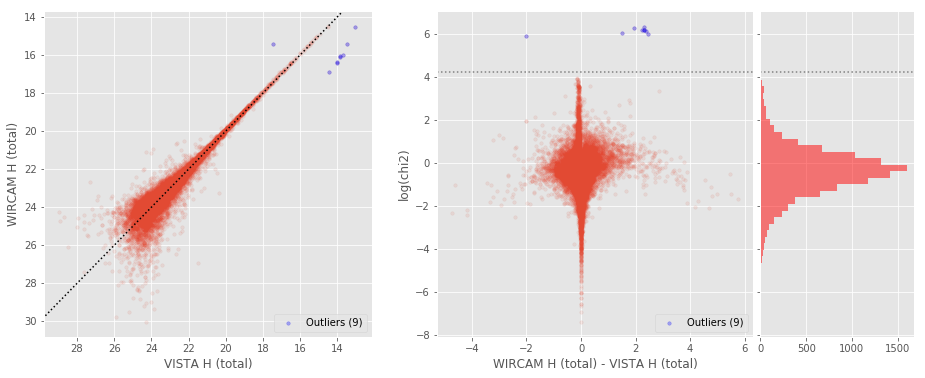

No sources have both UKIDSS H (aperture) and WIRCAM H (aperture) values.

No sources have both UKIDSS H (total) and WIRCAM H (total) values.

UKIDSS K (aperture) - VISTA Ks (aperture) (37121 sources):
- Median: 0.06
- Median Absolute Deviation: 0.14
- 1% percentile: -1.7895183563232422
- 99% percentile: 1.1380359649658223
Outliers separation: log(chi2) = 5.03
Number of outliers: 20



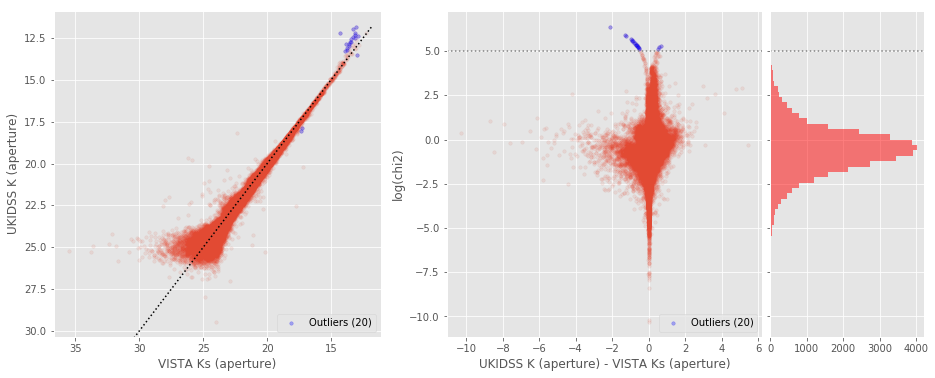

UKIDSS K (total) - VISTA Ks (total) (37749 sources):
- Median: -0.00
- Median Absolute Deviation: 0.20
- 1% percentile: -1.991437225341797
- 99% percentile: 1.1465028381347637
Outliers separation: log(chi2) = 5.91
Number of outliers: 3



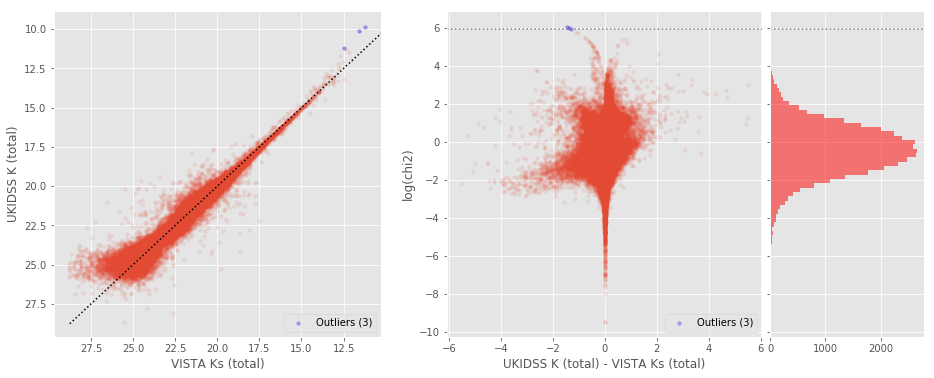

WIRCAM Ks (aperture) - VISTA Ks (aperture) (11461 sources):
- Median: 0.11
- Median Absolute Deviation: 0.16
- 1% percentile: -1.6354053497314451
- 99% percentile: 1.224519729614257
Outliers separation: log(chi2) = 4.95
Number of outliers: 5



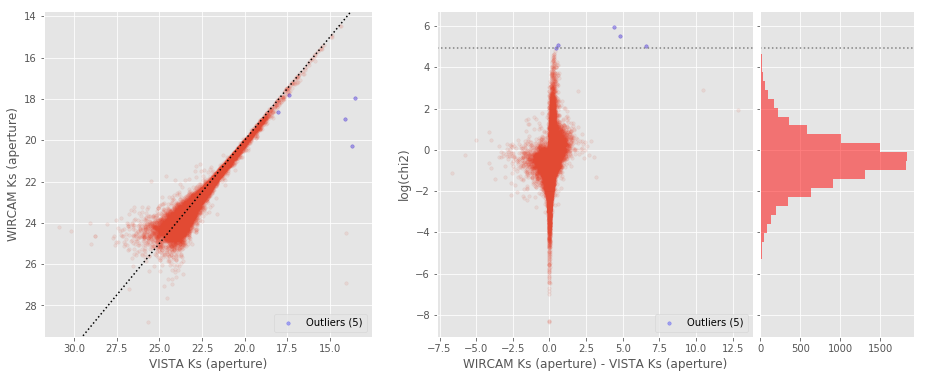

WIRCAM Ks (total) - VISTA Ks (total) (35926 sources):
- Median: -0.07
- Median Absolute Deviation: 0.17
- 1% percentile: -1.958221435546875
- 99% percentile: 1.266533374786377
Outliers separation: log(chi2) = 4.51
Number of outliers: 8



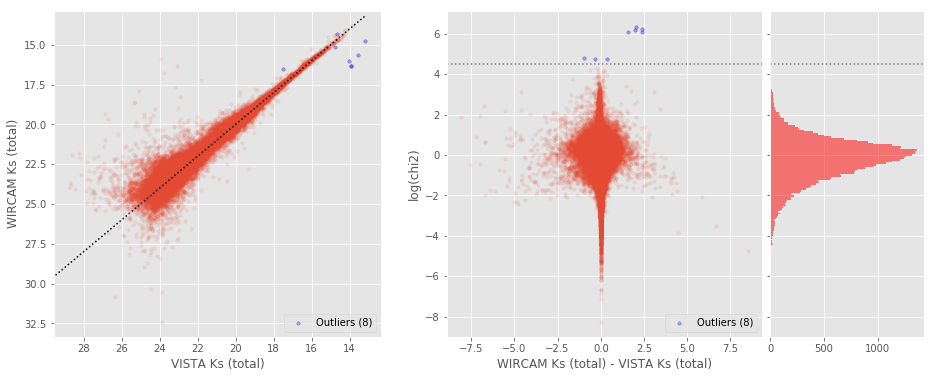

WIRCAM Ks (aperture) - UKIDSS K (aperture) (4553 sources):
- Median: 0.09
- Median Absolute Deviation: 0.08
- 1% percentile: -0.4398060607910156
- 99% percentile: 0.9154413604736316
Outliers separation: log(chi2) = 5.13
Number of outliers: 2



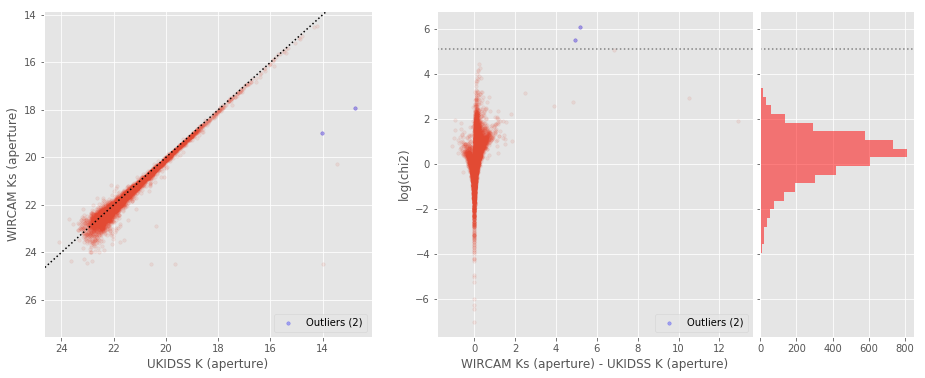

WIRCAM Ks (total) - UKIDSS K (total) (11740 sources):
- Median: -0.09
- Median Absolute Deviation: 0.17
- 1% percentile: -1.3679367065429688
- 99% percentile: 1.4838515472412126
Outliers separation: log(chi2) = 5.55
Number of outliers: 5



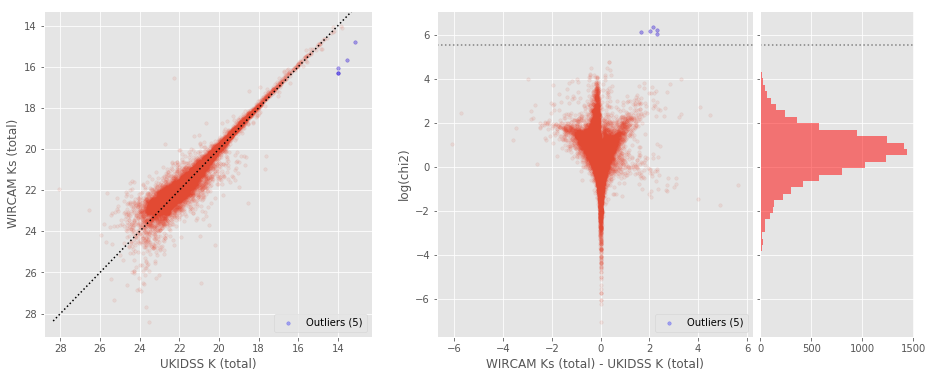

In [34]:
for band_of_a_kind in all_bands:
    for band1, band2 in itertools.combinations(band_of_a_kind, 2):

        basecol1, basecol2 = band1.replace(" ", "_").lower(), band2.replace(" ", "_").lower()
        
        if basecol1 == "gpc1_g" and basecol2 == "decam_g":
            savefig = True
        else:
            savefig = False
        
        # Aperture mag
        col1, col2 = "m_ap_{}".format(basecol1), "m_ap_{}".format(basecol2)
        ecol1, ecol2 = "merr_ap_{}".format(basecol1), "merr_ap_{}".format(basecol2)
        outliers(master_catalogue[col1], master_catalogue[col2],
                 master_catalogue[ecol1], master_catalogue[ecol2],
                 labels=("{} (aperture)".format(band1), "{} (aperture)".format(band2)), savefig=savefig)
        
        # Tot mag
        col1, col2 = "m_{}".format(basecol1), "m_{}".format(basecol2)
        ecol1, ecol2 = "merr_{}".format(basecol1), "merr_{}".format(basecol2)
        outliers(master_catalogue[col1], master_catalogue[col2], 
                 master_catalogue[ecol1], master_catalogue[ecol2],
                 labels=("{} (total)".format(band1), "{} (total)".format(band2)))

for j in range(40):
    plt.close()

## 4/ Aperture correction issues

In [35]:
def apcor_check(x, y, stellarity, labels=["x", "y"], savefig=False):
    import matplotlib.gridspec as gridspec
    from astropy import visualization as vz
    
    #fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(16, 6))   # 
    fig = plt.figure(figsize=(13, 6))

    gs1 = gridspec.GridSpec(1, 1)
    gs1.update(left=0.05, right=0.4, wspace=0.05)
    ax1 = plt.subplot(gs1[:, :-1])

    gs2 = gridspec.GridSpec(1, 3)
    gs2.update(left=0.47, right=0.98, hspace=0.05, wspace=0.05)
    ax2 = plt.subplot(gs2[:, :-1])
    ax3 = plt.subplot(gs2[:, -1], sharey=ax2)

    
    # Use only finite values
    mask = np.isfinite(x) & np.isfinite(y) & np.isfinite(stellarity)
    x = np.copy(x[mask])
    y = np.copy(y[mask])
    stellarity = np.copy(stellarity[mask])


    diff = y - x

    x_label, y_label = labels
    
    # If the difference is all NaN there is nothing to compare.
    if np.isnan(diff).all():
        print("No sources have both {} and {} values.".format(
            x_label, y_label))
        print("")
        return
    
    
    diff_label = "{} - {}".format(y_label, x_label)
    print("{}:".format(diff_label))
    
    # Subsample
    zoom = (x > 16) & (x < 20)


    # Comparing mag
    ax1.scatter(x, diff, marker='.', alpha=0.1, s=50)
    ax1.invert_xaxis()
    ax1.set_ylabel(diff_label)
    ax1.set_xlabel(x_label)
    

    # Zoom Plot
    y_min, y_max = np.percentile(diff[zoom], [1., 99.])
    y_delta = .1 * (y_max - y_min)
    y_min -= y_delta
    y_max += y_delta

    if len(x[zoom]) < 1000:
        alpha = 0.4
    else:
        alpha = 0.1
    pl = ax2.scatter(x[zoom], diff[zoom], marker='.', alpha=alpha, s=50, c=stellarity[zoom], cmap="jet")
    ax2.invert_xaxis()
    ax2.set_ylabel(diff_label)
    ax2.set_xlabel(x_label)
    ax2.set_ylim([y_min, y_max])
    fig.colorbar(pl, label="stellarity (1=star)")
    
    #ax2.legend(loc='lower right', numpoints=1)
    
    # Hist
    n, bins, patches = vz.hist(diff[zoom], ax=ax3, bins='knuth', facecolor='black', lw = 2, alpha=0.5,\
                                   orientation="horizontal")
    ax3.yaxis.set_tick_params(labelleft=False)
    
    # Save ex. fig
    if savefig:
        survey_label = ((diff_label.replace(" ", "_")).replace("(", "")).replace(")", "")
        figname = field + "_apcorrIssues_" + survey_label + ".png"
        plt.savefig("/data/help/plots/" + figname, bbox_inches='tight')


    display(fig)
    plt.close()

Megacam g (aperture) - GPC1 g (aperture):


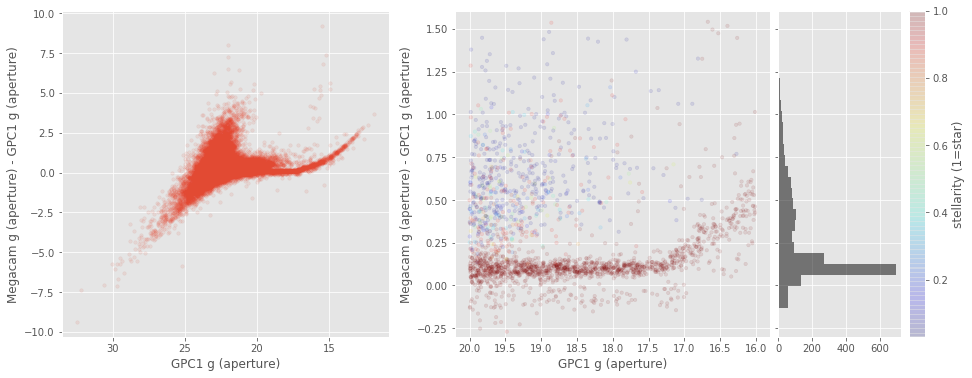

DECam g (aperture) - GPC1 g (aperture):


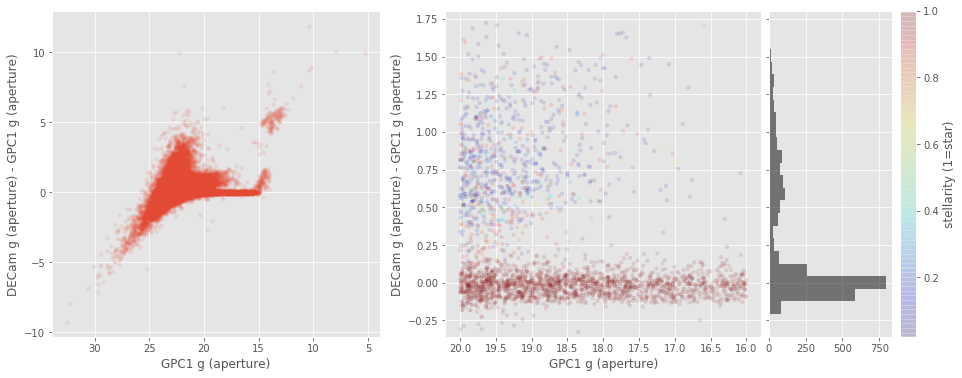

SUPRIME g (aperture) - GPC1 g (aperture):


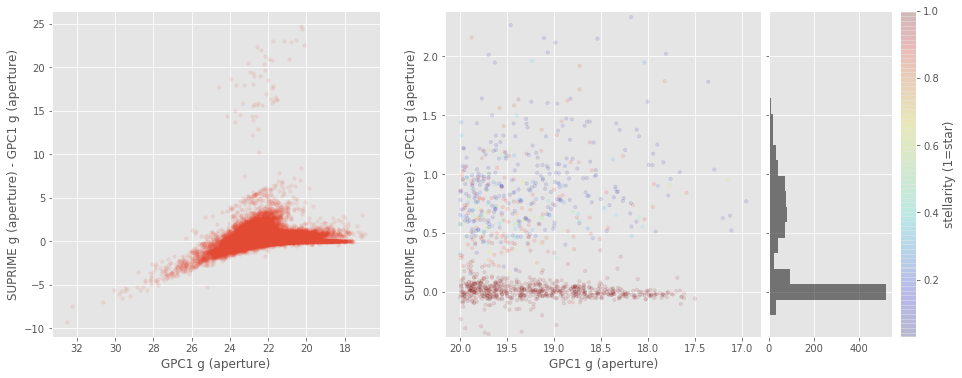

DECam g (aperture) - Megacam g (aperture):


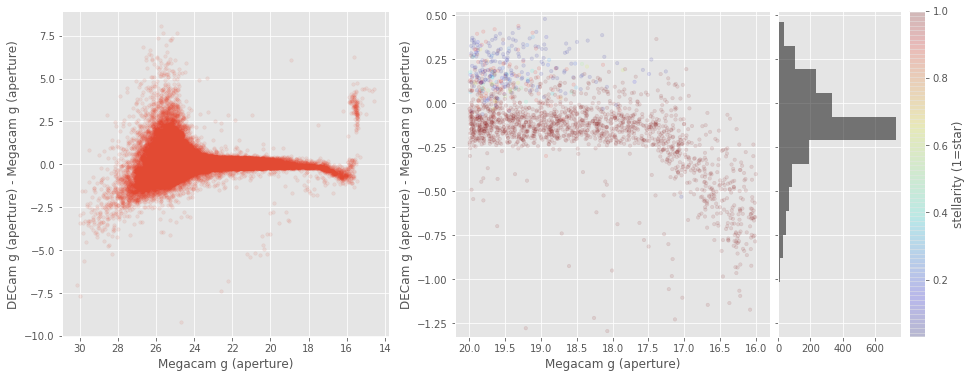

SUPRIME g (aperture) - Megacam g (aperture):


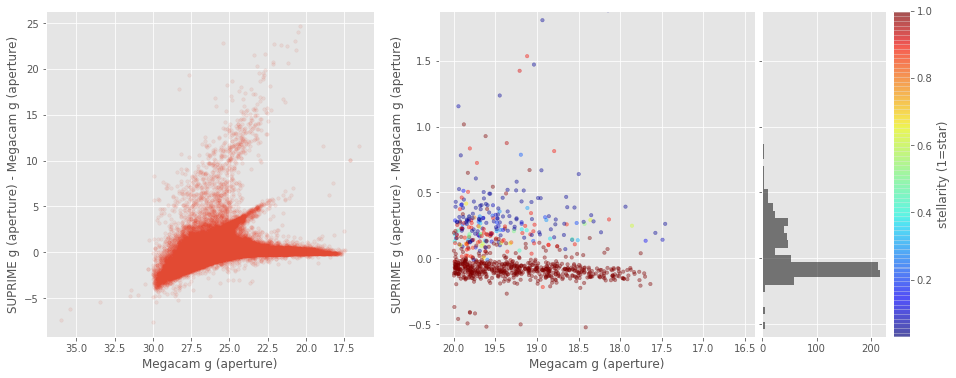

SUPRIME g (aperture) - DECam g (aperture):


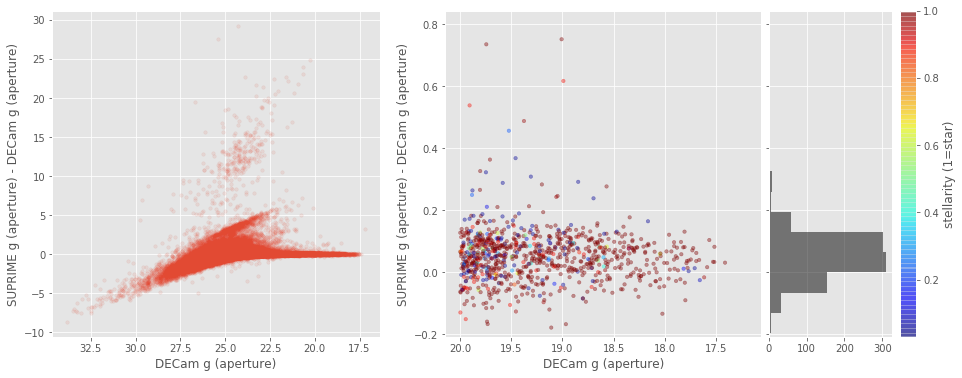

Megacam r (aperture) - GPC1 r (aperture):


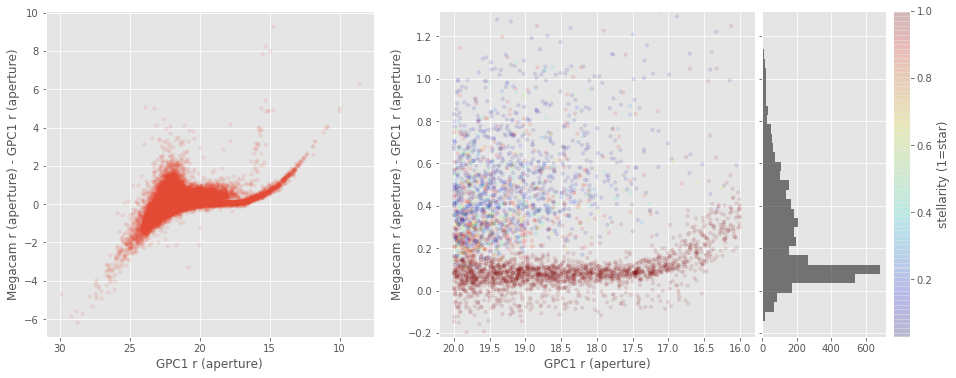

DECam r (aperture) - GPC1 r (aperture):


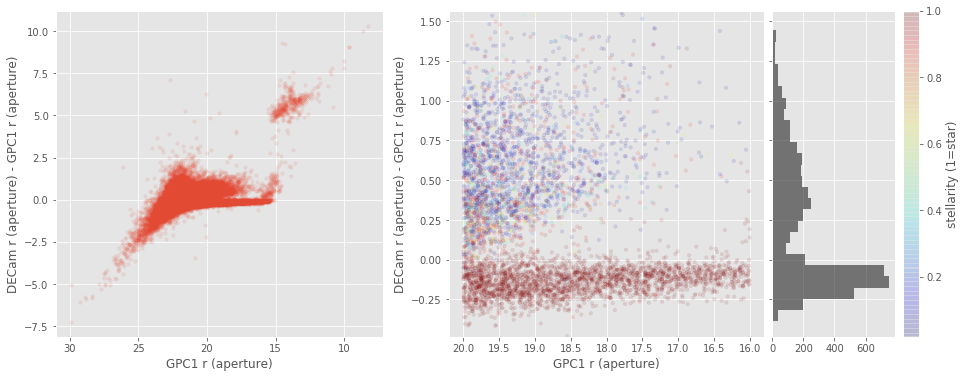

SUPRIME r (aperture) - GPC1 r (aperture):


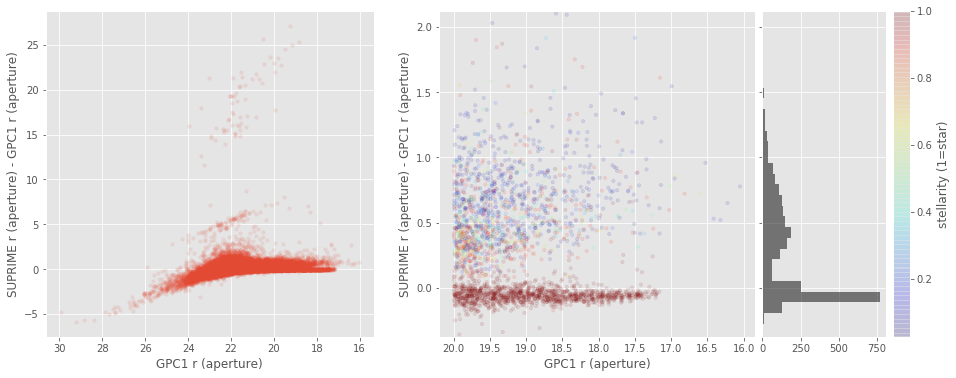

DECam r (aperture) - Megacam r (aperture):


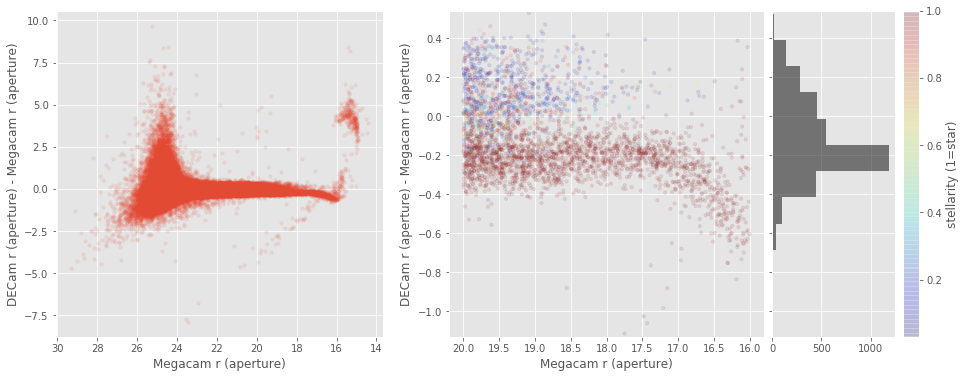

SUPRIME r (aperture) - Megacam r (aperture):


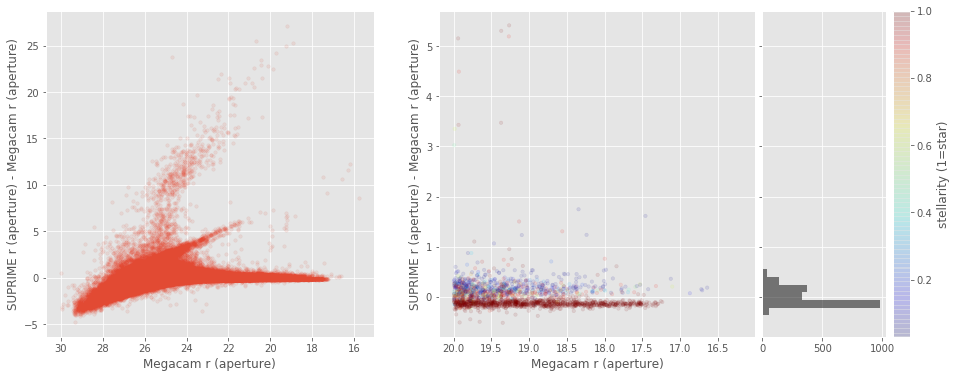

SUPRIME r (aperture) - DECam r (aperture):


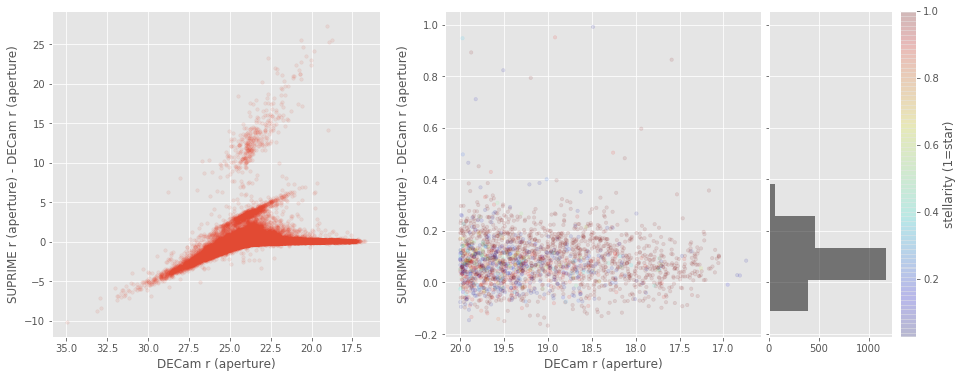

Megacam i (aperture) - GPC1 i (aperture):


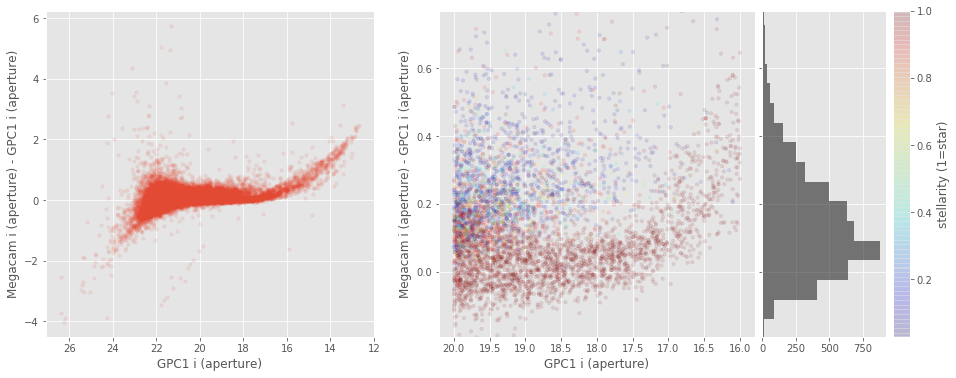

DECam i (aperture) - GPC1 i (aperture):


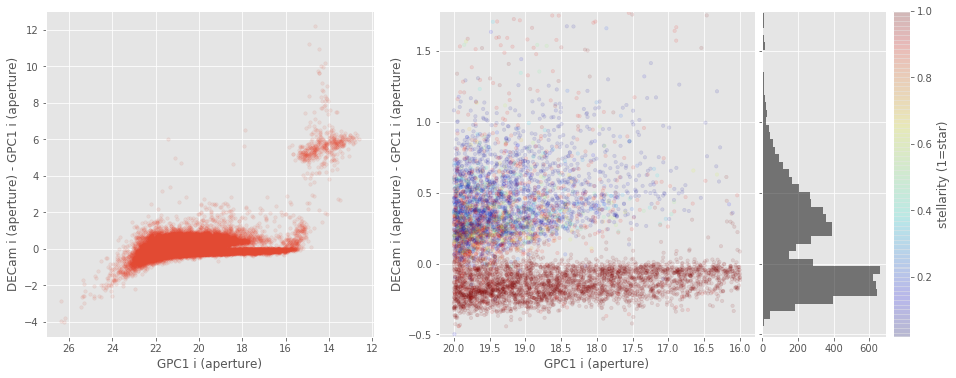

SUPRIME i (aperture) - GPC1 i (aperture):


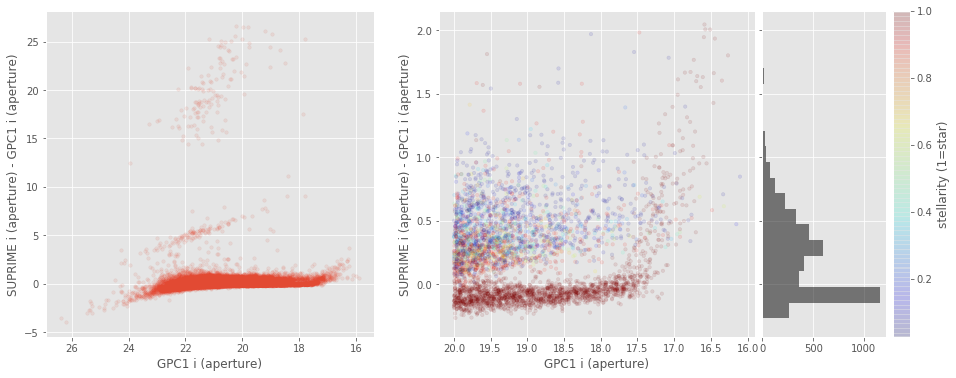

DECam i (aperture) - Megacam i (aperture):


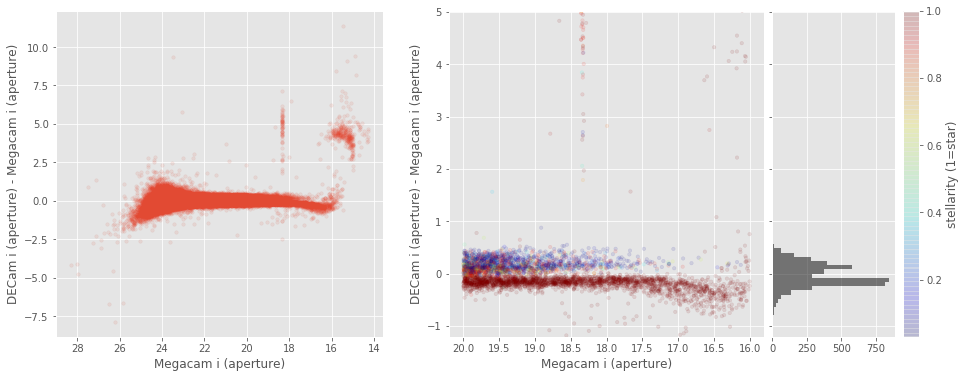

SUPRIME i (aperture) - Megacam i (aperture):


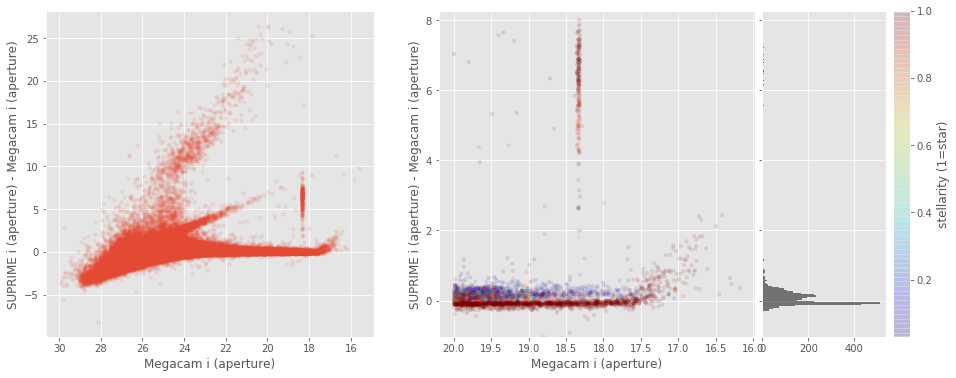

SUPRIME i (aperture) - DECam i (aperture):


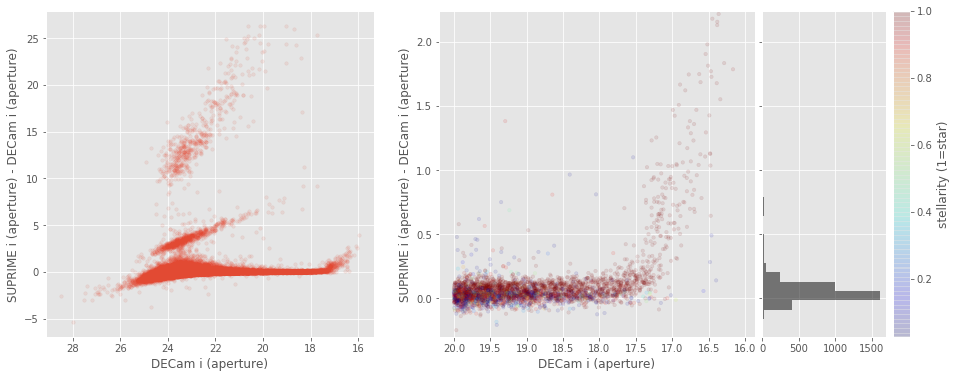

Megacam z (aperture) - GPC1 z (aperture):


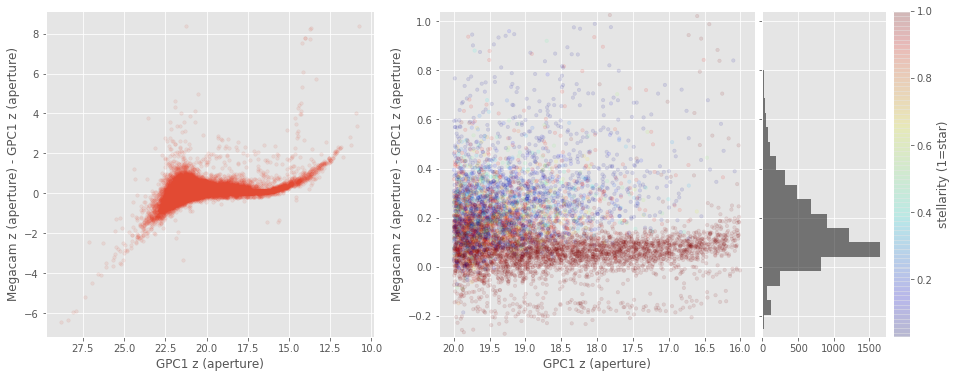

DECam z (aperture) - GPC1 z (aperture):


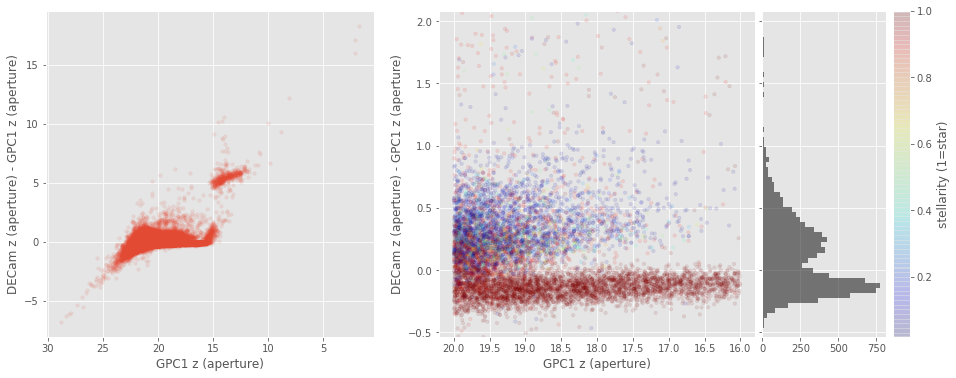

SUPRIME z (aperture) - GPC1 z (aperture):


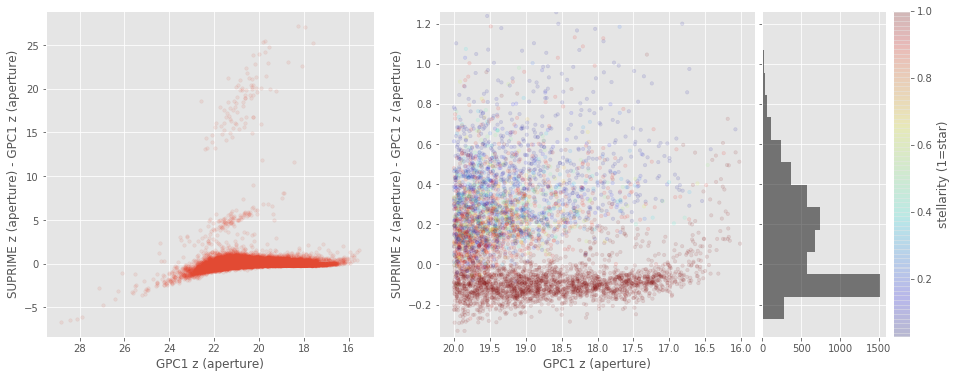

VISTA z (aperture) - GPC1 z (aperture):


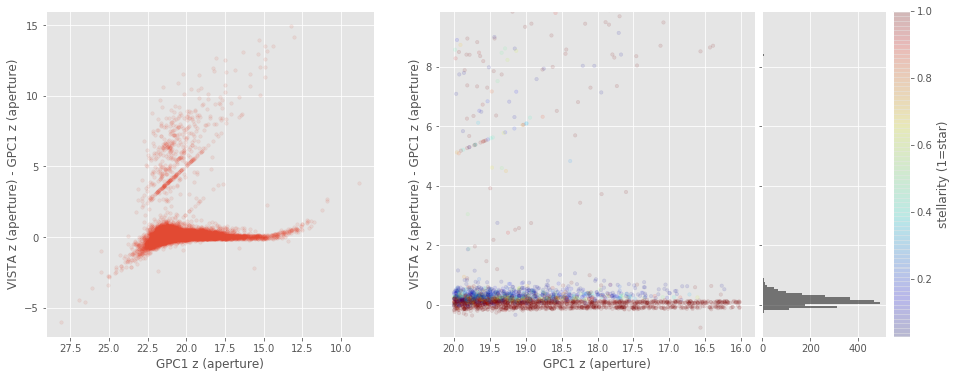

DECam z (aperture) - Megacam z (aperture):


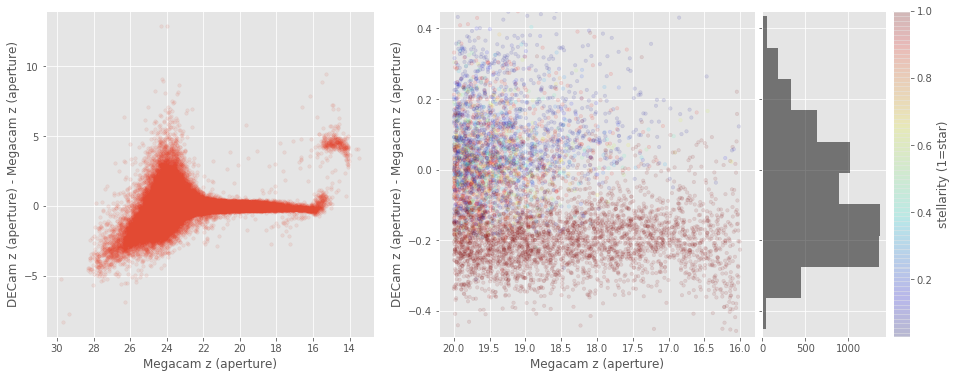

SUPRIME z (aperture) - Megacam z (aperture):


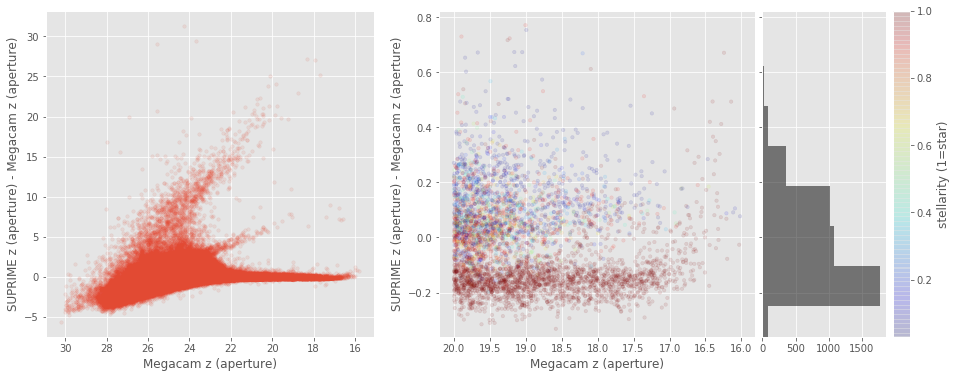

VISTA z (aperture) - Megacam z (aperture):


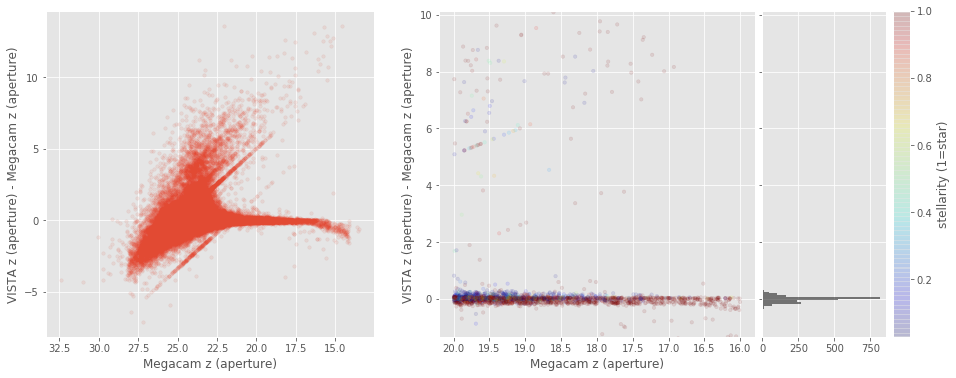

SUPRIME z (aperture) - DECam z (aperture):


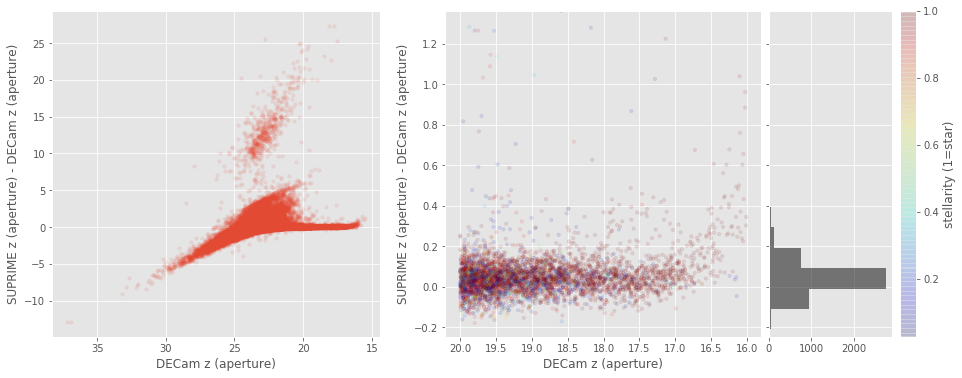

VISTA z (aperture) - DECam z (aperture):


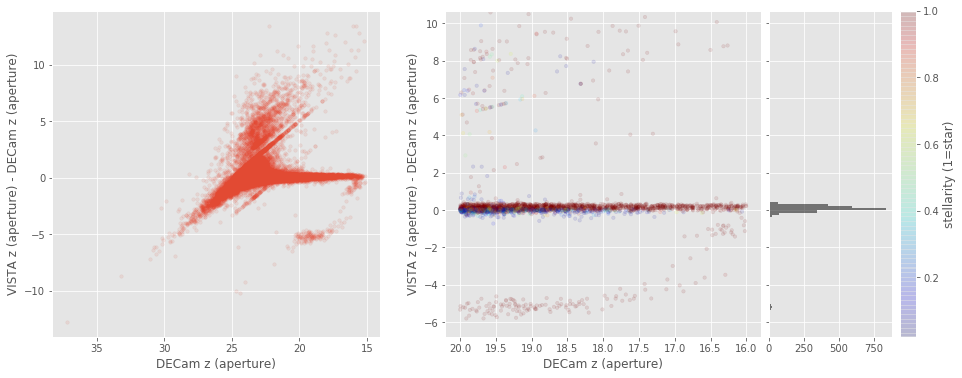

VISTA z (aperture) - SUPRIME z (aperture):


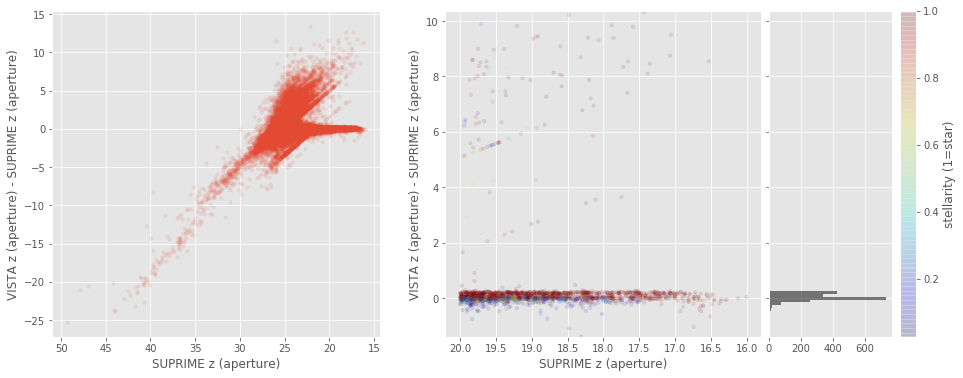

Megacam y (aperture) - GPC1 y (aperture):


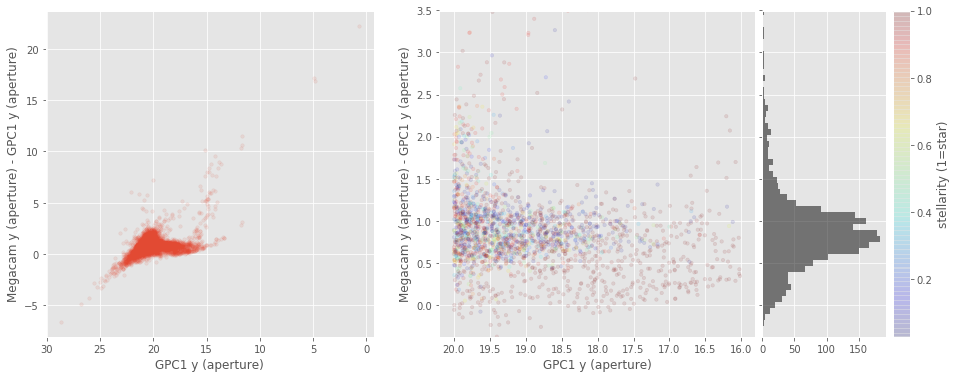

DECam y (aperture) - GPC1 y (aperture):


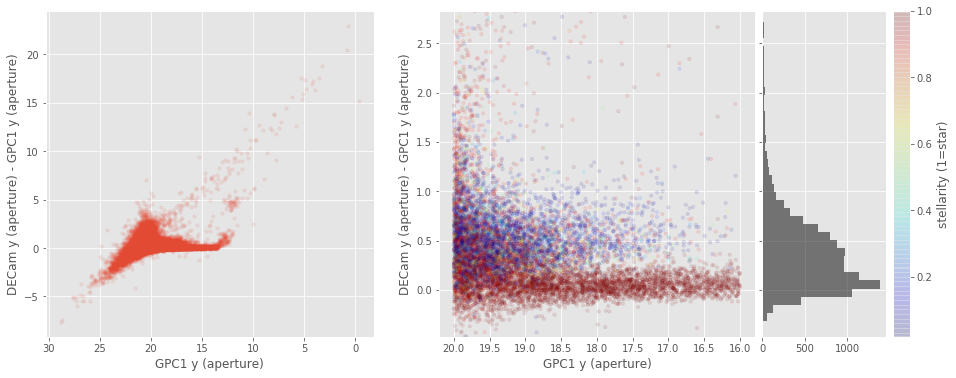

SUPRIME y (aperture) - GPC1 y (aperture):


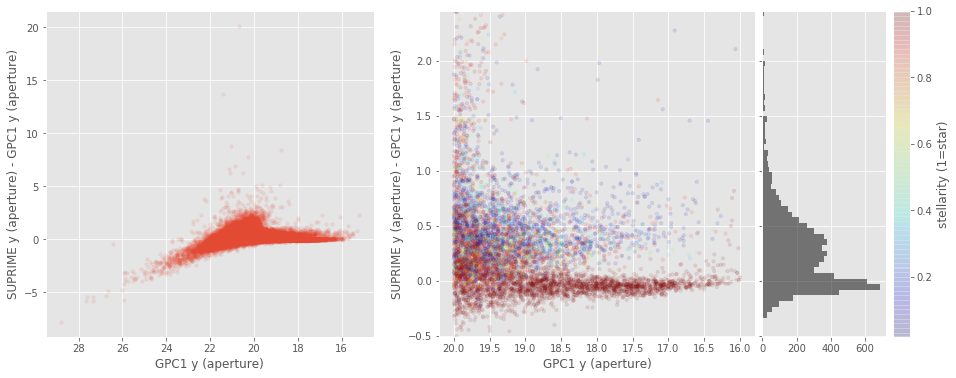

VISTA y (aperture) - GPC1 y (aperture):


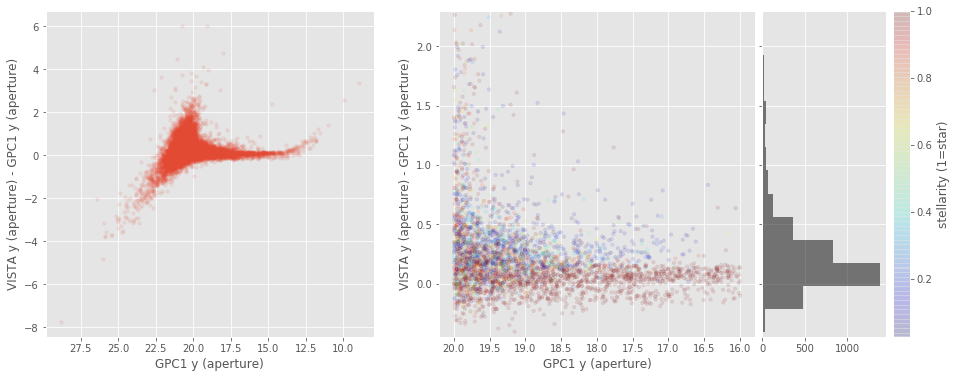

DECam y (aperture) - Megacam y (aperture):


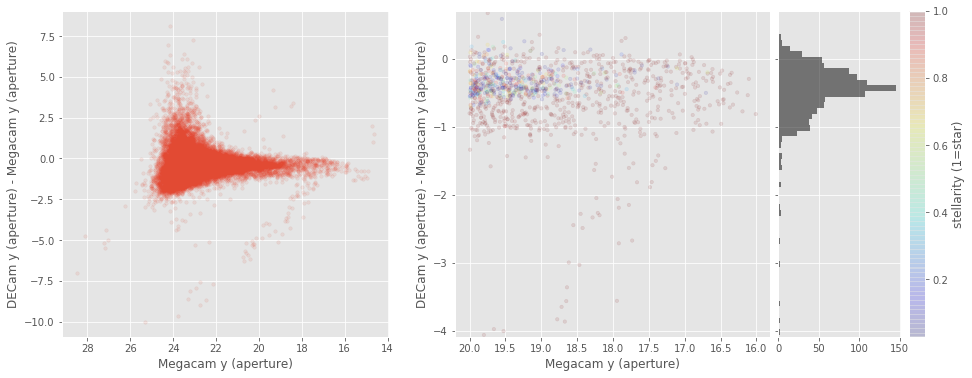

SUPRIME y (aperture) - Megacam y (aperture):


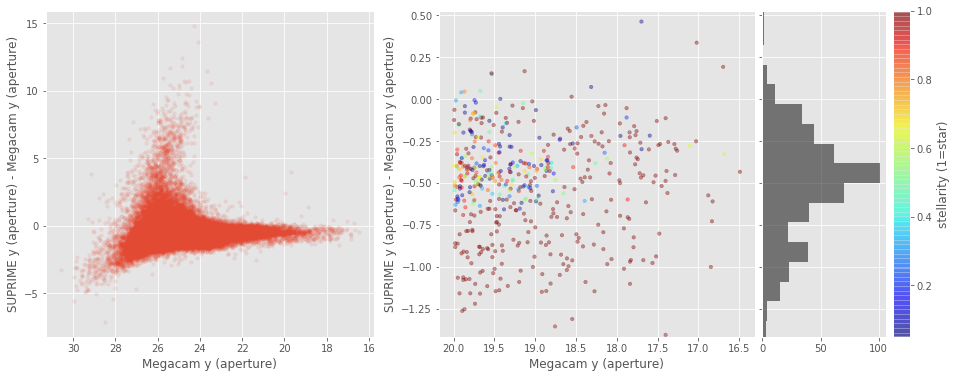

VISTA y (aperture) - Megacam y (aperture):


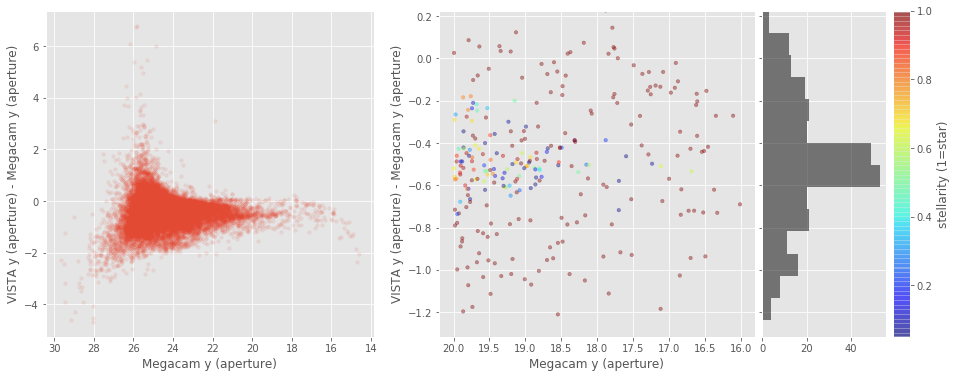

SUPRIME y (aperture) - DECam y (aperture):


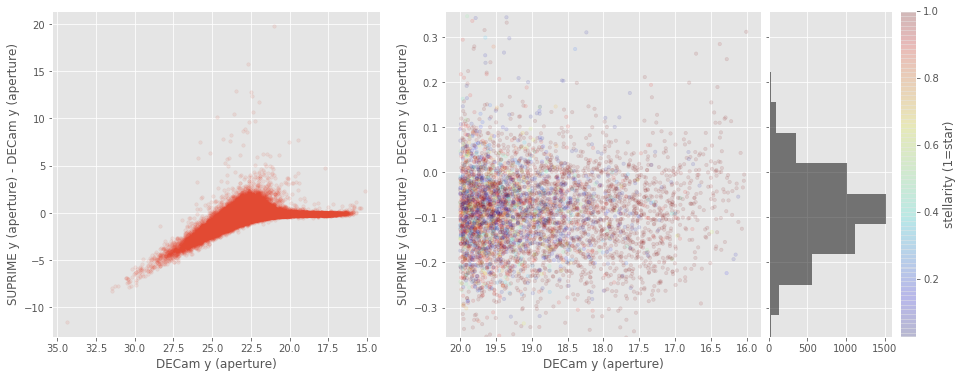

VISTA y (aperture) - DECam y (aperture):


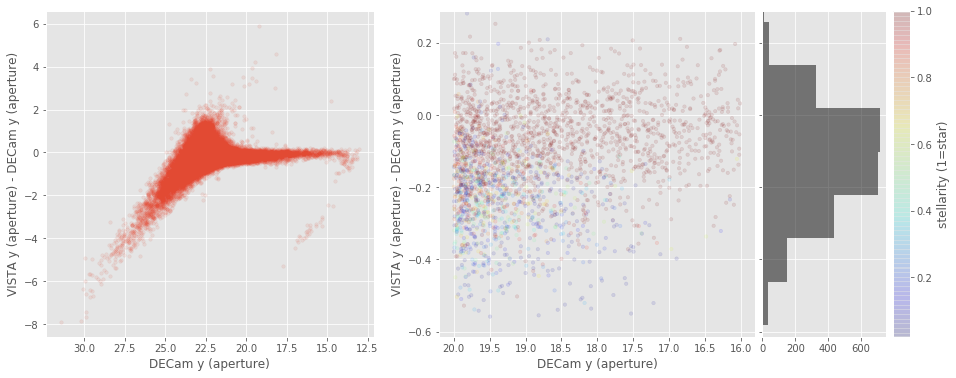

VISTA y (aperture) - SUPRIME y (aperture):


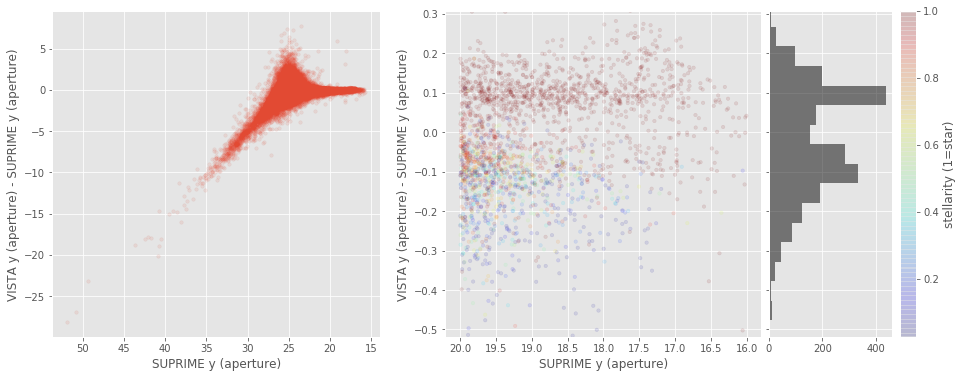

UKIDSS J (aperture) - VISTA J (aperture):


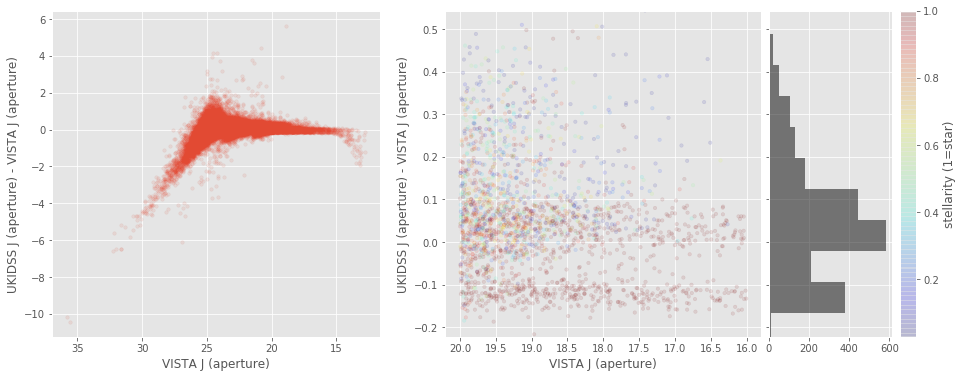

WIRCAM J (aperture) - VISTA J (aperture):


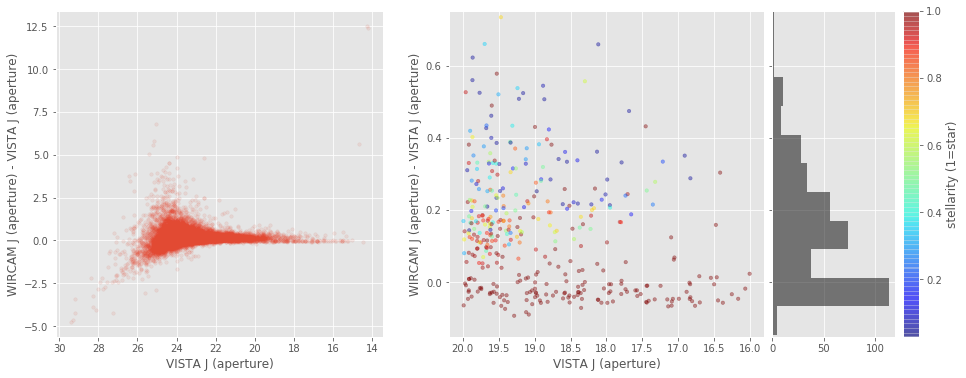

WIRCAM J (aperture) - UKIDSS J (aperture):


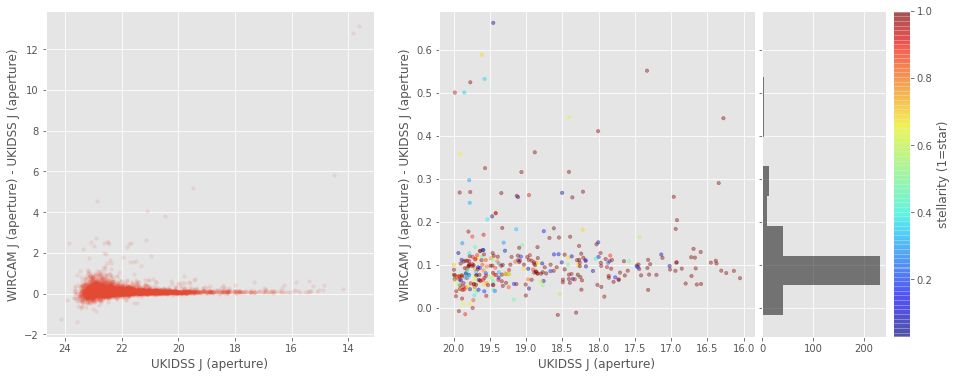

UKIDSS H (aperture) - VISTA H (aperture):


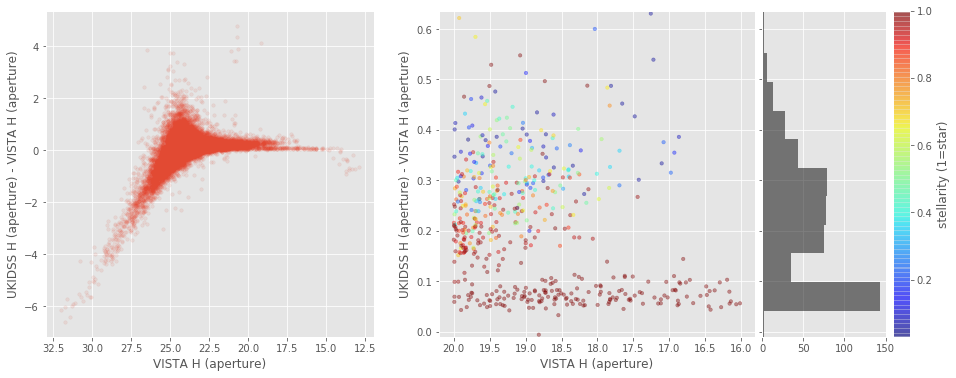

WIRCAM H (aperture) - VISTA H (aperture):


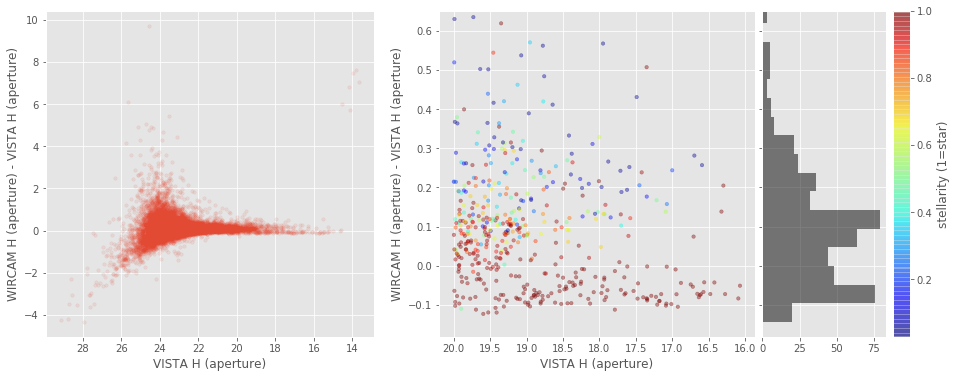

No sources have both UKIDSS H (aperture) and WIRCAM H (aperture) values.

UKIDSS K (aperture) - VISTA Ks (aperture):


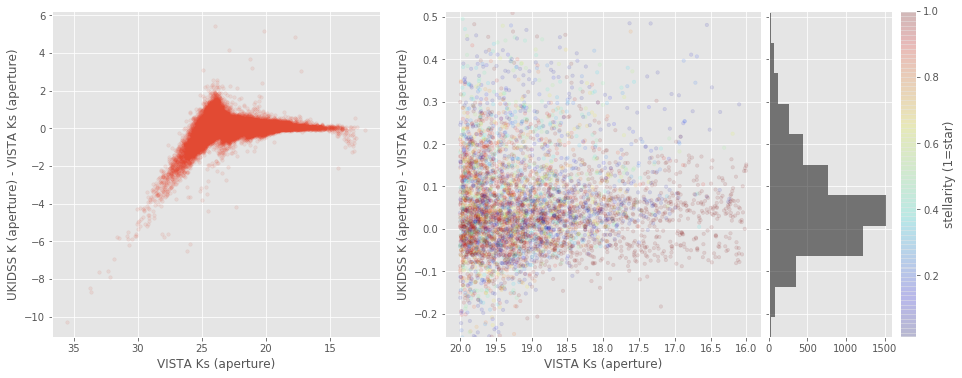

WIRCAM Ks (aperture) - VISTA Ks (aperture):


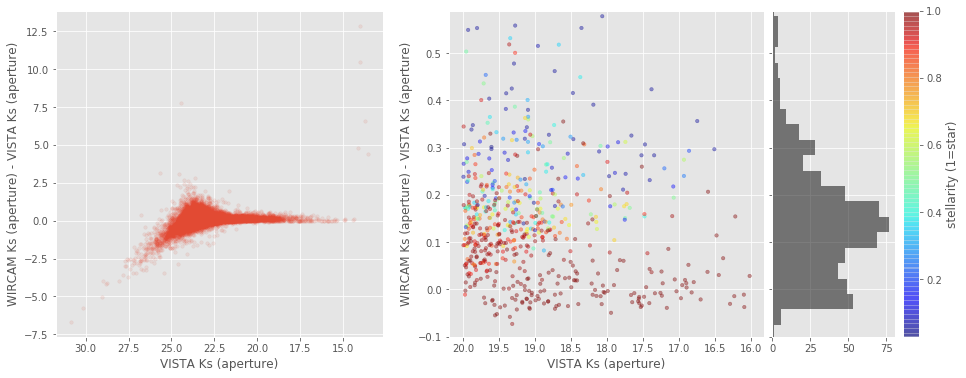

WIRCAM Ks (aperture) - UKIDSS K (aperture):


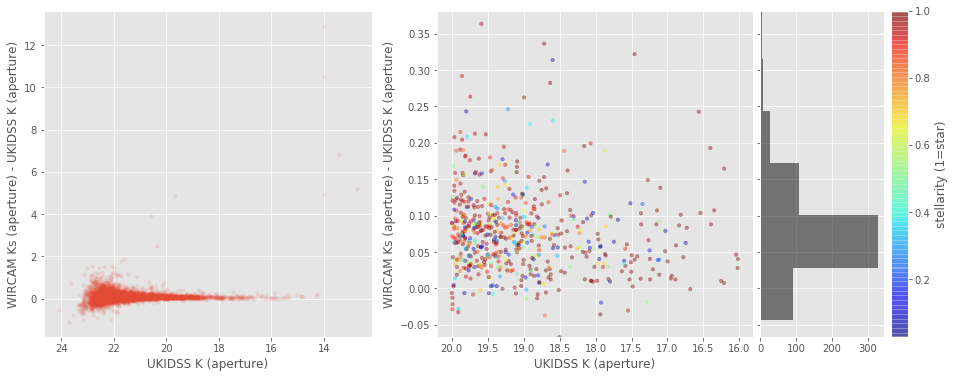

In [37]:
for band_of_a_kind in all_bands:
    for band1, band2 in itertools.combinations(band_of_a_kind, 2):

        basecol1, basecol2 = band1.replace(" ", "_").lower(), band2.replace(" ", "_").lower()
       
        if (basecol1 == "gpc1_z" and basecol2 == "decam_z"):
            savefig = True
        else:
            savefig = False
        
        # Aperture mag
        col1, col2 = "m_ap_{}".format(basecol1), "m_ap_{}".format(basecol2)

        apcor_check(master_catalogue[col1], master_catalogue[col2], master_catalogue['stellarity'],
                 labels=("{} (aperture)".format(band1), "{} (aperture)".format(band2)), savefig=savefig)

for j in range(40):
    plt.close()